# Exploratory Data Analysis #1: Comparison of Lexical, Linguistic, and Readability Features (On Five Fake News Datasets) for Improved Cross-Domain Fake News Detection with Feature Engineering and Selection Techniques

In this section, I will apply various feature extraction techniques ranging from calculating basic lexical statistics (e.g. mean number of words in a text for a dataset) to more advanced tools for calculating POS-tag distributions, or, sentiment scores using lexicons. The aim of this section is to identify how trends and tendencies between different features vary between real news and fake news texts across the 5 core datasets (as well as the 10 few-shot and zero-shot combined leave-one-out datasets). This can help in the construction of a more generalizable, fast, and explainable ML and feature-based detection system. For example, if news sentences are much longer on average for real news compared to fake news texts for the majority of datasets used, then this can be a useful feature for enhancing the generalizability of the ML-based classifier. In contrast, if the **difference** in mean word length (in characters) between real and fake news categories varies starkly between datasets (e.g. shorter words make a text more likely to be real news for *WELFake* data but more likely to be fake news for *Constraint* data), then selecting this feature can be less helpful for creating a more universal detection system. Additionally, selecting the most informative features can also enable the development of a more explainable detection app, which is the core aim of this project, as users can be shown global explanations for why certain linguistic or semantic features may influence a classifier into making certain predictions. 
    
As a result, I will begin by exploring the difference between distributions of different basic surface-text based statistics such as word length and lexical diversity, before proceeding to employ different NLP libraries such as textstat and SpaCy to extract more complex features such as readability scores and grammatical features (e.g. comparisons of mean number of modal verbs, kind of modal verbs used), gradually employing more advanced feature extraction and visualization techniques. I will also visualize key patterns in the datasets by using WordClouds to highlight the set difference between words appearing in only real vs only fake news articles, and visualizations of the key named entities differentiating fake from real news. The main objective of this analysis is to acquire an overview of which linguistic features and tendencies are most helpful for discriminating between real and fake news across five diverse and domain-specific source datasets, to ensure robustness and improve classifier performance on unseen data. Although there are hundreds if not thousands of research articles on fake news detection, few have focused in detail on the key tendecies in the distribution of both linguistic and semantic features across *a range of five fake-news datasets from different topics and social media platforms*. By evaluating and visualizing which features are the most consistent across datasets, the optimal features can be selected to improve the performance and interpretability of the Passive Aggressive Classifier.

For the purpose of this general exploratory analysis of the main characteristics and properties of the dataset, I will use the entire datasets (rather than solely the train split), as the key objective is to capture **global trends** and the most consistent patterns **across** the datasets as a whole, rather than directly training and tuning models. However, in the next step, when the features will actually be extracted and the model hyperparameters tuned (e.g. how many words to use for the TF-IDF vectorizer), only the training split will be used to prevent data leakage. The aim **here** is to recognize which features contain the greatest differences between real and fake news across the datasets, which requires analyzing **all available data** in order to capture patterns that could improve the generalizability of the final detection system. As such, using larger sample sizes help identify cross-dataset patterns with greater confidence, thus improving statistical validity and robustness of these observations. Examining how features are distributed across a whole dataset therefore decreases the risk of **sampling bias** that could arise from using only a small subset of the data, ensuring that the observed trends used to compare the datasets are truly valid and representative. This is especially important when dealing with diverse datasets that vary in topic, source, and platform. Finding consistent discriminative features across the highly different domains therefore benefits from using as much data as possible, but in the model tuning and development phase, only the proper train-validation-test splits will be used to avoid data leakage. 

In [2]:
# Import the required libraries
import os

# Basic text data analysis libraries here:
import pandas as pd
import numpy as np
from tqdm import tqdm
# Shows the progress of applying different functions for processing an entire column in pandas
tqdm.pandas()
# Enables string operations such as string.punctuation = a list of all standard Python punc chars
import string
import time

# Basic NLP libraries and downloading NLTK packages:
import nltk
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('universal_tagset')
nltk.download('stopwords')
# Get a set of stopwords for English (set = more efficient processing)
stopwords_set = set(stopwords.words('english'))
# Textstat library for calculating statistics from text: https://pypi.org/project/textstat/
# Includes useful metrics such as: Flesch-Kincaid readability score, Difficult Words score, SMOG index for
# calculating difficulty and complexity of language used in news texts
from textstat import textstat
import spacy

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import textwrap  

[nltk_data] Downloading package punkt to /Users/ophelia/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/ophelia/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package universal_tagset to
[nltk_data]     /Users/ophelia/nltk_data...
[nltk_data]   Package universal_tagset is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/ophelia/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
# Load in all of the training datasets for feature extraction and comparison

# Set up the root full-scale dataset path on my machine
root_fullscale_path = "../FPData/"

###################################### FULL-SCALE (Single Dataset) TRAINING DATA ###########################################################
welfake_train_path = os.path.join(root_fullscale_path, "WELFake/clean_all_train_wf.csv")
welfake_test_path = os.path.join(root_fullscale_path, "WELFake/clean_test_wf.csv")

fakeddit_train_path = os.path.join(root_fullscale_path, "Fakeddit/clean_all_train.csv")
fakeddit_test_path = os.path.join(root_fullscale_path, "Fakeddit/clean_test.csv")

constraint_train_path = os.path.join(root_fullscale_path, "Constraint/clean_all_train.csv")
constraint_test_path = os.path.join(root_fullscale_path, "Constraint/clean_test.csv")

politifact_train_path = os.path.join(root_fullscale_path, "PolitiFact/clean_all_train_pf.csv")
politifact_test_path = os.path.join(root_fullscale_path, "PolitiFact/clean_test_pf.csv")

gossipcop_train_path = os.path.join(root_fullscale_path, "GossipCop/clean_all_train_gc.csv")
gossipcop_test_path = os.path.join(root_fullscale_path, "GossipCop/clean_test_gc.csv")

####### Set up mixed few-shot (five-shot) and zero-shot TRAINING dataset paths (EXCLUDING target dataset's validation set) #################
# Reason for excluding the validation-set data from the mixed (4-source datasets) few-shot and five-shot datasets:
#     This is because the mixed (leave-one-target-dataset-out) datasets contain all the data from 4 datasets except the one
#.    that the classifier needs to be tested on (the "target") dataset. Therefore, while the classifiers should be tuned and optimized
#.    with different features and hyperparameters on the 4-source-mixed datasets using cross-validation, they ALSO need to be evaluated
#.    on data from the TARGET domain, and we should NOT use the target test-set before the best ML and DL classifiers are selected at the end, 
#.    , in order to avoid data leakage. As such, we need to do both cross-validation on the 4-SOURCE training data, AS WELL AS evaluating 
#.    on the validation TARGET  data, so we take only the training data from each of the 4-source datasets for each few-shot and five-shot
#.    dataset, leaving validation data out to prevent data leakage from validation to training sets when evaluating on the "target"
#.    validation set. This constrasts with the single-dataset full-scale scenario datasets, where the validation subsets in cross-validation
#.    are from the SAME dataset as the test set. This experimental set up has been configured to select classifiers with the
#.    best generalizationa across domains and datasets.
root_fewshot_path = "../FPData/CleanFewShotDatasets_withoutValSets/"
welfake_target_fiveshot_path = os.path.join(root_fewshot_path, "five_shot_train_data_except_welfake.csv")
fakeddit_target_fiveshot_path = os.path.join(root_fewshot_path, "five_shot_train_data_except_fakeddit.csv")
constraint_target_fiveshot_path = os.path.join(root_fewshot_path, "five_shot_train_data_except_constraint.csv")
politifact_target_fiveshot_path = os.path.join(root_fewshot_path, "five_shot_train_data_except_politifact.csv")
gossipcop_target_fiveshot_path = os.path.join(root_fewshot_path, "five_shot_train_data_except_gossipcop.csv")

root_zeroshot_path = "../FPData/CleanZeroShotDatasets_withoutValSets/"
welfake_target_zeroshot_path = os.path.join(root_zeroshot_path, "zero_shot_train_data_except_welfake.csv")
fakeddit_target_zeroshot_path = os.path.join(root_zeroshot_path, "zero_shot_train_data_except_fakeddit.csv")
constraint_target_zeroshot_path = os.path.join(root_zeroshot_path, "zero_shot_train_data_except_constraint.csv")
politifact_target_zeroshot_path = os.path.join(root_zeroshot_path, "zero_shot_train_data_except_politifact.csv")
gossipcop_target_zeroshot_path = os.path.join(root_zeroshot_path, "zero_shot_train_data_except_gossipcop.csv")

# Full-scale train datasets
wf_df_train = pd.read_csv(welfake_train_path)
fe_df_train = pd.read_csv(fakeddit_train_path)
ct_df_train = pd.read_csv(constraint_train_path)
pf_df_train = pd.read_csv(politifact_train_path)
gc_df_train = pd.read_csv(gossipcop_train_path)

# Full-scale test datasets
wf_df_test = pd.read_csv(welfake_test_path)
fe_df_test = pd.read_csv(fakeddit_test_path)
ct_df_test = pd.read_csv(constraint_test_path)
pf_df_test= pd.read_csv(politifact_test_path)
gc_df_test = pd.read_csv(gossipcop_test_path)

# Concatenated (train AND test) full-scale datasets
wf_df = pd.concat([wf_df_train, wf_df_test], ignore_index=True)
fe_df = pd.concat([fe_df_train, fe_df_test], ignore_index=True)
ct_df = pd.concat([ct_df_train, ct_df_test], ignore_index=True)
pf_df = pd.concat([pf_df_train, pf_df_test], ignore_index=True)
gc_df = pd.concat([gc_df_train, gc_df_test], ignore_index=True)

# Five-shot train datasets
wf_target_fiveshot_df = pd.read_csv(welfake_target_fiveshot_path)
fe_target_fiveshot_df = pd.read_csv(fakeddit_target_fiveshot_path)
ct_target_fiveshot_df = pd.read_csv(constraint_target_fiveshot_path)
pf_target_fiveshot_df = pd.read_csv(politifact_target_fiveshot_path)
gc_target_fiveshot_df = pd.read_csv(gossipcop_target_fiveshot_path)

# Zero-shot train datasets
wf_target_zeroshot_df = pd.read_csv(welfake_target_zeroshot_path)
fe_target_zeroshot_df = pd.read_csv(fakeddit_target_zeroshot_path)
ct_target_zeroshot_df = pd.read_csv(constraint_target_zeroshot_path)
pf_target_zeroshot_df = pd.read_csv(politifact_target_zeroshot_path)
gc_target_zeroshot_df = pd.read_csv(gossipcop_target_zeroshot_path)

In [4]:
wf_df_train["label"].value_counts()[0]

27641

## 1. Summary Statistics: Dataset Sizes and Class Label Counts (How Many Fake and Real News Texts in Each Dataset)?

### Analysis of Dataset Sizes


In [4]:
print(f"Size of whole WELFake dataset: {len(wf_df)}")
print(f"Size of whole Fakeddit dataset: {len(fe_df)}")
print(f"Size of whole Constraint dataset: {len(ct_df)}")
print(f"Size of whole PolitiFact dataset: {len(pf_df)}")
print(f"Size of whole GossipCop dataset: {len(gc_df)}")
print("\n")

def calculateTestTrainRatio(train_df, test_df):
    train_size = len(train_df)
    test_size = len(test_df)
    total_size = train_size + test_size
    train_proportion = (train_size / total_size) * 100
    test_proportion = (test_size / total_size) * 100
    return (train_proportion, test_proportion)

welfake_proportions = calculateTestTrainRatio(wf_df_train, wf_df_test)
fakeddit_proportions = calculateTestTrainRatio(fe_df_train, fe_df_test)
constraint_proportions = calculateTestTrainRatio(ct_df_train, ct_df_test)
politifact_proportions = calculateTestTrainRatio(pf_df_train, pf_df_test)
gossipcop_proportions = calculateTestTrainRatio(gc_df_train, gc_df_test)

print(f"WELFake train-test proportion: {welfake_proportions[0]}% : {welfake_proportions[1]}%")
print(f"Fakeddit train-test proportion: {fakeddit_proportions[0]}% : {fakeddit_proportions[1]}%")
print(f"Constraint train-test proportion: {constraint_proportions[0]}% : {constraint_proportions[1]}%")
print(f"PolitiFact train-test proportion: {politifact_proportions[0]}% : {politifact_proportions[1]}%")
print(f"GossipCop train-test proportion: {gossipcop_proportions[0]}% : {gossipcop_proportions[1]}%")

Size of whole WELFake dataset: 62122
Size of whole Fakeddit dataset: 789503
Size of whole Constraint dataset: 10626
Size of whole PolitiFact dataset: 666
Size of whole GossipCop dataset: 17173


WELFake train-test proportion: 81.91140014809568% : 18.088599851904316%
Fakeddit train-test proportion: 90.99496772019866% : 9.005032279801343%
Constraint train-test proportion: 80.03011481272351% : 19.969885187276493%
PolitiFact train-test proportion: 81.08108108108108% : 18.91891891891892%
GossipCop train-test proportion: 81.37192103884004% : 18.62807896115996%


- On the one hand, is important to keep a similar (about 80%-20% in this case) train-test split performance over the datasets in order to be able to compare results in a way that does not confound findings.
- However, using a different train-test split for a well-established benchmark dataset (e.g. Fakeddit) published on a public GitHub repository or competition page can mean that results are difficult to compare to published benchmarks, as a different test-set split is being used.
- Therefore, I decided to keep the same train-test split for the Fakeddit dataset as was published on the original repository (about 90-10 percent split instead of 80-20) for comparability and reproducibility of results. Additionally, the Fakeddit dataset is very large compared to the other datasets, with almost 1 million samples, meaning that the smaller proportion of the test set should not matter as much as there is sufficient testing data available to analyze performance, which would not be the case if this were a much smaller dataset (like the PolitiFact dataset with less than 700 samples).

In [5]:
## Visualize class distribution per dataset

def visualizeClassDistribution(df, dataset_name, ax):
    
    label_counts = df["label"].value_counts()
    total_rows = len(df)
    real_news_count = label_counts[0]
    fake_news_count = label_counts[1]
    percentage_real_news = (real_news_count / total_rows) * 100
    percentage_fake_news = (fake_news_count / total_rows) * 100

    # Create a seaborn countplot
    class_count_plot = sns.countplot(data=df, x="label", hue="label", palette=["blue", "red"], ax=ax, legend=False)

    # Customize the plot with title and x- and y-axes' labels
    title = f"{dataset_name} - Class Distribution"
    wrapped_title = textwrap.fill(title, width=20)  # Max 20 chars per line (to avoid overlapping titles)
    ax.set_title(wrapped_title, pad=5)
    x_label_text = "Class Label (0 = Real News, 1 = Fake News)"
    wrapped_x_label = textwrap.fill(x_label_text, width=20)
    ax.set_xlabel(wrapped_x_label)
    ax.set_ylabel("Number of news texts")

    # Add counts at the center of each bar (center them horizontally and vertically)
    for patch, count in zip(class_count_plot.patches, label_counts): # Iterate over the (bar/rectangle called a "patch", label count tuples)
        height = patch.get_height()  # Extract the height of the bar/patch
        # Calculate the centred horizontal and vertical positions of the count label
        x_center = patch.get_x() + patch.get_width() / 2
        y_center = height / 2  # Place the count in the center vertically
        ax.text(x_center, y_center, str(count), ha='center', va='center', color='white')

    # Add the percentage labels to each bar ("patch" or Rectangle object) to 1 decimal place
    for patch, percentage in zip(class_count_plot.patches, [percentage_real_news, percentage_fake_news]):
        height = patch.get_height()  # Height of the bar
        ax.text(patch.get_x() + patch.get_width() / 2, height + 1, f"{percentage:.1f}%", ha='center', va='bottom')
    
    plt.tight_layout()



# New function to generate a 4x5 grid of class distribution plots for all 20 full-scale, few-shot and zero-shot datasets
def visualizeAndCompareAllClassDistributions(dfs, dataset_names):

    # Create the 4x5 grid of subplots
    fig, axes = plt.subplots(4, 5, figsize=(15, 20))  # 4 rows and 5 columns
    axes = axes.flatten()  # Flatten the 2D array of axes to easily iterate over axes (i.e. the plots are called "axes" in matplotlib)

    # Loop over each dataset + its name, and access the right plot/axis using the axes array
    for axes_index, (df, dataset_name) in enumerate(zip(dfs, dataset_names)):
        visualizeClassDistribution(df, dataset_name, axes[axes_index])

    # Adjust the layout and add more space between the rows (increase hspace)
    plt.subplots_adjust(hspace=0.6) 

    # Adjust the layout and display the plot
    plt.show()

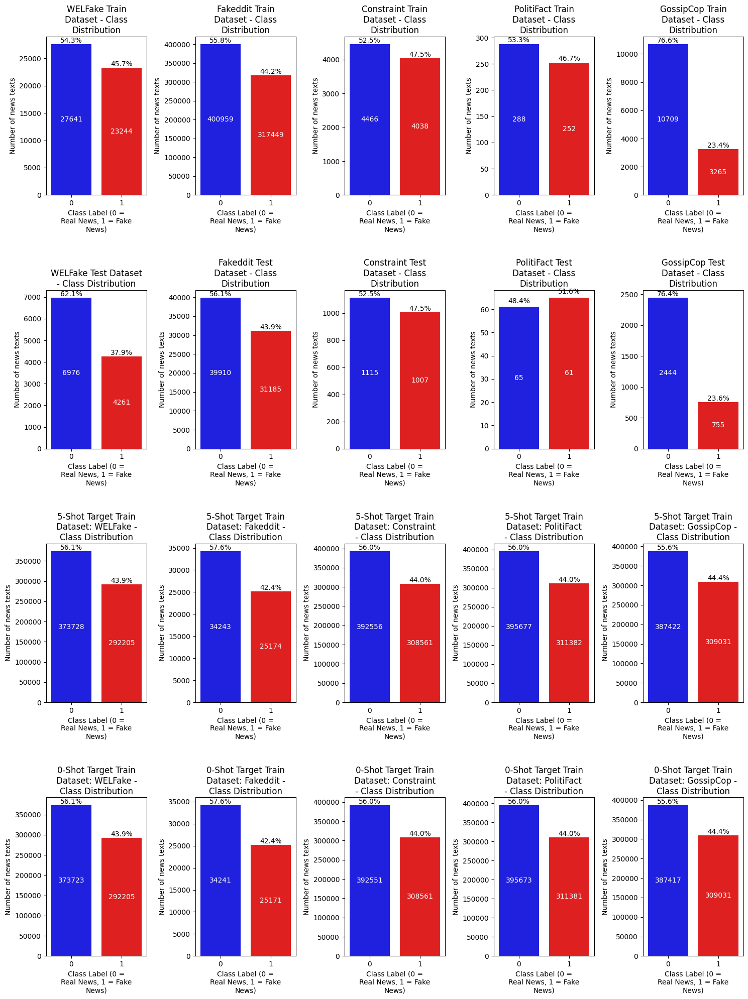

In [6]:
# Visualize the class distributions
all_datasets_list = [
    wf_df_train, fe_df_train, ct_df_train, pf_df_train, gc_df_train,
    wf_df_test, fe_df_test, ct_df_test, pf_df_test, gc_df_test,
    wf_target_fiveshot_df, fe_target_fiveshot_df, ct_target_fiveshot_df, pf_target_fiveshot_df, gc_target_fiveshot_df,
    wf_target_zeroshot_df, fe_target_zeroshot_df, ct_target_zeroshot_df, pf_target_zeroshot_df, gc_target_zeroshot_df
]

all_datasets_names = [
    "WELFake Train Dataset", "Fakeddit Train Dataset", "Constraint Train Dataset", "PolitiFact Train Dataset", "GossipCop Train Dataset",
    "WELFake Test Dataset", "Fakeddit Test Dataset", "Constraint Test Dataset", "PolitiFact Test Dataset", "GossipCop Test Dataset",
    "5-Shot Target Train Dataset: WELFake", "5-Shot Target Train Dataset: Fakeddit", "5-Shot Target Train Dataset: Constraint",
    "5-Shot Target Train Dataset: PolitiFact", "5-Shot Target Train Dataset: GossipCop",
    "0-Shot Target Train Dataset: WELFake", "0-Shot Target Train Dataset: Fakeddit", "0-Shot Target Train Dataset: Constraint",
    "0-Shot Target Train Dataset: PolitiFact", "0-Shot Target Train Dataset: GossipCop",
]
visualizeAndCompareAllClassDistributions(all_datasets_list, all_datasets_names)

- For the full-scale datasets, the class proportions in the train set are similar to those of the test sets, which is important to ensure for robust evaluation of performance.
- It is apparent from these plots above that the datasets contain imbalanced class distributions: on the whole, there are about 5-10% more real news than fake news samples, with the exception of the GossipCop training data, where the class imbalanced is much more pronounced (76.6% real, 23.4% fake only for the training dataset).
- As a result, one shouldn't rely simply on accuracy for performance evaluation, and use metrics that represent the performance on the minority (fake news) class such as precision, recall, and F1-scores, in addition to confusion matrices to highlight performance on the smaller class. This is particularly important for this use case, where identifying examples of the fake (minority) news class as fake can be more important in many contexts than precision on the majority (real) class.

## 2. Analysis and Visualization of Lexical (Word and Phrase) Level Features

The aim of this section is to identify and highlight the differences between word and phrase level features between fake news and real news articles. 

- This is important to either confirm or reject the hypothesis that "fake news texts contain different lexical patterns (word length, sentence length, patterns of parts-of-speech used e.g. modal verbs, lexical diversity, and so on) to real, legitimate news". 

- Furthermore, this analysis enable the identification of more informative features to include when encoding the feature matrix for binary classification with machine-learning algorithms.

- Additionally, including the differences between lexical and stylistic features for real news and fake news can help yield global (i.e. related to the dataset and model overall) and local (i.e. related to individual predictions) explanations for *why* certain news is classified as fake: this is required given the user requirements for greater transparency and explainability of fake news detection models, as documented in both the domain literature and initial surveys.

Moreover, an analysis of news' lexical features can help pinpoint the reasons why traditional, efficient and low-resource classifiers struggle to identify patterns separating real and fake news in the five-shot and zero-shot scenarios, due to the difference in fake-real news distributions between different datasets/domains. As a result, it can reveal the main ways in which fake news predictors differ across domains and help to mitigate the challenge of cross-domain generalization across datasets.

In [7]:
# Create new class containing methods for calculating and displaying the lexical features for an inputted fake news dataset DataFrame
class LexicalFeatureAnalyzer:
    
    
    def __init__(self):
        pass
        
        
    def calculateBasicTextStatistics(self, df, dataset_name):
        """
        This method calculates various lexical features such as word length, sentence count, 
        punctuation count, lexical diversity, etc., for a given dataset and returns these statistics.
        """
    
        # Create a copy of the original DataFrame for processing statistics
        stats_df = df.copy(deep=True)
        
        # Tokenizing words and sentences (without excessive whitespace for progress bar)
        print("#1. Tokenizing words...")
        stats_df["words"] = stats_df["text"].progress_apply(word_tokenize)
        print("#2. Tokenizing sentences...")
        stats_df['sents'] = stats_df["text"].progress_apply(sent_tokenize)
        
        # Calculate word-level statistics
        print("#3. Calculating word lengths...")
        stats_df["word_lengths"] = stats_df["words"].progress_apply(lambda word_tokens: [len(word_token) for word_token in word_tokens if word_token.isalnum()])
        print("#4. Calculating number of words in the texts...")
        stats_df["length_of_text"] = stats_df["words"].progress_apply(lambda word_tokens: sum(1 for word_token in word_tokens if word_token.isalnum()))
        
        # Calculate sentence-level statistics
        print("#5. Calculating sentence count...")
        stats_df["sent_count"] = stats_df["sents"].progress_apply(len)
        print("#6. Calculating sentence lengths...")
        stats_df["sent_lengths"] = stats_df["sents"].progress_apply(lambda sents: [len(word_tokenize(sent)) for sent in sents])
        print("#7. Calculating mean sentence lengths per text...")
        stats_df["mean_sentence_length"] = stats_df["sent_lengths"].progress_apply(np.mean)
        
        # Calculate the standard deviation of sentence lengths
        mean_sentence_lengths = stats_df["mean_sentence_length"].dropna()
        sentence_length_stddev = np.std(mean_sentence_lengths)
        
        # Punctuation usage patterns
        print("#8. Counting exclamation marks...")
        stats_df["exclamation_point_count"] = stats_df["text"].str.count('!')
        print("#9. Counting ellipses...")
        stats_df["ellipsis_count"] = stats_df["text"].str.count(r'\.{3,}')
        print("#10. Counting punctuation...")
        stats_df["punctuation_count"] = stats_df["text"].progress_apply(lambda x: sum(1 for char in x if char in string.punctuation))
        
        # Calculate lexical diversity
        print("#11. Calculating lexical diversity per text...")
        stats_df["lexical_diversity"] = stats_df["words"].progress_apply(lambda word_tokens: len(set(word_tokens)) / len(word_tokens) if len(word_tokens) > 0 else 0)
        
        print("#12. Calculating mean scores...")
        # Calculate average scores for the whole dataset
        average_scores_dict = {
            "mean_word_length": np.mean(stats_df["word_lengths"].progress_apply(np.mean)), 
            "mean_text_length_in_word_tokens": np.mean(stats_df["length_of_text"]),
            "mean_sentence_count": np.mean(stats_df["sent_count"]),
            "mean_sentence_length": np.mean(stats_df["sent_lengths"].progress_apply(np.mean)),
            "mean_sentence_length_std": sentence_length_stddev,
            "mean_excl_point_count": np.mean(stats_df["exclamation_point_count"]),
            "mean_ellipsis_count": np.mean(stats_df["ellipsis_count"]),
            "mean_punc_count": np.mean(stats_df["punctuation_count"]),
            "mean_lexical_diversity": np.mean(stats_df["lexical_diversity"]),
        }
    
        # Convert dictionary to pandas DataFrame; add row index to name dataframe after the inputted DataFrame
        average_scores_df = pd.DataFrame([average_scores_dict], index=[f"{dataset_name}"])
        
        print(f"Average Lexical Feature Stats for {dataset_name}\n: {average_scores_df}\n\n")
        
        return stats_df, average_scores_dict, average_scores_df

    def visualizeTextLengthViolinPlotByNumWordTokens(self, list_of_df_tuples, list_of_dataset_names):
        """
            For a list of tuples, where each tuple contains two pandas DataFrames: 
            one for real and one for fake news for each dataset, containing a column for text length (number of word tokens)
            per text, this function creates a grid of boxplot charts, where each chart compares distribution of text length
            (in word tokens) per dataset (real contra fake news), across the 15 training datasets.
            
            Input Parameters:
                list_of_df_tuples (list of tuples): A list where each tuple contains two DataFrames (real and fake news data containing
                text word tokens counts for each dataset).
                list_of_dataset_names: A list storing names of each dataset for titling.
        """
        # Configure the 15x8 inch plots
        fig, axes = plt.subplots(5, 3, figsize=(15, 8), constrained_layout=True)
        axes = axes.flatten()

        # Iterate over the datasets
        for idx, (real_news_df, fake_news_df) in enumerate(list_of_df_tuples):

            # Combine real and fake news DataFrames into a single DataFrame for easier plotting, as sns boxplot requires a single DataFrame and categorical (Real versus Fake) columns for plotting
            all_news_df = pd.DataFrame({
                "Text Length by Word Tokens": pd.concat([real_news_df["length_of_text"], fake_news_df["length_of_text"]]),
                "News Category": ["Real"] * len(real_news_df) + ["Fake"] * len(fake_news_df)
            }) # Creates a new DataFrame containing just real/fake categories and associated text length (num tokens per text) for this dataset)
    
             # Create a boxplot for comparing text length distribution between real and fake news using
            ax = axes[idx]
            
            sns.violinplot(
                x="Text Length by Word Tokens",
                y="News Category",
                data=all_news_df,
                ax=ax,
                hue="News Category",
                palette={"Real": "blue", "Fake": "red"},
                inner="quartile",  # Show quartiles inside violin plots
                density_norm="width"  # Scales the width of violin plots by the by data count
            )
            
            # Set title and labels
            ax.set_title(f"{list_of_dataset_names[idx]}", fontsize=10)
            ax.set_ylabel("")  # Remove individual y-axis label
            ax.set_xlabel("")  # Remove individual x-axis label
            
        # Set x-label at the bottom of grid, as it's the same for every plot = avoids redundancy, enhacing readability
        fig.supxlabel("Text Length (Words)", fontsize=12)
        fig.supylabel("News Category", fontsize=12)

        # Add main title
        fig.suptitle("Violin Plots showing Word Length (Word Tokens) Distribution: Comparison Between Real and Fake News for All 15 Datasets", fontsize=16)

        # Show the plot
        plt.show()
        

    def visualizeTextLengthViolinPlotByNumberOfSentences(self, list_of_df_tuples, list_of_dataset_names):
        """
            For a list of tuples, where each tuple contains two pandas DataFrames: 
            one for real and one for fake news for each dataset, containing a column for sentence lengths
            (number of sentence tokens per text), this function creates a grid of violin plots. Each chart compares
            the distribution of text sizes by number of sentences per dataset (real vs. fake news), across datasets.
            
            Input Parameters:
                list_of_df_tuples (list of tuples): A list where each tuple contains two DataFrames (real and fake news data
                containing sentence token counts for each dataset).
                list_of_dataset_names: A list storing names of each dataset for titling.
        """
        # Configure the 15x8 inch plots
        fig, axes = plt.subplots(5, 3, figsize=(15, 8), constrained_layout=True)
        axes = axes.flatten()

         # Iterate over the datasets
        for idx, (real_news_df, fake_news_df) in enumerate(list_of_df_tuples):
    
            # Combine real and fake news DataFrames into a single DataFrame for easier plotting
            all_news_df = pd.DataFrame({
                "Text Length by Number of Sentences": pd.concat([real_news_df["sent_count"], fake_news_df["sent_count"]]),
                "News Category": ["Real"] * len(real_news_df) + ["Fake"] * len(fake_news_df)
            })  # Create the combined DataFrame with sentence lengths and news categories

             # Create the violin plot for the dataset
            ax = axes[idx]
            sns.violinplot(
                x="Text Length by Number of Sentences",
                y="News Category",
                data=all_news_df,
                ax=ax,
                hue="News Category",
                palette={"Real": "blue", "Fake": "red"},
                inner="quartile",
                density_norm="width"
            )
    
            # Set title and labels
            ax.set_title(f"{list_of_dataset_names[idx]}", fontsize=10)
            ax.set_ylabel("")  # Remove individual y-axis label
            ax.set_xlabel("")  # Remove individual x-axis label

        # Set shared labels
        fig.supxlabel("Number of sentences in text", fontsize=12)
        fig.supylabel("News Category", fontsize=12)

        # Add the main title
        fig.suptitle("Violin Plots Showing Sentence Count Distribution: Comparison Between Real and Fake News for All Datasets", fontsize=16)

    
    def displayRealVsFakeWordCloudsForDatasets(self, list_of_df_tuples, list_of_dataset_names, stopwords_set=stopwords_set):
        """
            Show WordClouds of the set difference (relative complement) for fake news and real news for each dataset.
            This means show word cloud usin words ONLY in real news or ONLY in fake news, but excluding the intersection of both 
        """
        
        # Get num of total datasets to do pairs of WordClouds for
        num_datasets = len(list_of_df_tuples)
        
        # Configure the figure: one row, 2 columns (real vs fake news)
        fig, axes = plt.subplots(num_datasets, 2, figsize=(15, 6 * num_datasets), constrained_layout=True)
    
        # Iterate through the datasets and generate the word clouds
        for idx, ((real_news_df, fake_news_df), dataset_name) in enumerate(zip(list_of_df_tuples, list_of_dataset_names)):
            
            print(f"Generating word cloud pair number {idx + 1} out of {len(list_of_df_tuples)} datasets...")
    
            # Combine all text from the real and fake news datasets into single strings
            real_news_text = " ".join(real_news_df["text"].tolist())
            fake_news_text = " ".join(fake_news_df["text"].tolist())
            
             # Lowercase and tokenize the text to get a list of words
            real_news_words = word_tokenize(real_news_text.lower())
            fake_news_words = word_tokenize(fake_news_text.lower())

            # Create frequency distributions of all the words in the real and fake news sets for this dataset
            real_news_word_count = FreqDist(real_news_words)
            fake_news_word_count = FreqDist(fake_news_words)

            # Identify the intersection words (common words belonging to both fake and real news datasets)
            common_words = set(real_news_words).intersection(set(fake_news_words))

            # Create dictionaries of the words that are only in either the real or the fake news set
            real_unique_words = {word: real_news_word_count[word] for word in real_news_word_count if word not in common_words}
            fake_unique_words = {word: fake_news_word_count[word] for word in fake_news_word_count if word not in common_words}
            
            # Generate word clouds for unique words in real and fake news
            real_news_wordcloud = WordCloud(
                stopwords=stopwords_set,
                background_color="white",  # Default = "black"
                width=800,
                height=400,
                max_words=200,  # Limit number of words
                min_font_size=10,  # Smallest font size to use
                min_word_length=4,
                colormap="viridis"
            ).generate_from_frequencies(real_unique_words)
    
            fake_news_wordcloud = WordCloud(
                stopwords=stopwords_set,
                width=800,
                height=400,
                max_words=200,
                min_font_size=10,
                min_word_length=4,
                colormap="inferno"
            ).generate_from_frequencies(fake_unique_words)
            
            # Display real news word cloud (left column)
            axes[idx][0].imshow(real_news_wordcloud, interpolation="bilinear")
            axes[idx][0].set_title(f"{dataset_name} (Unique Real News)", fontsize=12)
            axes[idx][0].axis("off")
            
            # Display fake news word cloud (right column)
            axes[idx][1].imshow(fake_news_wordcloud, interpolation="bilinear")
            axes[idx][1].set_title(f"{dataset_name} (Unique Fake News)", fontsize=12)
            axes[idx][1].axis("off")
        
        # Main title for the grid
        fig.suptitle("Word Clouds for Unique Real and Fake News Across All Datasets", fontsize=16)
    plt.show()

    
        
    def visualizeAndCompareLexicalFeatureAveragesOnGrid(self, lex_feat_df, feature_column_name, feature_name_for_title):
        # Separate rows real and fake news rows
        # Extract rows with "Real News" in the "Dataset Name"
        real_news_rows = lex_feat_df["Dataset Name"].str.contains("Real News")
        # Take all the rows that do NOT contain "Real News" in their name for Fake News using negation operator
        fake_news_rows = ~real_news_rows

        # Extract the feature you're interested in plotting and comparing on the chart grid, e.g. "mean_word_length"
        real_scores = lex_feat_df[real_news_rows][feature_column_name].values # Filter for this feature's values for REAL news across all datasets
        fake_scores = lex_feat_df[fake_news_rows][feature_column_name].values # Filter for this feature's values for FAKE news across all datasets
        
        # Extract name of dataset from the Dataset Name col by removing the colon and the "Real News"/"Fake News" string after it
        # 1. Use .str.split to split on the colon
        # 2. Use .str again to select the first element (dataset name) in the split list
        # 3. Use .values to convert the indexed Series into an array (i.e. removes the redundant Index)
        dataset_names = lex_feat_df[real_news_rows]["Dataset Name"].str.split(":").str[0].values

        # Plot configuration: set the overall figsize to 15x15 inches, use constrained_layout to automatically configure spacing and prevent overlapping
        fig, axes = plt.subplots(3, 5, figsize=(15, 12), constrained_layout=True)
        axes = axes.flatten()
    
        for idx, ax in enumerate(axes):
            # Implement a quick check to not break the code if too many axes generated for dataset number by mistake
            if idx < len(dataset_names):
                # Create a bar chart for real and fake news and value counts for each specific dataset; real news in blue and fake news in red
                ax.bar(["Real", "Fake"], [real_scores[idx], fake_scores[idx]], color=["blue", "red"])
                # Set the title of each sub-plot to refer to the dataset the scores are for
                ax.set_title(f"{dataset_names[idx]}", fontsize=10)
                ax.set_ylabel(feature_name_for_title) # Set y-label to the feature being compared, inputted as "feature_name_for_title" to this method
            else:
                # Hides unusued subplots if not enough dataset names
                ax.axis("off")

        # Add a main title for the entire grid
        fig.suptitle(f"Comparison of {feature_name_for_title} in Real and Fake News for All 15 Training Datasets", fontsize=16)

        # Show the plot
        plt.show()

In [8]:
# Instantiate the lexical features extractor
lex_extractor = LexicalFeatureAnalyzer()

In [5]:
wf_df_real = wf_df[wf_df["label"] == 0]
wf_df_fake = wf_df[wf_df["label"] == 1]

In [1]:
# print("Processing Lexical Features for WELFake Real News Dataset...")
# wf_df_with_basic_text_features_real, wf_basic_text_avgs_dict_real, wf_basic_text_avgs_df_real = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     wf_df_real, "WELFake Dataset: Real News"
#                                                                                                 )

# print("Processing Lexical Features for WELFake Fake News Dataset...")
# wf_df_with_basic_text_features_fake, wf_basic_text_avgs_dict_fake, wf_basic_text_avgs_df_fake = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     wf_df_fake, "WELFake Dataset: Fake News"
#                                                                                                 )

In [9]:
fe_df_real = fe_df[fe_df["label"] == 0]
fe_df_fake = fe_df[fe_df["label"] == 1]

In [2]:
# print("Processing Lexical Features for Fakeddit Real News Dataset...")
# fe_df_with_basic_text_features_real, fe_basic_text_avgs_dict_real, fe_basic_text_avgs_df_real = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     fe_df_real, "Fakeddit Dataset: Real News"
#                                                                                                 )

# print("Processing Lexical Features for Fakeddit Fake News Dataset...")
# fe_df_with_basic_text_features_fake, fe_basic_text_avgs_dict_fake, fe_basic_text_avgs_df_fake = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     fe_df_fake, "Fakeddit Dataset: Fake News"
#                                                                                                 )


In [7]:
ct_df_real = ct_df[ct_df["label"] == 0]
ct_df_fake = ct_df[ct_df["label"] == 1]

In [3]:

# print("Processing Lexical Features for Constraint Real News Dataset...")
# ct_df_with_basic_text_features_real, ct_basic_text_avgs_dict_real, ct_basic_text_avgs_df_real = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     ct_df_real, "Constraint Dataset: Real News"
#                                                                                                 )

# print("Processing Lexical Features for Constraint Fake News Dataset...")
# ct_df_with_basic_text_features_fake, ct_basic_text_avgs_dict_fake, ct_basic_text_avgs_df_fake = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     ct_df_fake, "Constraint Dataset: Fake News"
#                                                                                                 )


In [8]:
pf_df_real = pf_df[pf_df["label"] == 0]
pf_df_fake = pf_df[pf_df["label"] == 1]

In [4]:

# print("Processing Lexical Features for PolitiFact Real News Dataset...")
# pf_df_with_basic_text_features_real, pf_basic_text_avgs_dict_real, pf_basic_text_avgs_df_real = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     pf_df_real, "PolitiFact Dataset: Real News"
#                                                                                                 )

# print("Processing Lexical Features for PolitiFact Fake News Dataset...")
# pf_df_with_basic_text_features_fake, pf_basic_text_avgs_dict_fake, pf_basic_text_avgs_df_fake = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     pf_df_fake, "PolitiFact Dataset: Fake News"
#                                                                                                 )


In [10]:
gc_df_real = gc_df[gc_df["label"] == 0]
gc_df_fake = gc_df[gc_df["label"] == 1]

In [5]:
# print("Processing Lexical Features for GossipCop Real News Dataset...")
# gc_df_with_basic_text_features_real, gc_basic_text_avgs_dict_real, gc_basic_text_avgs_df_real = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     gc_df_real, "GossipCop Dataset: Real News"
#                                                                                                 )

# print("Processing Lexical Features for GossipCop Fake News Dataset...")
# gc_df_with_basic_text_features_fake, gc_basic_text_avgs_dict_fake, gc_basic_text_avgs_df_fake = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     gc_df_fake, "GossipCop Dataset: Fake News"
#                                                                                                 )


In [11]:
wf_tgt_5shot_df_real = wf_target_fiveshot_df[wf_target_fiveshot_df["label"] == 0]
wf_tgt_5shot_df_fake = wf_target_fiveshot_df[wf_target_fiveshot_df["label"] == 1]

In [6]:
# print("Processing Lexical Features for Five-Shot Mixed Dataset: Target WELFake, Real News Dataset...")
# wf_df_5shot_target_with_basic_text_features_real, wf_df_5shot_target_avgs_dict_real, wf_df_5shot_target_avgs_df_real = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     wf_tgt_5shot_df_real, "5-Shot Dataset, Target = WELFake: Real News"
#                                                                                                 )

# print("Processing Lexical Features for Five-Shot Mixed Dataset: Target WELFake, Fake News Dataset...")
# wf_df_5shot_target_with_basic_text_features_fake, wf_df_5shot_target_avgs_dict_fake, wf_df_5shot_target_avgs_df_fake = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     wf_tgt_5shot_df_fake, "5-Shot Dataset, Target = WELFake: Fake News"
#                                                                                                 )

In [12]:
fe_tgt_5shot_df_real = fe_target_fiveshot_df[fe_target_fiveshot_df["label"] == 0]
fe_tgt_5shot_df_fake = fe_target_fiveshot_df[fe_target_fiveshot_df["label"] == 1]

In [7]:
# print("Processing Lexical Features for Five-Shot Mixed Dataset: Target Fakeddit, Real News Dataset...")
# fe_df_5shot_target_with_basic_text_features_real, fe_df_5shot_target_avgs_dict_real, fe_df_5shot_target_avgs_df_real = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     fe_tgt_5shot_df_real, "5-Shot Dataset, Target = Fakeddit: Real News"
#                                                                                                 )

# print("Processing Lexical Features for Five-Shot Mixed Dataset: Target Fakeddit, Fake News Dataset...")
# fe_df_5shot_target_with_basic_text_features_fake, fe_df_5shot_target_avgs_dict_fake, fe_df_5shot_target_avgs_df_fake = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     fe_tgt_5shot_df_fake, "5-Shot Dataset, Target = Fakeddit: Fake News"
#                                                                                                 )


In [13]:
ct_tgt_5shot_df_real = ct_target_fiveshot_df[ct_target_fiveshot_df["label"] == 0]
ct_tgt_5shot_df_fake = ct_target_fiveshot_df[ct_target_fiveshot_df["label"] == 1]

In [8]:
# print("Processing Lexical Features for Five-Shot Mixed Dataset: Target Constraint, Real News Dataset...")
# ct_df_5shot_target_with_basic_text_features_real, ct_df_5shot_target_avgs_dict_real, ct_df_5shot_target_avgs_df_real = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     ct_tgt_5shot_df_real, "5-Shot Dataset, Target = Constraint: Real News"
#                                                                                                 )

# print("Processing Lexical Features for Five-Shot Mixed Dataset: Target Constraint, Fake News Dataset...")
# ct_df_5shot_target_with_basic_text_features_fake, ct_df_5shot_target_avgs_dict_fake, ct_df_5shot_target_avgs_df_fake = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     ct_tgt_5shot_df_fake, "5-Shot Dataset, Target = Constraint: Fake News"
#                                                                                                 )


In [14]:
pf_tgt_5shot_df_real = pf_target_fiveshot_df[pf_target_fiveshot_df["label"] == 0]
pf_tgt_5shot_df_fake = pf_target_fiveshot_df[pf_target_fiveshot_df["label"] == 1]

In [9]:
# print("Processing Lexical Features for Five-Shot Mixed Dataset: Target PolitiFact, Real News Dataset...")
# pf_df_5shot_target_with_basic_text_features_real, pf_df_5shot_target_avgs_dict_real, pf_df_5shot_target_avgs_df_real = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     pf_tgt_5shot_df_real, "5-Shot Dataset, Target = PolitiFact: Real News"
#                                                                                                 )

# print("Processing Lexical Features for Five-Shot Mixed Dataset: Target PolitiFact, Fake News Dataset...")
# pf_df_5shot_target_with_basic_text_features_fake, pf_df_5shot_target_avgs_dict_fake, pf_df_5shot_target_avgs_df_fake = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     pf_tgt_5shot_df_fake, "5-Shot Dataset, Target = PolitiFact: Fake News"
#                                                                                                 )


In [15]:
gc_tgt_5shot_df_real = gc_target_fiveshot_df[gc_target_fiveshot_df["label"] == 0]
gc_tgt_5shot_df_fake = gc_target_fiveshot_df[gc_target_fiveshot_df["label"] == 1]

In [10]:
# print("Processing Lexical Features for Five-Shot Mixed Dataset: Target GossipCop, Real News Dataset...")
# gc_df_5shot_target_with_basic_text_features_real, gc_df_5shot_target_avgs_dict_real, gc_df_5shot_target_avgs_df_real = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     gc_tgt_5shot_df_real, "5-Shot Dataset, Target = GossipCop: Real News"
#                                                                                                 )

# print("Processing Lexical Features for Five-Shot Mixed Dataset: Target GossipCop, Fake News Dataset...")
# gc_df_5shot_target_with_basic_text_features_fake, gc_df_5shot_target_avgs_dict_fake, gc_df_5shot_target_avgs_df_fake = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     gc_tgt_5shot_df_fake, "5-Shot Dataset, Target = GossipCop: Fake News"
#                                                                                                 )


In [16]:
wf_tgt_0shot_df_real = wf_target_zeroshot_df[wf_target_zeroshot_df["label"] == 0]
wf_tgt_0shot_df_fake = wf_target_zeroshot_df[wf_target_zeroshot_df["label"] == 1]

In [11]:
# print("Processing Lexical Features for Zero-Shot Mixed Dataset: Target WELFake, Real News Dataset...")
# wf_df_0shot_target_with_basic_text_features_real, wf_df_0shot_target_avgs_dict_real, wf_df_0shot_target_avgs_df_real = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     wf_tgt_0shot_df_real, "0-Shot Dataset, Target = WELFake: Real News"
#                                                                                                 )

# print("Processing Lexical Features for Zero-Shot Mixed Dataset: Target WELFake, Fake News Dataset...")
# wf_df_0shot_target_with_basic_text_features_fake, wf_df_0shot_target_avgs_dict_fake, wf_df_0shot_target_avgs_df_fake = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     wf_tgt_0shot_df_fake, "0-Shot Dataset, Target = WELFake: Fake News"
#                                                                                                 )

In [17]:
fe_tgt_0shot_df_real = fe_target_zeroshot_df[fe_target_zeroshot_df["label"] == 0]
fe_tgt_0shot_df_fake = fe_target_zeroshot_df[fe_target_zeroshot_df["label"] == 1]

In [12]:
# print("Processing Lexical Features for Zero-Shot Mixed Dataset: Target Fakeddit, Real News Dataset...")
# fe_df_0shot_target_with_basic_text_features_real, fe_df_0shot_target_avgs_dict_real, fe_df_0shot_target_avgs_df_real = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     fe_tgt_0shot_df_real, "0-Shot Dataset, Target = Fakeddit: Real News"
#                                                                                                 )

# print("Processing Lexical Features for Zero-Shot Mixed Dataset: Target Fakeddit, Fake News Dataset...")
# fe_df_0shot_target_with_basic_text_features_fake, fe_df_0shot_target_avgs_dict_fake, fe_df_0shot_target_avgs_df_fake = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     fe_tgt_0shot_df_fake, "0-Shot Dataset, Target = Fakeddit: Fake News"
#                                                                                                 )

In [18]:
ct_tgt_0shot_df_real = ct_target_zeroshot_df[ct_target_zeroshot_df["label"] == 0]
ct_tgt_0shot_df_fake = ct_target_zeroshot_df[ct_target_zeroshot_df["label"] == 1]

In [13]:
# print("Processing Lexical Features for Zero-Shot Mixed Dataset: Target Constraint, Real News Dataset...")
# ct_df_0shot_target_with_basic_text_features_real, ct_df_0shot_target_avgs_dict_real, ct_df_0shot_target_avgs_df_real = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     ct_tgt_0shot_df_real, "0-Shot Dataset, Target = Constraint: Real News"
#                                                                                                 )

# print("Processing Lexical Features for Zero-Shot Mixed Dataset: Target Constraint, Fake News Dataset...")
# ct_df_0shot_target_with_basic_text_features_fake, ct_df_0shot_target_avgs_dict_fake, ct_df_0shot_target_avgs_df_fake = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     ct_tgt_0shot_df_fake, "0-Shot Dataset, Target = Constraint: Fake News"
#                                                                                                 )

In [19]:
pf_tgt_0shot_df_real = pf_target_zeroshot_df[pf_target_zeroshot_df["label"] == 0]
pf_tgt_0shot_df_fake = pf_target_zeroshot_df[pf_target_zeroshot_df["label"] == 1]

In [14]:
# print("Processing Lexical Features for Zero-Shot Mixed Dataset: Target PolitiFact, Real News Dataset...")
# pf_df_0shot_target_with_basic_text_features_real, pf_df_0shot_target_avgs_dict_real, pf_df_0shot_target_avgs_df_real = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     pf_tgt_0shot_df_real, "0-Shot Dataset, Target = PolitiFact: Real News"
#                                                                                                 )

# print("Processing Lexical Features for Zero-Shot Mixed Dataset: Target PolitiFact, Fake News Dataset...")
# pf_df_0shot_target_with_basic_text_features_fake, pf_df_0shot_target_avgs_dict_fake, pf_df_0shot_target_avgs_df_fake = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     pf_tgt_0shot_df_fake, "0-Shot Dataset, Target = PolitiFact: Fake News"
#                                                                                                 )

In [20]:
gc_tgt_0shot_df_real = gc_target_zeroshot_df[gc_target_zeroshot_df["label"] == 0]
gc_tgt_0shot_df_fake = gc_target_zeroshot_df[gc_target_zeroshot_df["label"] == 1]

In [15]:
# print("Processing Lexical Features for Zero-Shot Mixed Dataset: Target GossipCop, Real News Dataset...")
# gc_df_0shot_target_with_basic_text_features_real, gc_df_0shot_target_avgs_dict_real, gc_df_0shot_target_avgs_df_real = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     gc_tgt_0shot_df_real, "0-Shot Dataset, Target = GossipCop: Real News"
#                                                                                                 )

# print("Processing Lexical Features for Zero-Shot Mixed Dataset: Target GossipCop, Fake News Dataset...")
# gc_df_0shot_target_with_basic_text_features_fake, gc_df_0shot_target_avgs_dict_fake, gc_df_0shot_target_avgs_df_fake = lex_extractor.calculateBasicTextStatistics(
#                                                                                                     gc_tgt_0shot_df_fake, "0-Shot Dataset, Target = GossipCop: Fake News"
#                                                                                                 )

In [39]:
# Create a list of tuples containg (real-news-df, fake-news-df) for each of the original DFs with added features/counts for visualization purposes (box-plots showing word and sentence length distros)
list_of_df_tuples = [
    (wf_df_with_basic_text_features_real, wf_df_with_basic_text_features_fake),
    (wf_df_5shot_target_with_basic_text_features_real, wf_df_5shot_target_with_basic_text_features_fake),
    (wf_df_0shot_target_with_basic_text_features_real, wf_df_0shot_target_with_basic_text_features_fake),
    (fe_df_with_basic_text_features_real, fe_df_with_basic_text_features_fake),
    (fe_df_5shot_target_with_basic_text_features_real, fe_df_5shot_target_with_basic_text_features_fake),
    (fe_df_0shot_target_with_basic_text_features_real, fe_df_0shot_target_with_basic_text_features_fake),
    (ct_df_with_basic_text_features_real, ct_df_with_basic_text_features_fake),
    (ct_df_5shot_target_with_basic_text_features_real, ct_df_5shot_target_with_basic_text_features_fake),
    (ct_df_0shot_target_with_basic_text_features_real, ct_df_0shot_target_with_basic_text_features_fake),
    (pf_df_with_basic_text_features_real, pf_df_with_basic_text_features_fake),
    (pf_df_5shot_target_with_basic_text_features_real, pf_df_5shot_target_with_basic_text_features_fake),
    (pf_df_0shot_target_with_basic_text_features_real, pf_df_0shot_target_with_basic_text_features_fake),
    (gc_df_with_basic_text_features_real, gc_df_with_basic_text_features_fake),
    (gc_df_5shot_target_with_basic_text_features_real, gc_df_5shot_target_with_basic_text_features_fake),
    (gc_df_0shot_target_with_basic_text_features_real, gc_df_0shot_target_with_basic_text_features_fake)
]

# Create a list of the dataset names to title visualizations
list_of_dataset_names = [
    "WELFake (Full-Scale)",
    "5-Shot (Target: WELFake)",
    "0-Shot (Target: WELFake)",
    "Fakeddit (Full-Scale)",
    "5-Shot (Target: Fakeddit)",
    "0-Shot (Target: Fakeddit)",
    "Constraint (Full-Scale)",
    "5-Shot (Target: Constraint)",
    "0-Shot (Target: Constraint)",
    "PolitiFact (Full-Scale)",
    "5-Shot (Target: PolitiFact)",
    "0-Shot (Target: PolitiFact)",
    "GossipCop (Full-Scale)",
    "5-Shot (Target: GossipCop)",
    "0-Shot (Target: GossipCop)",
]

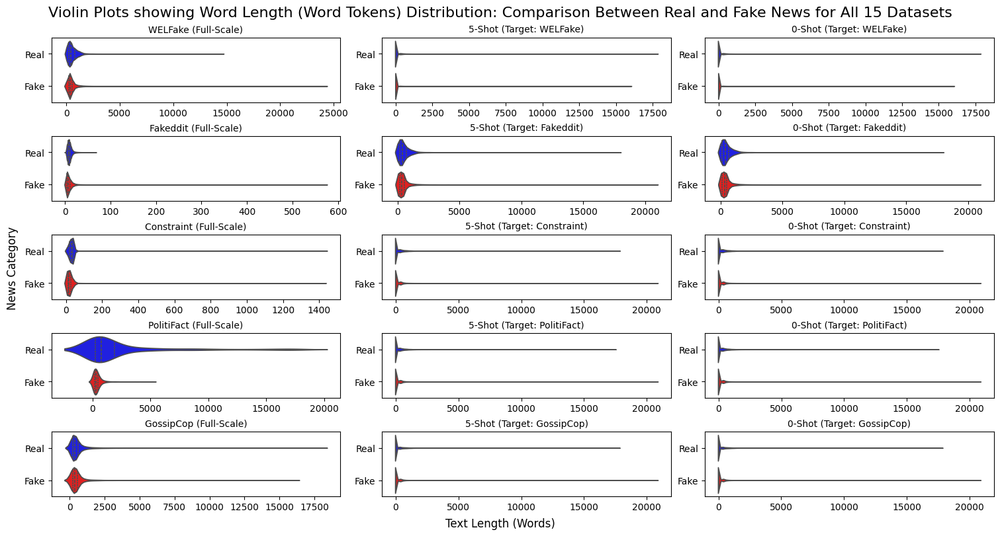

In [40]:
lex_extractor.visualizeTextLengthViolinPlotByNumWordTokens(list_of_df_tuples, list_of_dataset_names)

The above plots for text length (nunber of words) distributions for the datasets show that:
- Fakeddit texts are much shorter than the other datasets' texts, with the longest text being just under 600 tokens in constrast to WELFake or PolitiFact which have a max text length of over 20,000 tokens.
- Long texts like WELFake, Fakeddit etc. texts can be problematic for encoding with transformers, as most encoder-based models (e.g. BERT, DistilBERT, RoBERTa) have a cap of 512 tokens
- The PolitiFact dataset's real news category has the most varied text length distribution
- On the whole, real news texts are much shorter (in terms of number of word tokens) than fake news for WELFake and Fakeddit but much longer than fake news texs for PolitiFact and GossipCop, and about the same length for Constraint.
- This shows that text length in terms of number of tokens is not a feature that generalizes well across different fake-news datasets.
  

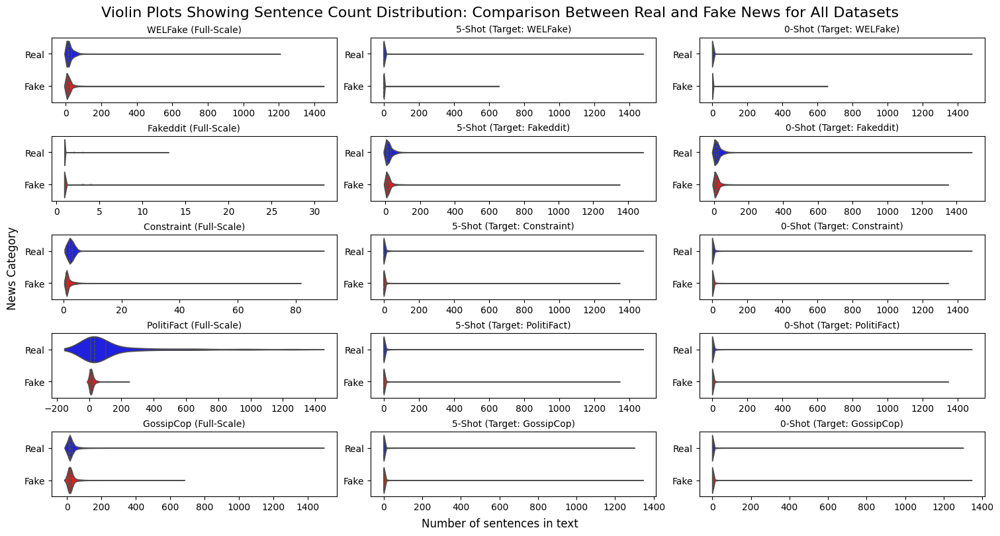

In [41]:
lex_extractor.visualizeTextLengthViolinPlotByNumberOfSentences(list_of_df_tuples, list_of_dataset_names)

Again, the differences between sentence lengths for real and fake news differ considerably between the datasets. The differences in distributions of text structures across datasets highlight the challenges in creating a more generalizable fake news text detection system.

In [42]:
def concatenateDataFrameList(df_list):
    """
        Takes in a list of pd.DataFrame objects with the SAME columns and concatenates them (stacking them vertically),
        adding a new column for the name of the dataset, which was previously stored in the pd.Index object.
    """
    # Concatenate the lexical statistics DataFrames for each dataset
    concat_df = pd.concat(df_list)
    # Reset the index to move the index (the dataset name) to a new column
    concat_df_reset_index = concat_df.reset_index()
    # Rename the new column from "index" to "Dataset Name"
    concat_df_renamed_column = concat_df_reset_index.rename(columns={"index": "Dataset Name"})
    return concat_df_renamed_column                         

In [43]:
# Concatenate all the lexical feature results for all 15 datasets into a 15-row DataFrame
list_of_lexical_feature_avgs_as_dfs = [
    wf_basic_text_avgs_df_real, wf_basic_text_avgs_df_fake,
    fe_basic_text_avgs_df_real, fe_basic_text_avgs_df_fake,
    ct_basic_text_avgs_df_real, ct_basic_text_avgs_df_fake,
    pf_basic_text_avgs_df_real, pf_basic_text_avgs_df_fake,
    gc_basic_text_avgs_df_real, gc_basic_text_avgs_df_fake,
    wf_df_5shot_target_avgs_df_real, wf_df_5shot_target_avgs_df_fake,
    fe_df_5shot_target_avgs_df_real, fe_df_5shot_target_avgs_df_fake,
    ct_df_5shot_target_avgs_df_real, ct_df_5shot_target_avgs_df_fake,
    pf_df_5shot_target_avgs_df_real, pf_df_5shot_target_avgs_df_fake,
    gc_df_5shot_target_avgs_df_real, gc_df_5shot_target_avgs_df_fake,
    wf_df_0shot_target_avgs_df_real, wf_df_0shot_target_avgs_df_fake,
    fe_df_0shot_target_avgs_df_real, fe_df_0shot_target_avgs_df_fake,
    ct_df_0shot_target_avgs_df_real, ct_df_0shot_target_avgs_df_fake,
    pf_df_0shot_target_avgs_df_real, pf_df_0shot_target_avgs_df_fake,
    gc_df_0shot_target_avgs_df_real, gc_df_0shot_target_avgs_df_fake,
]

all_lexfeat_df = concatenateDataFrameList(list_of_lexical_feature_avgs_as_dfs)

# Display datasets' basic text feature scores (means across "text" rows)
all_lexfeat_df.head(30)

,Dataset Name,mean_word_length,mean_text_length_in_word_tokens,mean_sentence_count,mean_sentence_length,mean_sentence_length_std,mean_excl_point_count,mean_ellipsis_count,mean_punc_count,mean_lexical_diversity
0,WELFake Dataset: Real News,4.907383,573.055291,25.381489,29.007236,7.377460,0.157062,0.120086,79.400497,0.524454
1,WELFake Dataset: Fake News,4.695270,502.323905,20.406653,31.597169,15.741107,0.794656,0.065588,72.061662,0.558472
2,Fakeddit Dataset: Real News,4.917569,10.122778,1.069760,10.788236,5.132854,0.023240,0.012895,1.320685,0.978991
3,Fakeddit Dataset: Fake News,4.694024,8.735795,1.138139,9.349170,6.251853,0.103068,0.043937,1.854395,0.973280
4,Constraint Dataset: Real News,5.082971,30.201039,2.330407,20.321794,11.507934,0.018276,0.009497,11.045512,0.857707
5,Constraint Dataset: Fake News,5.148694,21.123092,1.797820,16.906076,8.800886,0.098315,0.022398,6.117146,0.905775
6,PolitiFact Dataset: Real News,4.752685,2273.633238,134.085960,27.217900,22.733129,0.699140,3.679083,470.796562,0.445624
7,PolitiFact Dataset: Fake News,4.710988,399.261830,17.069401,28.596618,12.773338,0.665615,0.097792,56.933754,0.575779
8,GossipCop Dataset: Real News,4.502499,618.010340,29.745837,26.447356,18.000680,1.707215,0.285410,117.124534,0.528145
9,GossipCop Dataset: Fake News,4.504362,566.665174,26.807463,26.442484,11.062929,1.715423,0.260945,106.399502,0.533131


Of course, we can immediately see that the average punctuation/exclamation point/ellipsis counts for datasets with shorter texts (e.g. Fakeddit) will be much lower than for datasets with full-length texts. Therefore, let's create a new column that normalizes punctuation counts by dividing them by the mean text length (number of words per text):

In [44]:
# Divide mean exclamation point count by mean number of word tokens in a text for that dataset
all_lexfeat_df["normalized_mean_excl_point_count"] = all_lexfeat_df["mean_excl_point_count"]/ all_lexfeat_df["mean_text_length_in_word_tokens"]

# Divide mean ellipsis count by mean number of word tokens in a text
all_lexfeat_df["normalized_mean_ellipsis_count"] = all_lexfeat_df["mean_ellipsis_count"]/ all_lexfeat_df["mean_text_length_in_word_tokens"]

# Divide mean punctuationcount by mean number of word tokens in a text
all_lexfeat_df["normalized_mean_punc_count"] = all_lexfeat_df["mean_punc_count"]/ all_lexfeat_df["mean_text_length_in_word_tokens"]

# Drop the non-normalized columns to reduce size of dataframe and thus enhance readability
all_lexfeat_df = all_lexfeat_df.drop(columns=["mean_excl_point_count", "mean_ellipsis_count", "mean_punc_count"])

# Show that it worked
all_lexfeat_df.head(10)

,Dataset Name,mean_word_length,mean_text_length_in_word_tokens,mean_sentence_count,mean_sentence_length,mean_sentence_length_std,mean_lexical_diversity,normalized_mean_excl_point_count,normalized_mean_ellipsis_count,normalized_mean_punc_count
0,WELFake Dataset: Real News,4.907383,573.055291,25.381489,29.007236,7.377460,0.524454,0.000274,0.000210,0.138556
1,WELFake Dataset: Fake News,4.695270,502.323905,20.406653,31.597169,15.741107,0.558472,0.001582,0.000131,0.143457
2,Fakeddit Dataset: Real News,4.917569,10.122778,1.069760,10.788236,5.132854,0.978991,0.002296,0.001274,0.130467
3,Fakeddit Dataset: Fake News,4.694024,8.735795,1.138139,9.349170,6.251853,0.973280,0.011798,0.005030,0.212275
4,Constraint Dataset: Real News,5.082971,30.201039,2.330407,20.321794,11.507934,0.857707,0.000605,0.000314,0.365733
5,Constraint Dataset: Fake News,5.148694,21.123092,1.797820,16.906076,8.800886,0.905775,0.004654,0.001060,0.289595
6,PolitiFact Dataset: Real News,4.752685,2273.633238,134.085960,27.217900,22.733129,0.445624,0.000307,0.001618,0.207068
7,PolitiFact Dataset: Fake News,4.710988,399.261830,17.069401,28.596618,12.773338,0.575779,0.001667,0.000245,0.142598
8,GossipCop Dataset: Real News,4.502499,618.010340,29.745837,26.447356,18.000680,0.528145,0.002762,0.000462,0.189519
9,GossipCop Dataset: Fake News,4.504362,566.665174,26.807463,26.442484,11.062929,0.533131,0.003027,0.000460,0.187764


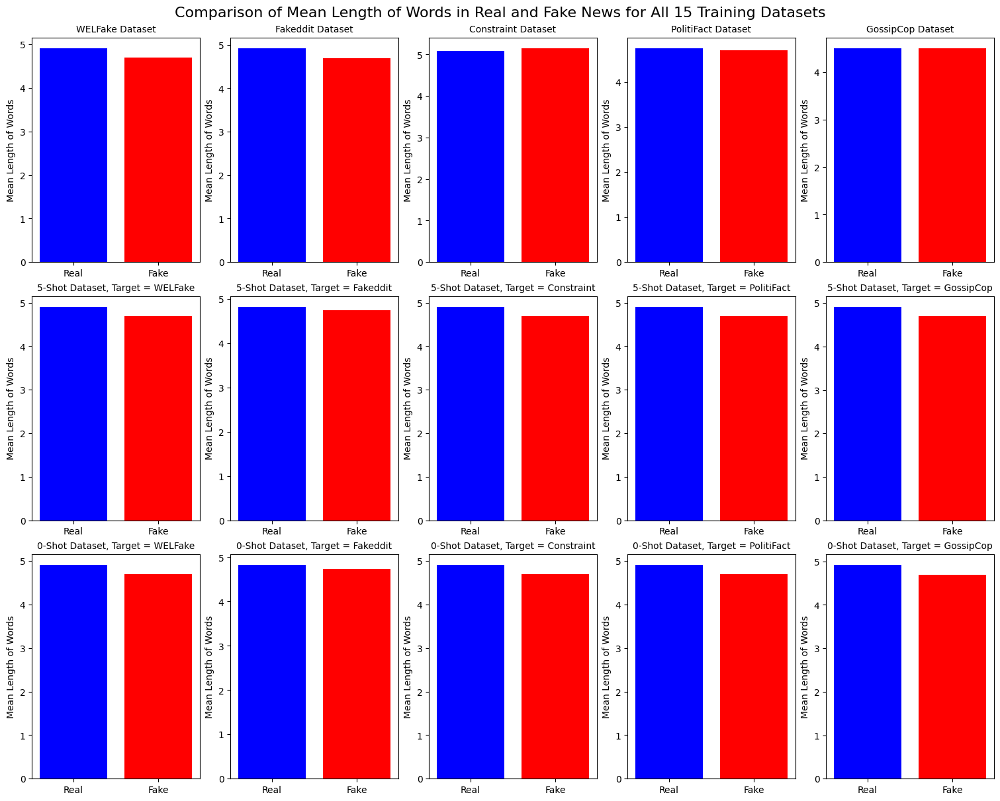

In [45]:
# Use the lexical feature analyzer class to visualize comparison bar charts for real and fake news for all the features in the above dataframe across dataframes
lex_extractor.visualizeAndCompareLexicalFeatureAveragesOnGrid(all_lexfeat_df, "mean_word_length", "Mean Length of Words")

- The above chart demonstrates that for the WELFake and Fakeddit datasets, the average word length is slightly lower for fake news than for real news, indicating that fake news articles may frequently use less complex language to make articles easier to read and more "clickable".
- Nevertheless, for the COVID-19 Constraint dataset, there is no large difference between word length, with the score even being slightly higher for fake news than for real news: one can hypothesize that this might be that authors of COVID-19 fake news tried to use pseudo-scientific language and jargon to sound more credible, as a deception tactics. As such, this highlights the different domain-specific strategies that might be used across fake news topics to make disinformation sound more convincing.
- For the PolitiFact and GossipCop datasets, there is no real difference between the word length in real and fake news. Additional features would therefore be necessary to differentiate between fake news and real news for these two datasets.
- For the concatenated and mixed (five-shot and zero-shot) datasets, real news word length is consistently higher for real news than for fake news, a tendency or pattern which could be used by either ML or DL-based models to improve performance. However, the difference in distributions of this feature across datasets also emphasizes the challenges in building a more universal fake news detection system.

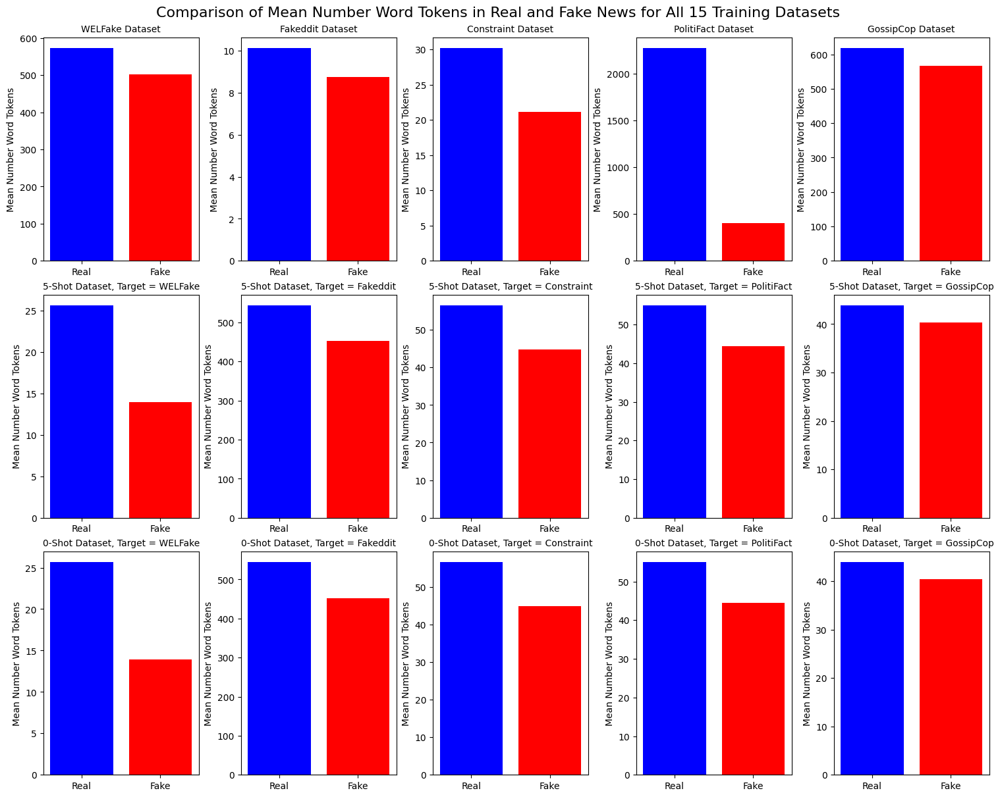

In [46]:
lex_extractor.visualizeAndCompareLexicalFeatureAveragesOnGrid(all_lexfeat_df, "mean_text_length_in_word_tokens", "Mean Number Word Tokens")

The above bar charts demonstrate that for ALL of the datasets, the mean number of word tokens per text is significantly higher for real news than the mean number of word tokens for fake news. As such, this indicates that this feature can be highly useful for building a more generalizable classifier. However, as the datasets also exhibit different average text lengths when compared to one another, it would be necessary to scale down these counts, to ensure that the same pattern is learned despite data being draw from different datasets for the five-shot and zero-shot scenarios. Furthermore, as Passive Aggressive Classifiers are an SVM-based (thus distance-based) algorithm, it is important to scale the features down to be in the same range (e.g. 0-1) to ensure that features with large ranges do not contribute too much to the predictions.

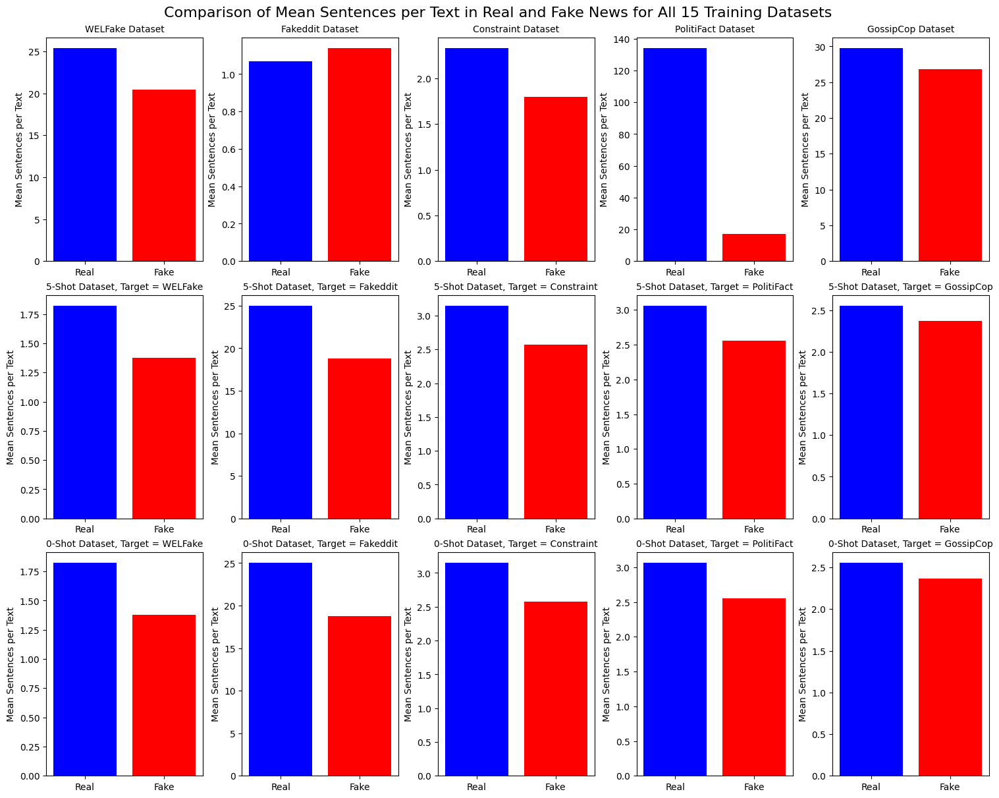

In [47]:
lex_extractor.visualizeAndCompareLexicalFeatureAveragesOnGrid(all_lexfeat_df, "mean_sentence_count", "Mean Sentences per Text")

Similarly to the above visualization for text-length using words per text, for the majority (4/5) of the datasets, real news contains more sentences per sample than fake news, except for the Fakeddit dataset. As mentioned previously, due to this dataset containing short catchy headlines instead of full-news texts, its different structure poses the greatest challenge for generalizability of the ML-based classifier. What is surprising is that for the Fakeddit dataset, texts with more word tokens are more likely to be real news, while texts with more sentences are more likely to be fake news. This suggests, therefore, that real news for this dataset tends to contain longer sentences, thus suggesting that shorter sentences (easier to read) are more indicative of fake news. This feature will be explored in more detail in the following visualization (mean sentence length) and also by extracting features using the *textstat* library later in this data analysis.

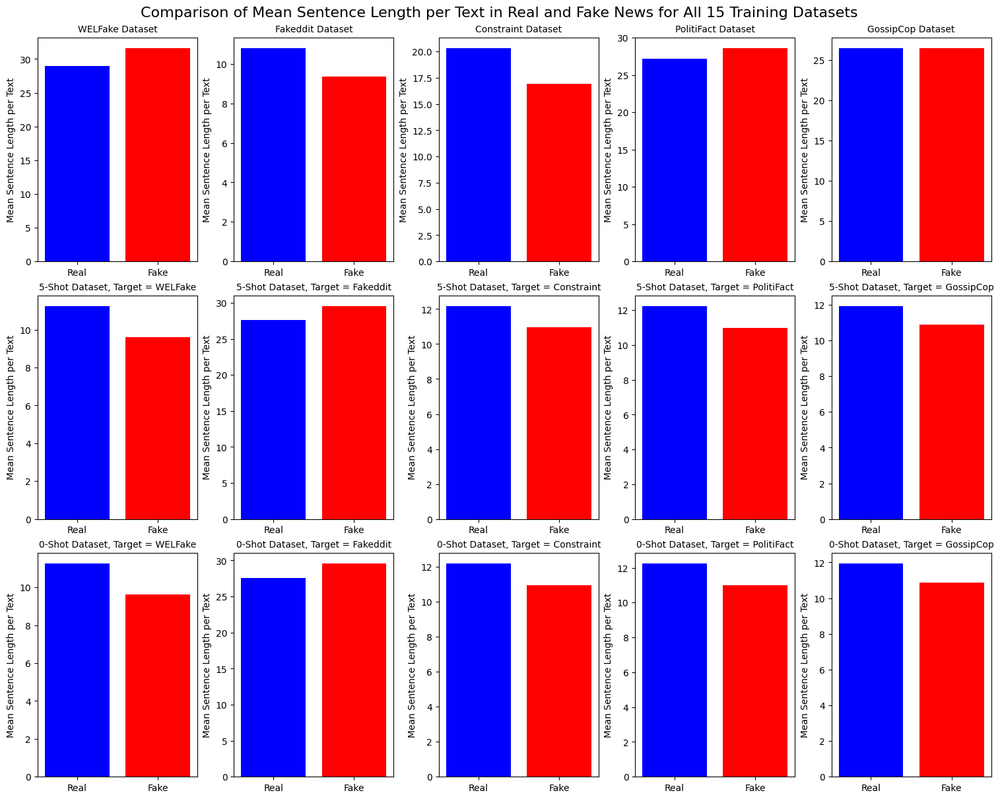

In [48]:
lex_extractor.visualizeAndCompareLexicalFeatureAveragesOnGrid(all_lexfeat_df, "mean_sentence_length", "Mean Sentence Length per Text")

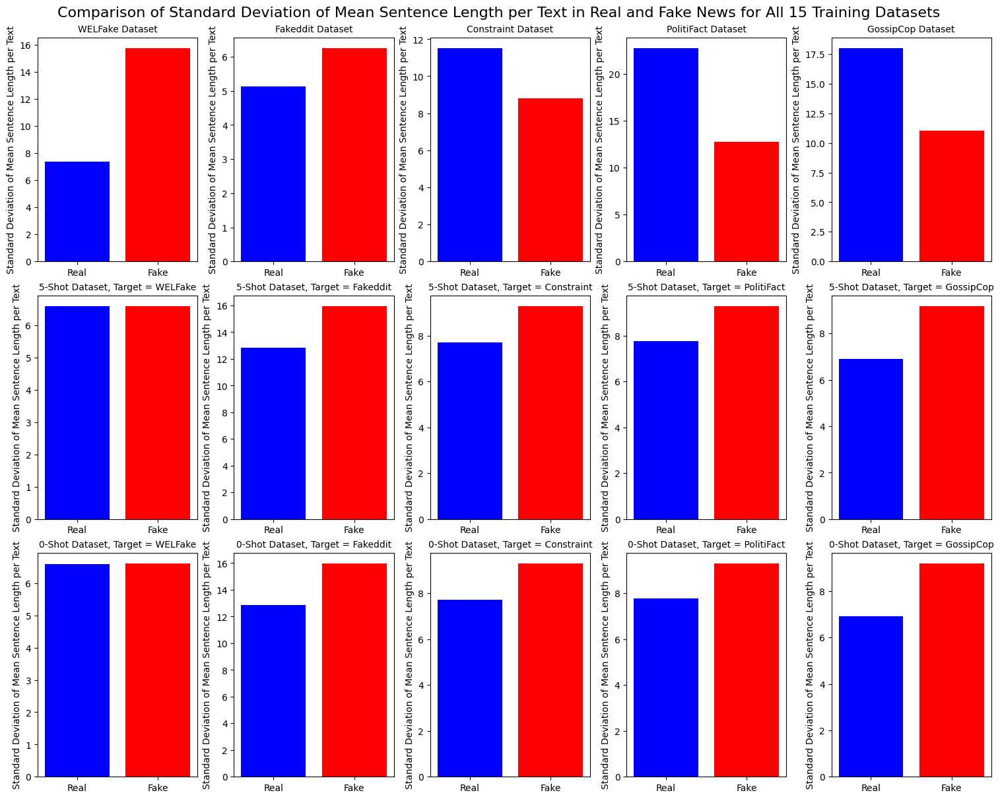

In [49]:
lex_extractor.visualizeAndCompareLexicalFeatureAveragesOnGrid(all_lexfeat_df, "mean_sentence_length_std",
                                                                "Standard Deviation of Mean Sentence Length per Text")

These plots show that the difference in mean sentence length between real and fake news varies considerably between datasets, with longer sentences being a greater indicator for fake news for WELFake, PolitiFact and GossipCop, but a greater indicator for real news for the remaining two datasets.

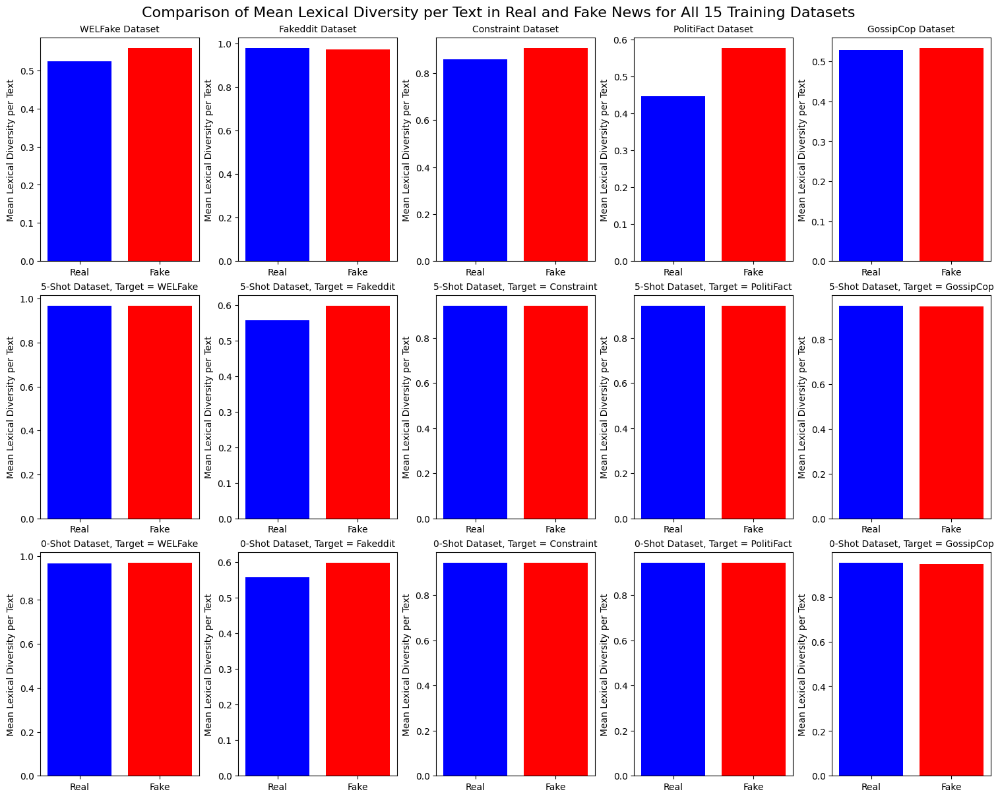

In [50]:
lex_extractor.visualizeAndCompareLexicalFeatureAveragesOnGrid(all_lexfeat_df, "mean_lexical_diversity", "Mean Lexical Diversity per Text")

The lexical diversity bar charts show a surprising feature of these datasets: either fake news tends to have a higher lexical diversity score than real news, or it is roughly equal. This is unexpected because, intuively, one would expect that legitimate news articles contain a richer vocabulary than fake news articles, while expecting that fake news contains simpler, more readable text. This highlights the importance of exploratory data analysis when developing machine-learning based classifiers, as unexpected trends and relationships can be revealed upon closer examination of the data.

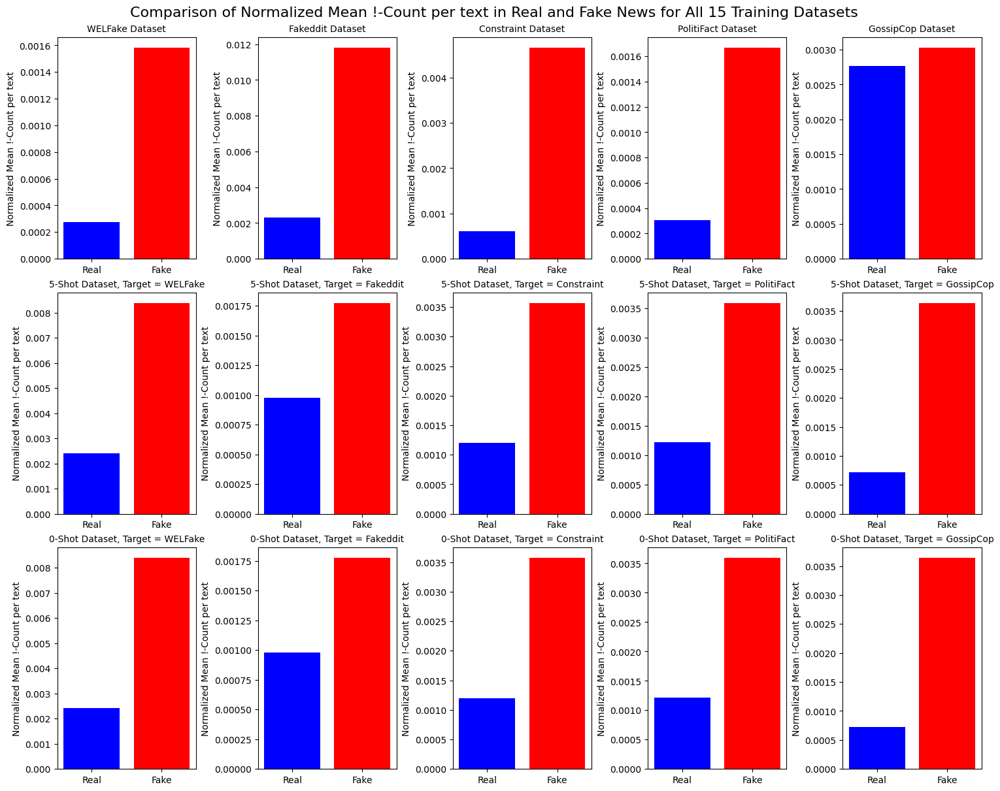

In [51]:
lex_extractor.visualizeAndCompareLexicalFeatureAveragesOnGrid(all_lexfeat_df, "normalized_mean_excl_point_count", "Normalized Mean !-Count per text")

While in the baseline classifier trained for the initial prototype, texts were pre-processed by removing punctuation marks, these charts clearly show that this could have been highly detrimental to classifier performance and generalizability. A consistent feature across **all** datasets is that fake news contains **considerably more exclamation marks per text** than real news, making this a highly useful feature to incorporate in the featuresets.

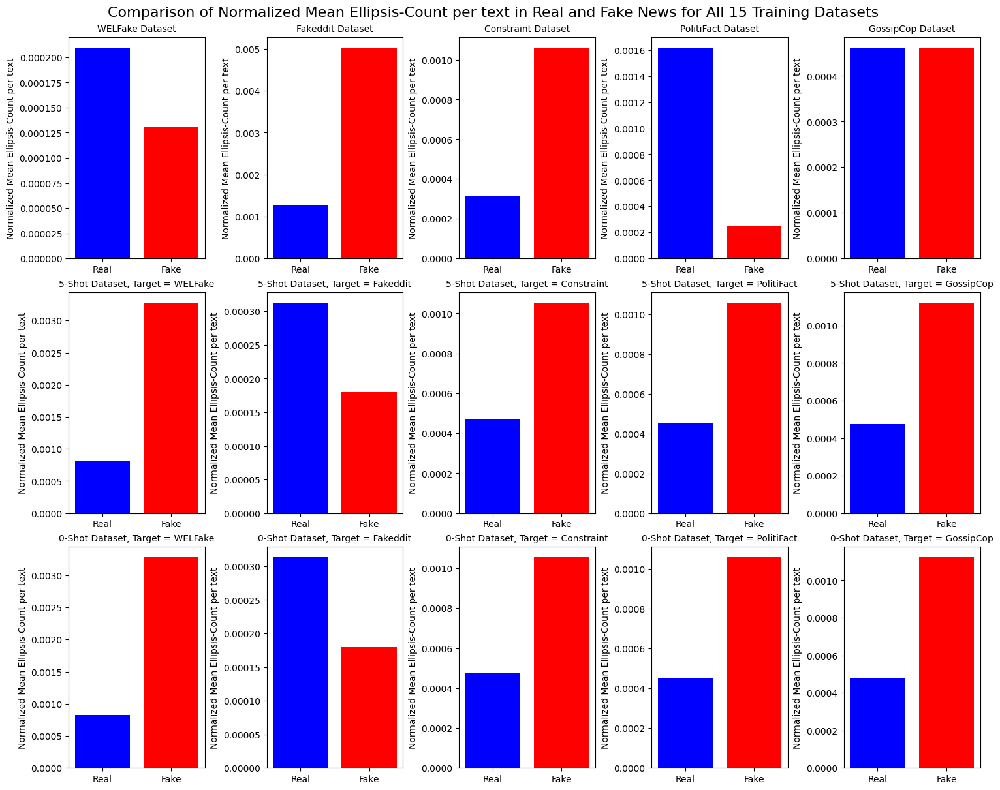

In [52]:
lex_extractor.visualizeAndCompareLexicalFeatureAveragesOnGrid(all_lexfeat_df, "normalized_mean_ellipsis_count", "Normalized Mean Ellipsis-Count per text")

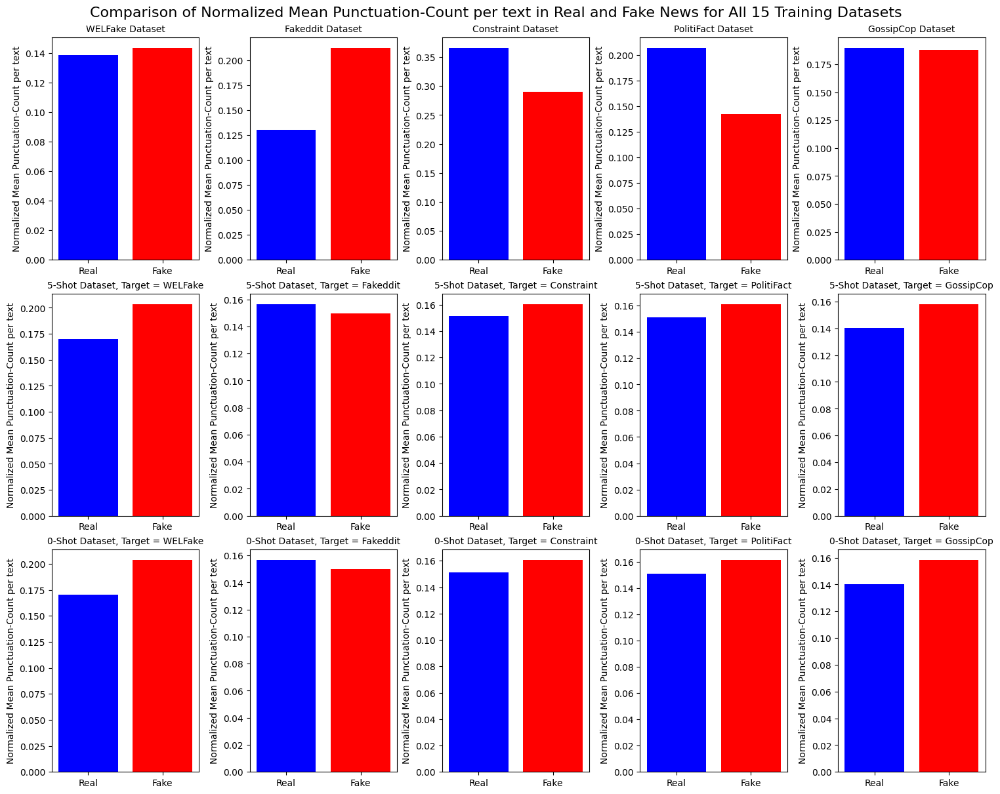

In [53]:
lex_extractor.visualizeAndCompareLexicalFeatureAveragesOnGrid(all_lexfeat_df, "normalized_mean_punc_count", "Normalized Mean Punctuation-Count per text")

In contrast to the consistency with which exclamation points are associated with a greater chance of a text being fake news, ellipsis and general punctuation use varies sharply across the datasets, with it being a strong predictor of fake news in Fakeddit and Constraint datasets, but a strong predictor of real news for WELFake and PolitiFact.

While the types of differences in features for fake and real news vary considerably between datasets, for some features, such as number of exclamation marks or mean number of word tokens, there are consistent tendencies across the datasets in terms of lexical differences between the two news categories. The difference between real and fake news in terms of the mean number of word tokens per text, lexical diversity scores, and number of exclamation marks seem to be consistent and generalizable across the datasets; as a result, these features will be included in the featuresets for inputs into the classifier, in order to increase performance in a way that can generalize across different data, and hopefully extend to patterns in new, unseen data.

### WordClouds of Set Difference (Unique Words to Each News Category) for Fake vs Real News for All Datasets

Generating word cloud pair number 1 out of 15 datasets...
Generating word cloud pair number 2 out of 15 datasets...
Generating word cloud pair number 3 out of 15 datasets...
Generating word cloud pair number 4 out of 15 datasets...
Generating word cloud pair number 5 out of 15 datasets...
Generating word cloud pair number 6 out of 15 datasets...
Generating word cloud pair number 7 out of 15 datasets...
Generating word cloud pair number 8 out of 15 datasets...
Generating word cloud pair number 9 out of 15 datasets...
Generating word cloud pair number 10 out of 15 datasets...
Generating word cloud pair number 11 out of 15 datasets...
Generating word cloud pair number 12 out of 15 datasets...
Generating word cloud pair number 13 out of 15 datasets...
Generating word cloud pair number 14 out of 15 datasets...
Generating word cloud pair number 15 out of 15 datasets...


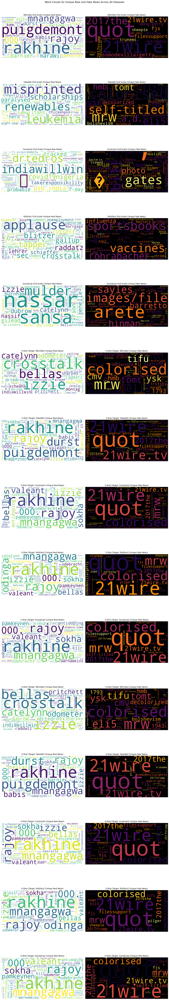

In [54]:
# Create a list of tuples containg (real-news-df, fake-news-df) for each of the original DFs with added features/counts for visualization purposes (box-plots showing word and sentence length distros)
# Different sorting order than previous list; group fullscale, five-shot, and zero-shot training datasets together
list_of_df_tuples_wordcloud = [
    (wf_df_with_basic_text_features_real, wf_df_with_basic_text_features_fake),
    (fe_df_with_basic_text_features_real, fe_df_with_basic_text_features_fake),
    (ct_df_with_basic_text_features_real, ct_df_with_basic_text_features_fake),
    (pf_df_with_basic_text_features_real, pf_df_with_basic_text_features_fake),
    (gc_df_with_basic_text_features_real, gc_df_with_basic_text_features_fake),
    (wf_df_5shot_target_with_basic_text_features_real, wf_df_5shot_target_with_basic_text_features_fake),
    (fe_df_5shot_target_with_basic_text_features_real, fe_df_5shot_target_with_basic_text_features_fake),
    (ct_df_5shot_target_with_basic_text_features_real, ct_df_5shot_target_with_basic_text_features_fake),
    (pf_df_5shot_target_with_basic_text_features_real, pf_df_5shot_target_with_basic_text_features_fake),
    (gc_df_5shot_target_with_basic_text_features_real, gc_df_5shot_target_with_basic_text_features_fake),
    (wf_df_0shot_target_with_basic_text_features_real, wf_df_0shot_target_with_basic_text_features_fake),
    (fe_df_0shot_target_with_basic_text_features_real, fe_df_0shot_target_with_basic_text_features_fake),
    (ct_df_0shot_target_with_basic_text_features_real, ct_df_0shot_target_with_basic_text_features_fake),
    (pf_df_0shot_target_with_basic_text_features_real, pf_df_0shot_target_with_basic_text_features_fake),
    (gc_df_0shot_target_with_basic_text_features_real, gc_df_0shot_target_with_basic_text_features_fake)
]

# Create a list of the dataset names to title visualizations
list_of_dataset_names_wordcloud = [
    "WELFake (Full-Scale)",
    "Fakeddit (Full-Scale)",
    "Constraint (Full-Scale)",
    "PolitiFact (Full-Scale)",
    "GossipCop (Full-Scale)",
    "5-Shot (Target: WELFake)",
    "5-Shot (Target: Fakeddit)",
    "5-Shot (Target: Constraint)",
    "5-Shot (Target: PolitiFact)",
    "5-Shot (Target: GossipCop)",
    "0-Shot (Target: WELFake)",
    "0-Shot (Target: Fakeddit)",    
    "0-Shot (Target: Constraint)",
    "0-Shot (Target: PolitiFact)",
    "0-Shot (Target: GossipCop)",
]

lex_extractor.displayRealVsFakeWordCloudsForDatasets(list_of_df_tuples_wordcloud, list_of_dataset_names_wordcloud)

- I had to create WordClouds which contained disjoint words for each news category, as otherwise the WordClouds were dominated by similar non-informative words for each category (e.g. "said", "did" etc.) and it was difficult to grasp the key differences in the vocabulary used between fake nad real news.
- 21wire comes up as one of the keywords in WELFake and GossipCop fake news; 21st Century Wire is a well-known conspiracy and propaganda dissemination news site.
- Large text containing the words "Bill" and "Gates" is visible in the Constraint (COVID-19) fake news cloud, highlighting the role played by the "microchip" Bill Gates vaccine conspiracy theory during the COVID pandemic
- The Fakeddit fake news WordCloud contains a preponderance of vocabulary terms related to historical figures and dates when compared to the real news cloud; e.g. "anti-wehrmacht", "1692", "1793", "verdun", "anti-soviet", "1805".
- Many large words in the clouds refer to named entities, e.g. names such as Nassar, Sayles, Hinman etc., or geopolitical entities such as Nigeria and India. As a result, exploring suitable ways of handling named entities across the datasets (e.g. removing and extracting them, then comparing results; or encoding into named entity embeddings using pre-trained transformer models such as LUKE) may improve generalizability and performance across domains/datasets.

## 3. Comparing Readability Differences for Real vs Fake News Across the Datasets

In [55]:
# Create a Class to store methods related to text Readability scores using the textstat library
class ReadabilityFeatureAnalyzer:
    
    
    def __init__(self):
        pass
        
        
    def calculateReadabilityStatistics(self, df, dataset_name):
        
        # Create a copy of the original DataFrame for processing statistics
        stats_df = df.copy(deep=True)
        
        # 1. Calculate Flesch-Kincaid reading ease score: higher scores = easier to read
        print("#1. Calculating Flesch-Kincaid Reading Ease Score...")
        stats_df["flesch_reading_ease"] = stats_df["text"].progress_apply(textstat.flesch_reading_ease)
        # 2. Calculate Flesch-Kincaid US grade reading level for texts
        print("#2. Calculating Flesch-Kincaid Grade level...")
        stats_df["flesch_reading_grade"] = stats_df["text"].progress_apply(textstat.flesch_kincaid_grade)
        # 3. Calculates grade level of the text using the Coleman-Liau Formula. (Chars-per-word and words-per-sentence)
        # in contrast to Flesch, which is based on syllable counts
        print("#3. Calculating Coleman-Liau Grade level...")
        stats_df["coleman_liau_grade"] = stats_df["text"].progress_apply(textstat.coleman_liau_index)
        # 4. Calculate Dale-Chall Readability Score: uses a list of 3000 words to determine grade-level readability
        # Ref: https://en.wikipedia.org/wiki/Dale%E2%80%93Chall_readability_formula
        print("#4. Calculating Dale-Chall Grade level...")
        stats_df["dale_chall_grade"] = stats_df["text"].progress_apply(textstat.dale_chall_readability_score)
        # 5. Calculate number of "difficult words" (a 4th grader would not understand) in texts
        # Ref/Read more: https://en.wikipedia.org/wiki/Dale%E2%80%93Chall_readability_formula
        print("#5. Calculating number of difficult words in text...")
        stats_df["difficult_words_score"] = stats_df["text"].progress_apply(textstat.difficult_words)
        # 6. Calculate Readability Consensus based upon all the above tests
        print("#6. Calculating readability consensus based on a group of textstat metrics...")
        stats_df["readability_consensus"] = stats_df["text"].progress_apply(lambda text: textstat.text_standard(text, float_output=True))

        
        # Calculate the average readability scores for the whole DataFrame
        readability_average_scores_dict = {
            f"mean_flesch_reading_ease": np.mean(stats_df["flesch_reading_ease"]),
            f"mean_flesch_reading_grade": np.mean(stats_df["flesch_reading_grade"]),
            f"mean_coleman_liau_grade": np.mean(stats_df["coleman_liau_grade"]), 
            f"mean_dale_chall_grade": np.mean(stats_df["dale_chall_grade"]), 
            f"mean_difficult_words_score": np.mean(stats_df["difficult_words_score"]),
            f"mean_readability_consensus": np.mean(stats_df["readability_consensus"])
        }

        # Convert dictionary to pandas DataFrame; add row index to name dataframe after the inputted DataFrame
        readability_average_scores_df = pd.DataFrame([readability_average_scores_dict], index=[f"{dataset_name}"])

        print(f"Average Readability Feature Stats for {dataset_name}\n: {readability_average_scores_df}\n\n")
        
        return stats_df, readability_average_scores_dict, readability_average_scores_df 

         
    def visualizeAndCompareReadabilityFeatureAveragesOnGrid(self, read_feat_df, feature_column_name, feature_name_for_title):
        # Separate rows real and fake news rows
        # Extract rows with "Real News" in the "Dataset Name"
        real_news_rows = read_feat_df["Dataset Name"].str.contains("Real News")
        # Take all the rows that do NOT contain "Real News" in their name for Fake News using negation operator
        fake_news_rows = ~real_news_rows

        # Extract the feature you're interested in plotting and comparing on the chart grid, e.g. "mean_word_length"
        real_scores = read_feat_df[real_news_rows][feature_column_name].values # Filter for this feature's values for REAL news across all datasets
        fake_scores = read_feat_df[fake_news_rows][feature_column_name].values 
        
        # Extract name of dataset from the Dataset Name col by removing the colon and the "Real News"/"Fake News" string after it
        dataset_names = read_feat_df[real_news_rows]["Dataset Name"].str.split(":").str[0].values

        # Plot configuration: set the overall figsize to 15x15 inches, use constrained_layout to automatically configure spacing
        fig, axes = plt.subplots(3, 5, figsize=(15, 12), constrained_layout=True)
        axes = axes.flatten()
    
        for idx, ax in enumerate(axes):
            # Implement a quick check: important for not breaking the code if too many axes generated for dataset number by mistake
            if idx < len(dataset_names):
                # Create a bar chart for real and fake news and value counts for each specific dataset; real news in blue and fake news in red
                ax.bar(["Real", "Fake"], [real_scores[idx], fake_scores[idx]], color=["blue", "red"])
                # Set the title of each sub-plot to refer to the dataset the scores are for
                ax.set_title(f"{dataset_names[idx]}", fontsize=10)
                ax.set_ylabel(feature_name_for_title) # Set y-label to the feature being compared, inputted as "feature_name_for_title" to this method
            else:
                # Hides unusued subplots if not enough dataset names
                ax.axis("off")

        # Add a main title for the entire grid
        fig.suptitle(f"Comparison of {feature_name_for_title} in Real and Fake News for All 15 Training Datasets", fontsize=16)

        # Show the plot
        plt.show()

In [56]:
read_feat_extractor = ReadabilityFeatureAnalyzer()

In [17]:
# # Processing Readability Features for WELFake Dataset
# print("Processing Readability Features for WELFake Real News Dataset...")
# wf_df_with_readability_features_real, wf_readability_avgs_dict_real, wf_readability_avgs_df_real = read_feat_extractor.calculateReadabilityStatistics(
#     wf_df_real, "WELFake Dataset: Real News"
# )

# print("Processing Readability Features for WELFake Fake News Dataset...")
# wf_df_with_readability_features_fake, wf_readability_avgs_dict_fake, wf_readability_avgs_df_fake = read_feat_extractor.calculateReadabilityStatistics(
#     wf_df_fake, "WELFake Dataset: Fake News"
# )

# # Processing Readability Features for Fakeddit Dataset
# print("Processing Readability Features for Fakeddit Real News Dataset...")
# fe_df_with_readability_features_real, fe_readability_avgs_dict_real, fe_readability_avgs_df_real = read_feat_extractor.calculateReadabilityStatistics(
#     fe_df_real, "Fakeddit Dataset: Real News"
# )

# print("Processing Readability Features for Fakeddit Fake News Dataset...")
# fe_df_with_readability_features_fake, fe_readability_avgs_dict_fake, fe_readability_avgs_df_fake = read_feat_extractor.calculateReadabilityStatistics(
#     fe_df_fake, "Fakeddit Dataset: Fake News"
# )

# # Processing Readability Features for Constraint Dataset
# print("Processing Readability Features for Constraint Real News Dataset...")
# ct_df_with_readability_features_real, ct_readability_avgs_dict_real, ct_readability_avgs_df_real = read_feat_extractor.calculateReadabilityStatistics(
#     ct_df_real, "Constraint Dataset: Real News"
# )

# print("Processing Readability Features for Constraint Fake News Dataset...")
# ct_df_with_readability_features_fake, ct_readability_avgs_dict_fake, ct_readability_avgs_df_fake = read_feat_extractor.calculateReadabilityStatistics(
#     ct_df_fake, "Constraint Dataset: Fake News"
# )

# # Processing Readability Features for PolitiFact Dataset
# print("Processing Readability Features for PolitiFact Real News Dataset...")
# pf_df_with_readability_features_real, pf_readability_avgs_dict_real, pf_readability_avgs_df_real = read_feat_extractor.calculateReadabilityStatistics(
#     pf_df_real, "PolitiFact Dataset: Real News"
# )

# print("Processing Readability Features for PolitiFact Fake News Dataset...")
# pf_df_with_readability_features_fake, pf_readability_avgs_dict_fake, pf_readability_avgs_df_fake = read_feat_extractor.calculateReadabilityStatistics(
#     pf_df_fake, "PolitiFact Dataset: Fake News"
# )

# # Processing Readability Features for GossipCop Dataset
# print("Processing Readability Features for GossipCop Real News Dataset...")
# gc_df_with_readability_features_real, gc_readability_avgs_dict_real, gc_readability_avgs_df_real = read_feat_extractor.calculateReadabilityStatistics(
#     gc_df_real, "GossipCop Dataset: Real News"
# )

# print("Processing Readability Features for GossipCop Fake News Dataset...")
# gc_df_with_readability_features_fake, gc_readability_avgs_dict_fake, gc_readability_avgs_df_fake = read_feat_extractor.calculateReadabilityStatistics(
#     gc_df_fake, "GossipCop Dataset: Fake News"
# )

# # Processing Readability Features for Five-Shot: Target WELFake Dataset
# print("Processing Readability Features for Five-Shot Mixed Dataset: Target WELFake, Real News Dataset...")
# wf_df_5shot_target_with_readability_features_real, wf_df_5shot_target_readability_avgs_dict_real, wf_df_5shot_target_readability_avgs_df_real = read_feat_extractor.calculateReadabilityStatistics(
#                                                                                                     wf_tgt_5shot_df_real, "5-Shot Dataset, Target = WELFake: Real News"
#                                                                                                 )

# print("Processing Readability Features for Five-Shot Mixed Dataset: Target WELFake, Fake News Dataset...")
# wf_df_5shot_target_with_readability_features_fake, wf_df_5shot_target_readability_avgs_dict_fake, wf_df_5shot_target_readability_avgs_df_fake = read_feat_extractor.calculateReadabilityStatistics(
#                                                                                                     wf_tgt_5shot_df_fake, "5-Shot Dataset, Target = WELFake: Fake News"
#                                                                                                 )

# # Processing Readability Features for Five-Shot: Target Fakeddit Dataset
# print("Processing Readability Features for Five-Shot Mixed Dataset: Target Fakeddit, Real News Dataset...")
# fe_df_5shot_target_with_readability_features_real, fe_df_5shot_target_readability_avgs_dict_real, fe_df_5shot_target_readability_avgs_df_real = read_feat_extractor.calculateReadabilityStatistics(
#     fe_tgt_5shot_df_real, "5-Shot Dataset, Target = Fakeddit: Real News"
# )

# print("Processing Readability Features for Five-Shot Mixed Dataset: Target Fakeddit, Fake News Dataset...")
# fe_df_5shot_target_with_readability_features_fake, fe_df_5shot_target_readability_avgs_dict_fake, fe_df_5shot_target_readability_avgs_df_fake = read_feat_extractor.calculateReadabilityStatistics(
#     fe_tgt_5shot_df_fake, "5-Shot Dataset, Target = Fakeddit: Fake News"
# )

# # Processing Readability Features for Five-Shot: Target Constraint Dataset
# print("Processing Readability Features for Five-Shot Mixed Dataset: Target Constraint, Real News Dataset...")
# ct_df_5shot_target_with_readability_features_real, ct_df_5shot_target_readability_avgs_dict_real, ct_df_5shot_target_readability_avgs_df_real = read_feat_extractor.calculateReadabilityStatistics(
#     ct_tgt_5shot_df_real, "5-Shot Dataset, Target = Constraint: Real News"
# )

# print("Processing Readability Features for Five-Shot Mixed Dataset: Target Constraint, Fake News Dataset...")
# ct_df_5shot_target_with_readability_features_fake, ct_df_5shot_target_readability_avgs_dict_fake, ct_df_5shot_target_readability_avgs_df_fake = read_feat_extractor.calculateReadabilityStatistics(
#     ct_tgt_5shot_df_fake, "5-Shot Dataset, Target = Constraint: Fake News"
# )

# # Processing Readability Features for Five-Shot: Target PolitiFact Dataset
# print("Processing Readability Features for Five-Shot Mixed Dataset: Target PolitiFact, Real News Dataset...")
# pf_df_5shot_target_with_readability_features_real, pf_df_5shot_target_readability_avgs_dict_real, pf_df_5shot_target_readability_avgs_df_real = read_feat_extractor.calculateReadabilityStatistics(
#     pf_tgt_5shot_df_real, "5-Shot Dataset, Target = PolitiFact: Real News"
# )

# print("Processing Readability Features for Five-Shot Mixed Dataset: Target PolitiFact, Fake News Dataset...")
# pf_df_5shot_target_with_readability_features_fake, pf_df_5shot_target_readability_avgs_dict_fake, pf_df_5shot_target_readability_avgs_df_fake = read_feat_extractor.calculateReadabilityStatistics(
#     pf_tgt_5shot_df_fake, "5-Shot Dataset, Target = PolitiFact: Fake News"
# )

# # Processing Readability Features for Five-Shot: Target GossipCop Dataset
# print("Processing Readability Features for Five-Shot Mixed Dataset: Target GossipCop, Real News Dataset...")
# gc_df_5shot_target_with_readability_features_real, gc_df_5shot_target_readability_avgs_dict_real, gc_df_5shot_target_readability_avgs_df_real = read_feat_extractor.calculateReadabilityStatistics(
#     gc_tgt_5shot_df_real, "5-Shot Dataset, Target = GossipCop: Real News"
# )

# print("Processing Readability Features for Five-Shot Mixed Dataset: Target GossipCop, Fake News Dataset...")
# gc_df_5shot_target_with_readability_features_fake, gc_df_5shot_target_readability_avgs_dict_fake, gc_df_5shot_target_readability_avgs_df_fake = read_feat_extractor.calculateReadabilityStatistics(
#     gc_tgt_5shot_df_fake, "5-Shot Dataset, Target = GossipCop: Fake News"
# )

# # Processing Readability Features for Zero-Shot: Target WELFake Dataset
# print("Processing Readability Features for Zero-Shot Mixed Dataset: Target WELFake, Real News Dataset...")
# wf_df_0shot_target_with_readability_features_real, wf_df_0shot_target_readability_avgs_dict_real, wf_df_0shot_target_readability_avgs_df_real = read_feat_extractor.calculateReadabilityStatistics(
#     wf_tgt_0shot_df_real, "0-Shot Dataset, Target = WELFake: Real News"
# )

# print("Processing Readability Features for Zero-Shot Mixed Dataset: Target WELFake, Fake News Dataset...")
# wf_df_0shot_target_with_readability_features_fake, wf_df_0shot_target_readability_avgs_dict_fake, wf_df_0shot_target_readability_avgs_df_fake = read_feat_extractor.calculateReadabilityStatistics(
#     wf_tgt_0shot_df_fake, "0-Shot Dataset, Target = WELFake: Fake News"
# )

# # Processing Readability Features for Zero-Shot: Target Fakeddit Dataset
# print("Processing Readability Features for Zero-Shot Mixed Dataset: Target Fakeddit, Real News Dataset...")
# fe_df_0shot_target_with_readability_features_real, fe_df_0shot_target_readability_avgs_dict_real, fe_df_0shot_target_readability_avgs_df_real = read_feat_extractor.calculateReadabilityStatistics(
#     fe_tgt_0shot_df_real, "0-Shot Dataset, Target = Fakeddit: Real News"
# )

# print("Processing Readability Features for Zero-Shot Mixed Dataset: Target Fakeddit, Fake News Dataset...")
# fe_df_0shot_target_with_readability_features_fake, fe_df_0shot_target_readability_avgs_dict_fake, fe_df_0shot_target_readability_avgs_df_fake = read_feat_extractor.calculateReadabilityStatistics(
#     fe_tgt_0shot_df_fake, "0-Shot Dataset, Target = Fakeddit: Fake News"
# )

# # Processing Readability Features for Zero-Shot: Target Constraint Dataset
# print("Processing Readability Features for Zero-Shot Mixed Dataset: Target Constraint, Real News Dataset...")
# ct_df_0shot_target_with_readability_features_real, ct_df_0shot_target_readability_avgs_dict_real, ct_df_0shot_target_readability_avgs_df_real = read_feat_extractor.calculateReadabilityStatistics(
#     ct_tgt_0shot_df_real, "0-Shot Dataset, Target = Constraint: Real News"
# )

# print("Processing Readability Features for Zero-Shot Mixed Dataset: Target Constraint, Fake News Dataset...")
# ct_df_0shot_target_with_readability_features_fake, ct_df_0shot_target_readability_avgs_dict_fake, ct_df_0shot_target_readability_avgs_df_fake = read_feat_extractor.calculateReadabilityStatistics(
#     ct_tgt_0shot_df_fake, "0-Shot Dataset, Target = Constraint: Fake News"
# )

# # Processing Readability Features for Zero-Shot: Target PolitiFact Dataset
# print("Processing Readability Features for Zero-Shot Mixed Dataset: Target PolitiFact, Real News Dataset...")
# pf_df_0shot_target_with_readability_features_real, pf_df_0shot_target_readability_avgs_dict_real, pf_df_0shot_target_readability_avgs_df_real = read_feat_extractor.calculateReadabilityStatistics(
#     pf_tgt_0shot_df_real, "0-Shot Dataset, Target = PolitiFact: Real News"
# )

# print("Processing Readability Features for Zero-Shot Mixed Dataset: Target PolitiFact, Fake News Dataset...")
# pf_df_0shot_target_with_readability_features_fake, pf_df_0shot_target_readability_avgs_dict_fake, pf_df_0shot_target_readability_avgs_df_fake = read_feat_extractor.calculateReadabilityStatistics(
#     pf_tgt_0shot_df_fake, "0-Shot Dataset, Target = PolitiFact: Fake News"
# )

# # Processing Readability Features for Zero-Shot: Target GossipCop Dataset
# print("Processing Readability Features for Zero-Shot Mixed Dataset: Target GossipCop, Real News Dataset...")
# gc_df_0shot_target_with_readability_features_real, gc_df_0shot_target_readability_avgs_dict_real, gc_df_0shot_target_readability_avgs_df_real = read_feat_extractor.calculateReadabilityStatistics(
#     gc_tgt_0shot_df_real, "0-Shot Dataset, Target = GossipCop: Real News"
# )

# print("Processing Readability Features for Zero-Shot Mixed Dataset: Target GossipCop, Fake News Dataset...")
# gc_df_0shot_target_with_readability_features_fake, gc_df_0shot_target_readability_avgs_dict_fake, gc_df_0shot_target_readability_avgs_df_fake = read_feat_extractor.calculateReadabilityStatistics(
#     gc_tgt_0shot_df_fake, "0-Shot Dataset, Target = GossipCop: Fake News"
# )

In [16]:
# Concatenate readability average DataFrames
list_of_readability_feature_avgs_as_dfs = [
    wf_readability_avgs_df_real, wf_readability_avgs_df_fake,
    fe_readability_avgs_df_real, fe_readability_avgs_df_fake,
    ct_readability_avgs_df_real, ct_readability_avgs_df_fake,
    pf_readability_avgs_df_real, pf_readability_avgs_df_fake,
    gc_readability_avgs_df_real, gc_readability_avgs_df_fake,
    wf_df_5shot_target_readability_avgs_df_real, wf_df_5shot_target_readability_avgs_df_fake,
    fe_df_5shot_target_readability_avgs_df_real, fe_df_5shot_target_readability_avgs_df_fake,
    ct_df_5shot_target_readability_avgs_df_real, ct_df_5shot_target_readability_avgs_df_fake,
    pf_df_5shot_target_readability_avgs_df_real, pf_df_5shot_target_readability_avgs_df_fake,
    gc_df_5shot_target_readability_avgs_df_real, gc_df_5shot_target_readability_avgs_df_fake,
    wf_df_0shot_target_readability_avgs_df_real, wf_df_0shot_target_readability_avgs_df_fake,
    fe_df_0shot_target_readability_avgs_df_real, fe_df_0shot_target_readability_avgs_df_fake,
    ct_df_0shot_target_readability_avgs_df_real, ct_df_0shot_target_readability_avgs_df_fake,
    pf_df_0shot_target_readability_avgs_df_real, pf_df_0shot_target_readability_avgs_df_fake,
    gc_df_0shot_target_readability_avgs_df_real, gc_df_0shot_target_readability_avgs_df_fake,
]

all_readability_avgs_df = concatenateDataFrameList(list_of_readability_feature_avgs_as_dfs)

# # Display datasets' readability feature scores (means across "text" rows)
# all_readability_avgs_df.head(30)

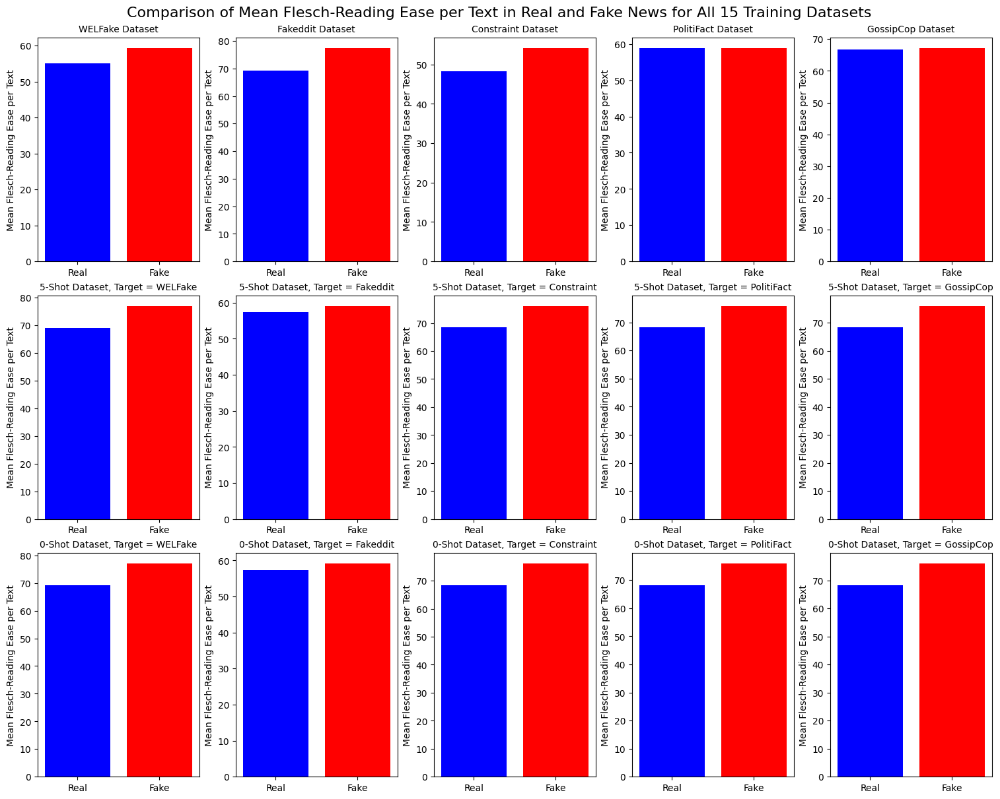


*********************************************************************************************************************************************



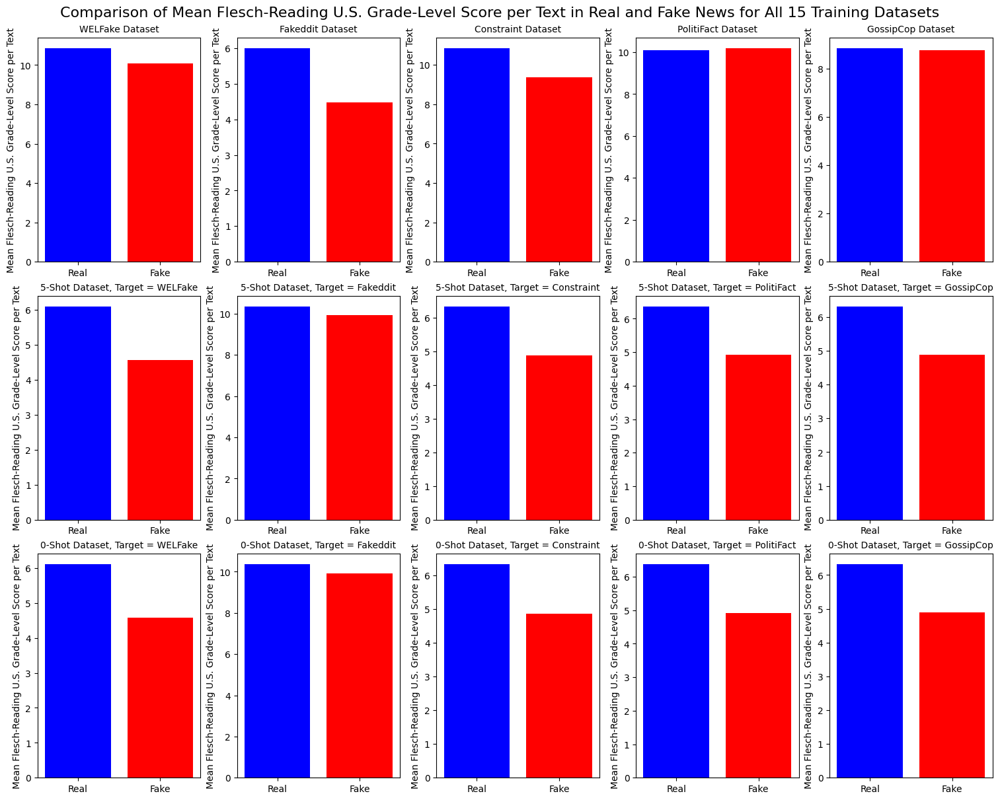

In [59]:
## Visualize mean Flesch-Kincaid Reading Ease scores for texts (the higher, the more readable) between fake + real news for all datasets
read_feat_extractor.visualizeAndCompareReadabilityFeatureAveragesOnGrid(all_readability_avgs_df,
                                                                        "mean_flesch_reading_ease",
                                                                        "Mean Flesch-Reading Ease per Text"
                                                                        )

print("\n*********************************************************************************************************************************************\n")
## Visualize mean Flesch-Kincaid Reading Ease US Grade Levels for texts (the higher, the more readable) between fake + real news for all datasets
read_feat_extractor.visualizeAndCompareReadabilityFeatureAveragesOnGrid(all_readability_avgs_df,
                                                                        "mean_flesch_reading_grade",
                                                                        "Mean Flesch-Reading U.S. Grade-Level Score per Text"
                                                                        )

As expected, the charts show that mean average Flesch-Kincaid readability level for fake news is either greater than or equal to that score for real news across all datasets, meaning that the grade level required to read a real news text is higher than for reading a fake news text (on average). This corroborates the hypothesis that fake news and propaganda is often simpler to comprehend than legitimate news, as the authors aim for maximum dissemination and influence. As a result, including this feature might be a good idea for improving classifier performance across datasets.

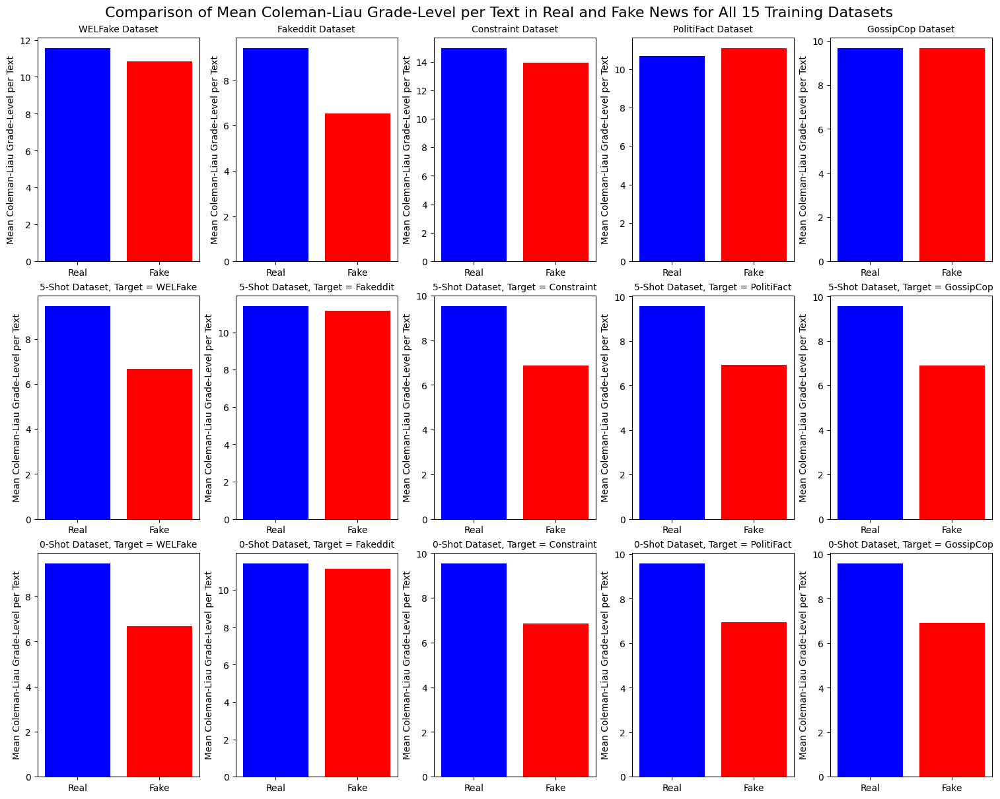

In [60]:
## Visualize mean Coleman-Liau U.S. Grade Level scores for texts (the higher, the more readable) between fake + real news for all datasets
read_feat_extractor.visualizeAndCompareReadabilityFeatureAveragesOnGrid(all_readability_avgs_df,
                                                                        "mean_coleman_liau_grade",
                                                                        # the higher the grade, the more difficult tor read the text is
                                                                        "Mean Coleman-Liau Grade-Level per Text" 
                                                                        )

The Coleman-Liau readability grade score is calculated using characters-per-word and words-per-sentence. However, there is more variation across the datasets than with Flesch-Kincaid grade level, as for PolitiFact, real news texts are *easier* to read on average according to this metric (using shorter words and sentences), while for 3 other core datasets, this tendency is reversed. Perhaps in PolitiFact news articles (long-form political texts), using overly complex words and sentences has been a strategy used by fake news creators to suggest that the article is more credible, and thus to mislead the reader base. As such, this feature is less generalizable across the datasets than the Flesch-Kincaid values.

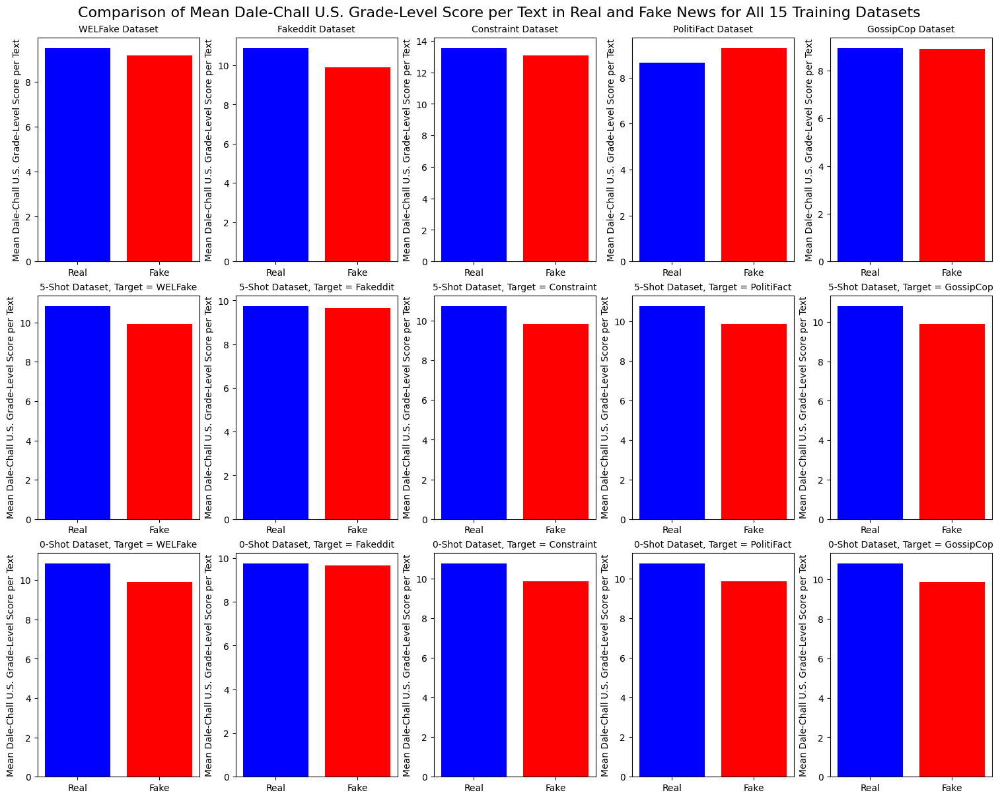

In [61]:
# Dale-Chall Grade Level: based on number of "simple" words in a text out of a list of 3000
read_feat_extractor.visualizeAndCompareReadabilityFeatureAveragesOnGrid(all_readability_avgs_df,
                                                                        "mean_dale_chall_grade",
                                                                        "Mean Dale-Chall U.S. Grade-Level Score per Text"
                                                                        )

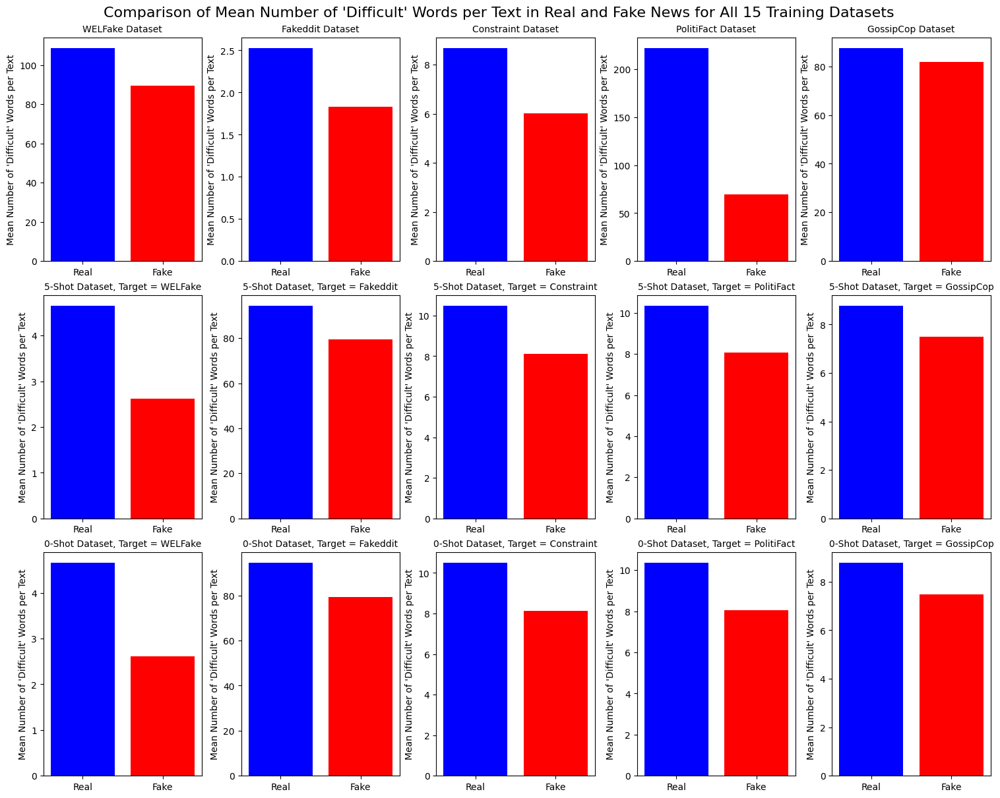

In [62]:
# Dale-Chall Grade Level: based on number of "simple" words in a text out of a list of 3000
# Difficult Words score: number of words NOT in this simple words list
read_feat_extractor.visualizeAndCompareReadabilityFeatureAveragesOnGrid(all_readability_avgs_df,
                                                                        "mean_difficult_words_score",
                                                                        "Mean Number of 'Difficult' Words per Text"
                                                                        )

The two grids clearly demonstrate that the difference in Dale-Chall grade level between fake and real news varies *significantly* between datasets, with no *one* pattern, but that the "difficult words" score clearly shows that real news from **all** datasets contains **more** difficult words than real news. Therefore, the difficult words score is a more consistent predictor of news legitimacy across the datasets.

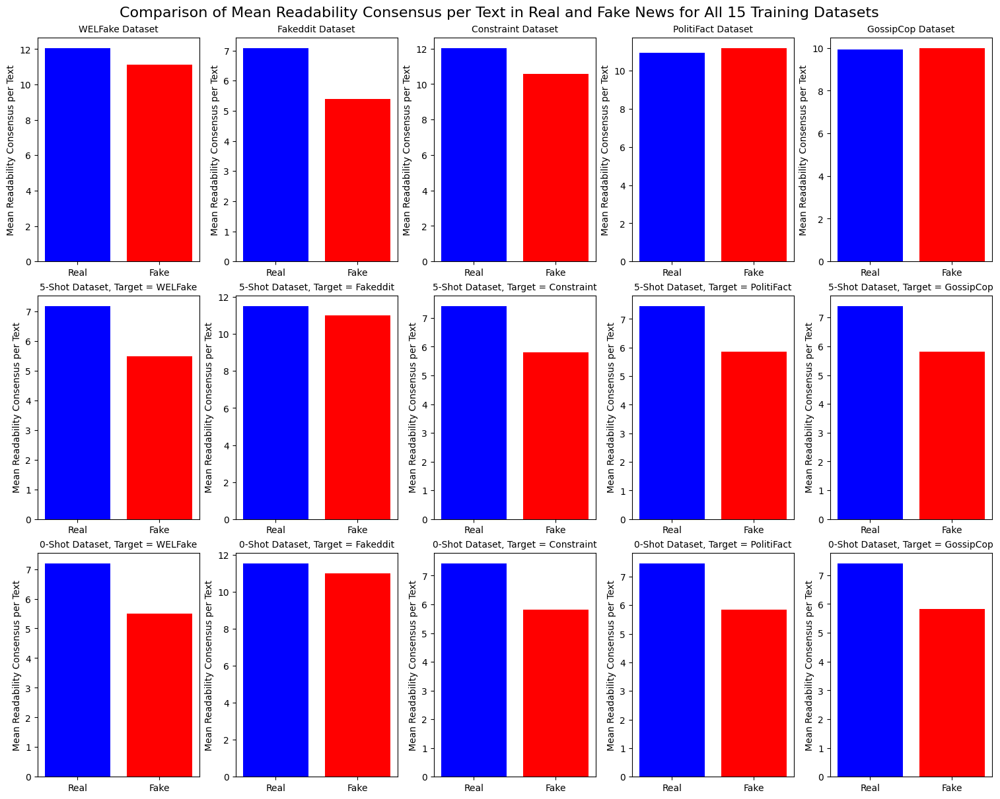

In [63]:
# textstat's Mean Readability Consensus: a statistic based on combining several other readability metrics
# to evaluate the overall readability of a text
read_feat_extractor.visualizeAndCompareReadabilityFeatureAveragesOnGrid(all_readability_avgs_df,
                                                                        "mean_readability_consensus",
                                                                        "Mean Readability Consensus per Text"
                                                                        )

The overall readability score is higher for real news than for fake news for the WELFake, Fakeddit and Constraint datasets, but is higher for fake news for PolitiFact and GossipCop. As a result, Flesch-Kincaid readabiltiy and difficult words score seem to be the optimal readability features to include for better fake news detection system generalizability.

## 4. Comparing Syntactic and Grammatical Differences for Real vs Fake News Across the Datasets

In [18]:
class POSTagFeatureExtractor:
    
    def __init__(self, save_path="../FPData/DatasetsWithNormalizedPOSTagCounts"):
        print("Loading large English SpaCy language model...")
        # Load the model
        self.nlp = spacy.load("en_core_web_lg")
        print("Finished loading large SpaCy model!")
        
        # Get SpaCy (Penn Treebank) POS-tags and print them out
        self.pos_tags = self.nlp.get_pipe("tagger").labels
        print(f"\nLoaded {len(self.pos_tags)} POS-tags!")
        print(f"Available POS tags: {sorted(list(self.pos_tags))}")

        self.save_path = save_path

        
    def extractAndSavePOSTagFeatures(self, df, dataset_name, subdir):
        # Wrap procedure in try-catch block as this is very complex, to diagnose where errors are coming from
        try:
            stats_df = df.copy(deep=True)
            # Calculate lengths once and store
            print("Calculating lengths of each text in word tokens...")
            stats_df["length_of_text"] = stats_df["text"].progress_apply(lambda x: len(word_tokenize(x)))

            # Count POS-tags for each text
            print("Extracting POS tag frequency dictionaries...")
            stats_df["pos_tag_freqs"] = stats_df.progress_apply(
                lambda row: self.getPosFrequencyDistributionAsDict(
                    row["text"],
                    row["length_of_text"]
                ),
                axis=1 # Apply functions to rows not columns
            )

            # Calculate mean frequencies
            mean_pos_freqs = self.calculateMeanPOSTagFreqsForDataFrame(stats_df)

            pos_averages_dict = {
                "dataset_name": dataset_name,
                "mean_pos_freqs": mean_pos_freqs,
            }

            pos_averages_df = pd.DataFrame(pos_averages_dict)

            # Save the new DataFrames with POS counts, as this code takes so long to run, so I want to work with it again and again
            stats_df_filename = f"{dataset_name}_stats_df.csv"
            stats_df_path = os.path.join(self.save_path, subdir, stats_df_filename)
            stats_df.to_csv(stats_df_path, index=True) # Keep Index as it contains POS-tag name and is very informative
            print(f"Saved stats_df to '{stats_df_path}'")

            # Save the POS-averages DF to .csv too
            pos_averages_df_filename = f"{dataset_name}_pos_averages_df.csv"
            pos_averages_df_path = os.path.join(self.save_path, subdir, pos_averages_df_filename)
            pos_averages_df.to_csv(pos_averages_df_path, index=True) # Keep Index with the Dataset Name
            print(f"Saved pos_averages_df to '{pos_averages_df_path}'")

            return stats_df, pos_averages_dict, pos_averages_df

        except Exception as e:
            print(f"Exception raised - 'extractPOSTagFeatures': {str(e)}")
            raise

    def getPosFrequencyDistributionAsDict(self, text, length_of_text):
        """
        This is a helper function to calculate the frequency dictionary of POS-tags for a single text and output a dictionary
        containing them.
        """
        try:
            # Initialize dictionary with all POS-tags set to 0
            pos_freq_dict = {tag: 0 for tag in self.pos_tags}
    
            # Skip empty texts!!!
            if not text or length_of_text == 0:
                return pos_freq_dict
    
            # Process the text
            doc = self.nlp(text)
    
            # Count POS tags
            token_count = 0
            for token in doc:
                pos = token.tag_
                if pos in pos_freq_dict:
                    pos_freq_dict[pos] += 1
                    token_count += 1
    
            # Normalize the counts by dividing by token_count (length of text)
            if token_count > 0:
                for pos in pos_freq_dict:
                    pos_freq_dict[pos] /= token_count
                
            return pos_freq_dict
    
        except Exception as e:
            print(f"Exception raised - 'getPosFrequencyDistributionAsDict for text': {text[:100]}...")
            raise

    def calculateMeanPOSTagFreqsForDataFrame(self, stats_df):
        """
        This is a helper function which calculates the mean POS-tag count over all the
        texts in the inputted DataFrame
        """
        try:
            print("Calculating mean POS-tag frequencies for DataFrame...")

            # Initialize a dictionary to sum the POS frequencies for each row
            total_pos_freqs = {tag: 0 for tag in self.pos_tags}

            # Iterate through each POS tag frequency dictionary in the "pos_tag_freqs" column
            num_rows = len(stats_df)  # Extract the total number of rows in the DataFrame

            # Iterate over the POS-frequency dictionaries
            for pos_freq_dict in stats_df["pos_tag_freqs"]:
                # Iterate over the POS-tags and frequency counts in each dictionary
                for pos, count in pos_freq_dict.items():
                    # Sum the count for that specific POS-tag to the totalling dictionary
                    total_pos_freqs[pos] += count

            # Calculate the mean frequency for each POS tag for the entire DataFrame
            mean_pos_freqs = {pos: (total / num_rows) for pos, total in total_pos_freqs.items()}

            return mean_pos_freqs

        except Exception as e:
            print(f"Exception raised - 'calculateMeanPOSTagFreqsForDataFrame': {str(e)}")
            raise
            

    def plotPosTagDistroRealVsFakeNewsSideBySide(self, df):
        """
        Plots a 15x1 grid of stacked bar charts comparing normalized (by text length) POS-tag distributions
        between real and fake news for each dataset. The bars are sorted in descending order by
        the difference for the frequence between real and fake news, to highlight the most discriminative features.
            Input Parameters:
            - df: A DataFrame where each indexed row represents a dataset + news category (real vs fake)
             and where the columns are POS-tags. Each POS-tag value in the cells is the normalized mean
             count for the POS-tag in the real or fake news dataset.
        """
        
        # Extract the 30 datasets (15 core datasets, each split into real and fake news sections) from the inputted concatenated DF
        datasets = [row for row in df.index]
        
        # Extract the number of datasets using floor division by 2; each dataset is split into real vs fake news sub-datasets
        num_datasets = len(datasets) // 2  # Each dataset has two rows (real, fake)
    
        # Set up the plot grid (will be: 15 rows, 1 column, 1 plot per dataset with both real and fake news 
            # included side-by-side in the same plot for comparison purposes)
        fig, axes = plt.subplots(nrows=num_datasets, ncols=1, figsize=(12, 5 * num_datasets)) # Set height to depend on num of datasets
        if num_datasets == 1:
            axes = [axes]  # If there's only one row, make sure the axes object is iterable, otherwise it won't be in 2D!
    
        # Loop through datasets to create the side-by-side bar charts for real (blue) vs fake (red) news normalized mean POS-freqs
        for idx, dataset in enumerate(datasets[::2]):  # Step over the "datasets" by size 2: gets both real and fake versions of a ds
            real_data = df.loc[dataset] # Extract real dataset from main DF using "dataset" name - will be real news
            fake_data = df.loc[datasets[idx * 2 + 1]] # Extract fake dataset from main DF by accessing the next dataset name w. this formula
    
            # Extract the POS-tags (the index of the extracted fake news and real news Series for this dataset)
            pos_tags = real_data.index
    
            # Get the values out of the real + fake news Series object (indexed by pos_tags)
            real_freq = real_data.values  # Normalized POS-tag freqs for real news for this dataset
            fake_freq = fake_data.values  # Normalized POS-tag freqs for fake news for this dataset

            # Calculate the differences between real and fake frequencies for sorting in desc. order with largest diff. first
            diffs = real_freq - fake_freq

            # Sort the POS-tags by the ABSOLUTE difference in descending order/backwards = -1 step
            # Use NumPy's "argsort" to output the sorted indices for indexing POS-tag values
            sorted_idx = np.argsort(np.abs(diffs))[::-1]

            # Reorder the pos_tag frequencies by the sorted indices in descending order of greatest difference
            sorted_pos_tags = np.array(pos_tags)[sorted_idx]
            sorted_real_freq = real_freq[sorted_idx]
            sorted_fake_freq = fake_freq[sorted_idx]
        
            # Access this dataset's corresponding "ax" object to plot the side-by-side bar plot for the current dataset
            ax = axes[idx]
            # Set bar width
            bar_width = 0.35
            # Create NumPy array of each POS-tag's index from 0 to num_pos_tags
            x = np.arange(len(sorted_pos_tags))
    
            # Plot the bars using the ax.bar func, to set the real vs fake bars for each POS-tag side-by-side
            # 1st arg: x-coords of each bar = the index of the pos-tag minus (real) or plus (fake) half the set bar-width
            # 2nd arg: height of bar = real vs fake news mean frequency of a POS-tag for that dataset
            # 3rd arg: horizontal size/width of each bar
            # 4th arg: label for the legend
            # 5th arg: color-code for differentiating between real (blue) vs fake (red) news
            ax.bar(x - bar_width / 2, sorted_real_freq, bar_width, label="Real News", color='blue')  # Offset real bar to left of x
            ax.bar(x + bar_width / 2, sorted_fake_freq, bar_width, label="Fake News", color='red')  # Offset fake bar to right of x
    
            # Set labels and titles for each chart
            ax.set_xlabel("Penn Treebank SpaCy POS-tag labels")
            ax.set_ylabel("Mean Frequency (Normalized by Text Length)")
            # Split dataset name on _ (separator) and extract first elems only for name, to remove Real/Fake part
            ax.set_title(f"POS-Tag Distribution for Dataset: {' '.join(dataset.split('_')[0:4])}") 
            ax.set_xticks(x)
            # Rotate x-tick/POS-labels by 90-degrees for readability/to prevent overlapping
            ax.set_xticklabels(sorted_pos_tags, rotation=90)
            # Create a legend to be able to differentiate between real vs fake news
            ax.legend()
    
            # Add grid for improved comparison and readability
            ax.grid(True)

        # Increase space between rows by 50% of the subplots' height
        plt.subplots_adjust(hspace=0.5)  
        # Finally, show the grid!
        plt.show()


In [19]:
pos_tag_feat_analyzer =  POSTagFeatureExtractor()

Loading large English SpaCy language model...
Finished loading large SpaCy model!

Loaded 50 POS-tags!
Available POS tags: ['$', "''", ',', '-LRB-', '-RRB-', '.', ':', 'ADD', 'AFX', 'CC', 'CD', 'DT', 'EX', 'FW', 'HYPH', 'IN', 'JJ', 'JJR', 'JJS', 'LS', 'MD', 'NFP', 'NN', 'NNP', 'NNPS', 'NNS', 'PDT', 'POS', 'PRP', 'PRP$', 'RB', 'RBR', 'RBS', 'RP', 'SYM', 'TO', 'UH', 'VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ', 'WDT', 'WP', 'WP$', 'WRB', 'XX', '_SP', '``']


In [18]:
# # Test this works on one dataset!

# print("Processing POS Features for WELFake Real News Dataset...")
# wf_df_with_pos_features_real, wf_pos_avgs_dict_real, wf_pos_avgs_df_real = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     wf_df_real, "WELFake_Dataset_Real_News", "WELFake"
# )

# print("Processing Readability Features for WELFake Fake News Dataset...")
# wf_df_with_pos_features_fake, wf_pos_avgs_dict_real, wf_pos_avgs_df_fake = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     wf_df_fake, "WELFake_Dataset_Fake_News", "WELFake"
# )

In [67]:
# View resulting DataFrames with POS-tag scores (normalized by text-length) to check it worked
wf_df_with_pos_features_real.head()

,Unnamed: 0.1,id,title,text,label,Unnamed: 0,length_of_text,pos_tag_freqs
3,3.0,64772,"Trump win, Democratic setbacks cloud Pelosi's ...",WASHINGTON (Reuters) - Nancy Pelosi may face a...,0,NaN,513,"{'$': 0.0, '''': 0.007662835249042145, ',': 0...."
4,4.0,67872,Investigators ask White House for details on F...,WASHINGTON (Reuters) - The special counsel inv...,0,NaN,337,"{'$': 0.0, '''': 0.006006006006006006, ',': 0...."
5,5.0,68842,EU affirms support for Lebanon stability,BEIRUT (Reuters) - The European Union on Wedne...,0,NaN,74,"{'$': 0.0, '''': 0.0, ',': 0.01282051282051282..."
6,6.0,34654,"‘Game of Thrones’ Season 6, Episode 7: Never T...",“Never too late to come back. ” So sayeth the ...,0,NaN,2024,"{'$': 0.0, '''': 0.006944444444444444, ',': 0...."
7,7.0,66410,Trump '100 percent' committed to take on tax r...,WASHINGTON (Reuters) - President Donald Trump ...,0,NaN,115,"{'$': 0.0, '''': 0.017391304347826087, ',': 0...."


In [68]:
# View resulting POS-tag averages for DataFrame
wf_pos_avgs_df_real.head()

,dataset_name,mean_pos_freqs
$,WELFake_Dataset_Real_News,0.000969
'',WELFake_Dataset_Real_News,0.008226
",",WELFake_Dataset_Real_News,0.043780
-LRB-,WELFake_Dataset_Real_News,0.004340
-RRB-,WELFake_Dataset_Real_News,0.004508


In [19]:
# # Proceed with all the next datasets

# # Time how long this takes
# start_time = time.time()

# # Processing POS Features for Fakeddit Dataset
# print("Processing POS Features for Fakeddit Real News Dataset...")
# fe_df_with_pos_features_real, fe_pos_avgs_dict_real, fe_pos_avgs_df_real = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     fe_df_real, "Fakeddit_Real_News", "Fakeddit"
# )

# print("Processing POS Features for Fakeddit Fake News Dataset...")
# fe_df_with_pos_features_fake, fe_pos_avgs_dict_fake, fe_pos_avgs_df_fake = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     fe_df_fake, "Fakeddit_Fake_News", "Fakeddit"
# )

# # Processing POS Features for Constraint Dataset
# print("Processing POS Features for Constraint Real News Dataset...")
# ct_df_with_pos_features_real, ct_pos_avgs_dict_real, ct_pos_avgs_df_real = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     ct_df_real, "Constraint_Real_News", "Constraint"
# )
# print("Processing POS Features for Constraint Fake News Dataset...")
# ct_df_with_pos_features_fake, ct_pos_avgs_dict_fake, ct_pos_avgs_df_fake = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     ct_df_fake, "Constraint_Fake_News", "Constraint"
# )

# # Processing POS Features for PolitiFact Dataset
# print("Processing POS Features for PolitiFact Real News Dataset...")
# pf_df_with_pos_features_real, pf_pos_avgs_dict_real, pf_pos_avgs_df_real = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     pf_df_real, "PolitiFact_Real_News", "PolitiFact"
# )

# print("Processing POS Features for PolitiFact Fake News Dataset...")
# pf_df_with_pos_features_fake, pf_pos_avgs_dict_fake, pf_pos_avgs_df_fake = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     pf_df_fake, "PolitiFact_Fake_News", "PolitiFact"
# )

# # Processing POS Features for GossipCop Dataset
# print("Processing POS Features for GossipCop Real News Dataset...")
# gc_df_with_pos_features_real, gc_pos_avgs_dict_real, gc_pos_avgs_df_real = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     gc_df_real, "GossipCop_Real_News", "GossipCop"
# )

# print("Processing POS Features for GossipCop Fake News Dataset...")
# gc_df_with_pos_features_fake, gc_pos_avgs_dict_fake, gc_pos_avgs_df_fake = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     gc_df_fake, "GossipCop_Fake_News", "GossipCop"
# )

# # Processing POS Features for Five-Shot Datasets
# print("Processing POS Features for Five-Shot Mixed Dataset: Target WELFake, Real News...")
# wf_df_5shot_target_with_pos_features_real, wf_df_5shot_target_pos_avgs_dict_real, wf_df_5shot_target_pos_avgs_df_real = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     wf_tgt_5shot_df_real, "FiveShot_WELFake_Real_News", "FiveShot_WELFakeTarget"
# )

# print("Processing POS Features for Five-Shot Mixed Dataset: Target WELFake, Fake News...")
# wf_df_5shot_target_with_pos_features_fake, wf_df_5shot_target_pos_avgs_dict_fake, wf_df_5shot_target_pos_avgs_df_fake = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     wf_tgt_5shot_df_fake, "FiveShot_WELFake_Fake_News", "FiveShot_WELFakeTarget"
# )

# # Processing POS Features for Five-Shot: Target Fakeddit Dataset
# print("Processing POS Features for Five-Shot Mixed Dataset: Target Fakeddit, Real News...")
# fe_df_5shot_target_with_pos_features_real, fe_df_5shot_target_pos_avgs_dict_real, fe_df_5shot_target_pos_avgs_df_real = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     fe_tgt_5shot_df_real, "FiveShot_Fakeddit_Real_News", "FiveShot_FakedditTarget"
# )

# print("Processing POS Features for Five-Shot Mixed Dataset: Target Fakeddit, Fake News...")
# fe_df_5shot_target_with_pos_features_fake, fe_df_5shot_target_pos_avgs_dict_fake, fe_df_5shot_target_pos_avgs_df_fake = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     fe_tgt_5shot_df_fake, "FiveShot_Fakeddit_Fake_News", "FiveShot_FakedditTarget"
# )

# # Processing POS Features for Five-Shot: Target Constraint Dataset
# print("Processing POS Features for Five-Shot Mixed Dataset: Target Constraint, Real News...")
# ct_df_5shot_target_with_pos_features_real, ct_df_5shot_target_pos_avgs_dict_real, ct_df_5shot_target_pos_avgs_df_real = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     ct_tgt_5shot_df_real, "FiveShot_Constraint_Real_News", "FiveShot_ConstraintTarget"
# )

# print("Processing POS Features for Five-Shot Mixed Dataset: Target Constraint, Fake News...")
# ct_df_5shot_target_with_pos_features_fake, ct_df_5shot_target_pos_avgs_dict_fake, ct_df_5shot_target_pos_avgs_df_fake = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     ct_tgt_5shot_df_fake, "FiveShot_Constraint_Fake_News", "FiveShot_ConstraintTarget"
# )

# # Processing POS Features for Five-Shot: Target PolitiFact Dataset
# print("Processing POS Features for Five-Shot Mixed Dataset: Target PolitiFact, Real News...")
# pf_df_5shot_target_with_pos_features_real, pf_df_5shot_target_pos_avgs_dict_real, pf_df_5shot_target_pos_avgs_df_real = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     pf_tgt_5shot_df_real, "FiveShot_PolitiFact_Real_News", "FiveShot_PolitiFactTarget"
# )

# print("Processing POS Features for Five-Shot Mixed Dataset: Target PolitiFact, Fake News...")
# pf_df_5shot_target_with_pos_features_fake, pf_df_5shot_target_pos_avgs_dict_fake, pf_df_5shot_target_pos_avgs_df_fake = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     pf_tgt_5shot_df_fake, "FiveShot_PolitiFact_Fake_News", "FiveShot_PolitiFactTarget"
# )

# # Processing POS Features for Five-Shot: Target GossipCop Dataset
# print("Processing POS Features for Five-Shot Mixed Dataset: Target GossipCop, Real News...")
# gc_df_5shot_target_with_pos_features_real, gc_df_5shot_target_pos_avgs_dict_real, gc_df_5shot_target_pos_avgs_df_real = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     gc_tgt_5shot_df_real, "FiveShot_GossipCop_Real_News", "FiveShot_GossipCopTarget"
# )

# print("Processing POS Features for Five-Shot Mixed Dataset: Target GossipCop, Fake News...")
# gc_df_5shot_target_with_pos_features_fake, gc_df_5shot_target_pos_avgs_dict_fake, gc_df_5shot_target_pos_avgs_df_fake = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     gc_tgt_5shot_df_fake, "FiveShot_GossipCop_Fake_News", "FiveShot_GossipCopTarget"
# )

# # Processing POS Features for Zero-Shot Datasets
# print("Processing POS Features for Zero-Shot Mixed Dataset: Target WELFake, Real News...")
# wf_df_0shot_target_with_pos_features_real, wf_df_0shot_target_pos_avgs_dict_real, wf_df_0shot_target_pos_avgs_df_real = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     wf_tgt_0shot_df_real, "ZeroShot_WELFake_Real_News", "ZeroShot_WELFakeTarget"
# )

# print("Processing POS Features for Zero-Shot Mixed Dataset: Target WELFake, Fake News...")
# wf_df_0shot_target_with_pos_features_fake, wf_df_0shot_target_pos_avgs_dict_fake, wf_df_0shot_target_pos_avgs_df_fake = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     wf_tgt_0shot_df_fake, "ZeroShot_WELFake_Fake_News", "ZeroShot_WELFakeTarget"
# )

# # Processing POS Features for Zero-Shot: Target Fakeddit Dataset
# print("Processing POS Features for Zero-Shot Mixed Dataset: Target Fakeddit, Real News...")
# fe_df_0shot_target_with_pos_features_real, fe_df_0shot_target_pos_avgs_dict_real, fe_df_0shot_target_pos_avgs_df_real = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     fe_tgt_0shot_df_real, "ZeroShot_Fakeddit_Real_News", "ZeroShot_FakedditTarget"
# )

# print("Processing POS Features for Zero-Shot Mixed Dataset: Target Fakeddit, Fake News...")
# fe_df_0shot_target_with_pos_features_fake, fe_df_0shot_target_pos_avgs_dict_fake, fe_df_0shot_target_pos_avgs_df_fake = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     fe_tgt_0shot_df_fake, "ZeroShot_Fakeddit_Fake_News", "ZeroShot_FakedditTarget"
# )

# # Processing POS Features for Zero-Shot: Target Constraint Dataset
# print("Processing POS Features for Zero-Shot Mixed Dataset: Target Constraint, Real News...")
# ct_df_0shot_target_with_pos_features_real, ct_df_0shot_target_pos_avgs_dict_real, ct_df_0shot_target_pos_avgs_df_real = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     ct_tgt_0shot_df_real, "ZeroShot_Constraint_Real_News", "ZeroShot_ConstraintTarget"
# )

# print("Processing POS Features for Zero-Shot Mixed Dataset: Target Constraint, Fake News...")
# ct_df_0shot_target_with_pos_features_fake, ct_df_0shot_target_pos_avgs_dict_fake, ct_df_0shot_target_pos_avgs_df_fake = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     ct_tgt_0shot_df_fake, "ZeroShot_Constraint_Fake_News", "ZeroShot_ConstraintTarget"
# )

# # Processing POS Features for Zero-Shot: Target PolitiFact Dataset
# print("Processing POS Features for Zero-Shot Mixed Dataset: Target PolitiFact, Real News...")
# pf_df_0shot_target_with_pos_features_real, pf_df_0shot_target_pos_avgs_dict_real, pf_df_0shot_target_pos_avgs_df_real = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     pf_tgt_0shot_df_real, "ZeroShot_PolitiFact_Real_News", "ZeroShot_PolitiFactTarget"
# )

# print("Processing POS Features for Zero-Shot Mixed Dataset: Target PolitiFact, Fake News...")
# pf_df_0shot_target_with_pos_features_fake, pf_df_0shot_target_pos_avgs_dict_fake, pf_df_0shot_target_pos_avgs_df_fake = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     pf_tgt_0shot_df_fake, "ZeroShot_PolitiFact_Fake_News", "ZeroShot_PolitiFactTarget"
# )

# # Processing POS Features for Zero-Shot: Target GossipCop Dataset
# print("Processing POS Features for Zero-Shot Mixed Dataset: Target GossipCop, Real News...")
# gc_df_0shot_target_with_pos_features_real, gc_df_0shot_target_pos_avgs_dict_real, gc_df_0shot_target_pos_avgs_df_real = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     gc_tgt_0shot_df_real, "ZeroShot_GossipCop_Real_News", "ZeroShot_GossipCopTarget"
# )

# print("Processing POS Features for Zero-Shot Mixed Dataset: Target GossipCop, Fake News...")
# gc_df_0shot_target_with_pos_features_fake, gc_df_0shot_target_pos_avgs_dict_fake, gc_df_0shot_target_pos_avgs_df_fake = pos_tag_feat_analyzer.extractAndSavePOSTagFeatures(
#     gc_tgt_0shot_df_fake, "ZeroShot_GossipCop_Fake_News", "ZeroShot_GossipCopTarget"
# )

# # End the timer after all the processing is done
# end_time = time.time()

# # Print time elapsed
# elapsed_time = end_time - start_time
# elapsed_minutes = elapsed_time / 60
# hours = int(elapsed_time // 3600)
# minutes = int((elapsed_time % 3600) // 60)
# seconds = int(elapsed_time % 60)

# # Print the results
# print(f"Total time taken to extract POS-tag frequencies for all datasets:")
# print(f"- Seconds: {elapsed_time:.2f} seconds")
# print(f"- Minutes: {elapsed_minutes:.2f} minutes")
# print(f"- Hours:Minutes:Seconds: {hours}:{minutes:02}:{seconds:02}")

It took 7 hours, 28 minutes and 43 seconds to process all the POS-tag data!

In [70]:
# Display format of POS-averages DF
wf_pos_avgs_df_real.head(5)

,dataset_name,mean_pos_freqs
$,WELFake_Dataset_Real_News,0.000969
'',WELFake_Dataset_Real_News,0.008226
",",WELFake_Dataset_Real_News,0.043780
-LRB-,WELFake_Dataset_Real_News,0.004340
-RRB-,WELFake_Dataset_Real_News,0.004508


The POS-tags are an Index object but it is more useful to have them as columns, so we need to do some pandas manipulation next for all these DataFrames.

In [71]:
# Create a function to convert Index into columns for POS-average DataFrames

def changePOSIndexToColumns(df):
    # Create a new DataFrame with a new column called pos_tag (that we move the previous index to)
    df_reset_index = df.reset_index().rename(columns={"index": "pos_tag"}) # Rename index to pos_tag

    # Pivot the DataFrame to change the new pos_tag column to column names on top & change dataset_name to be the new Index
    # Change columns to be the pos_tag
    # Change column values to be the "mean_pos_freqs" column (normalized - by text length - mean POS-tag counts for this dataset)
    df_pivoted = df_reset_index.pivot(index="dataset_name", columns="pos_tag", values="mean_pos_freqs") 

    # Remove the "pos_tag" label from the columns' name to make it cleaner and remove the ugly, unnecessary multi-index
    df_pivoted.columns.name = None

    # Return the better-looking and easier to handle DataFrame
    return df_pivoted

# Function for pivoting and saving the datasets
def pivotAndSavePOSTagDataFrame(real_df, fake_df, save_path, dataset_name):
    # Pivot the real and fake DataFrames
    real_pivoted = changePOSIndexToColumns(real_df)
    fake_pivoted = changePOSIndexToColumns(fake_df)
    # Save the pivoted DataFrames while keeping the dataset_name as the Index with index=True
    real_pivoted.to_csv(os.path.join(save_path, f"{dataset_name}_Real_News_pos_averages_pivoted_df.csv"), index=True)
    fake_pivoted.to_csv(os.path.join(save_path, f"{dataset_name}_Fake_News_pos_averages_pivoted_df.csv"), index=True)
    # Return the pivoted DataFrames
    return real_pivoted, fake_pivoted

In [72]:
# Paths for saving datasets
save_path = "../FPData/DatasetsWithNormalizedPOSTagCounts"

# Full-scale subdirectories
full_scale_paths = {
    "WELFake": os.path.join(save_path, "WELFake"),
    "Fakeddit": os.path.join(save_path, "Fakeddit"),
    "Constraint": os.path.join(save_path, "Constraint"),
    "PolitiFact": os.path.join(save_path, "PolitiFact"),
    "GossipCop": os.path.join(save_path, "GossipCop"),
}

# Five-shot subdirectories
five_shot_paths = {
    "WELFake": os.path.join(save_path, "FiveShot_WELFakeTarget"),
    "Fakeddit": os.path.join(save_path, "FiveShot_FakedditTarget"),
    "Constraint": os.path.join(save_path, "FiveShot_ConstraintTarget"),
    "PolitiFact": os.path.join(save_path, "FiveShot_PolitiFactTarget"),
    "GossipCop": os.path.join(save_path, "FiveShot_GossipCopTarget"),
}

# Zero-shot subdirectories
zero_shot_paths = {
    "WELFake": os.path.join(save_path, "ZeroShot_WELFakeTarget"),
    "Fakeddit": os.path.join(save_path, "ZeroShot_FakedditTarget"),
    "Constraint": os.path.join(save_path, "ZeroShot_ConstraintTarget"),
    "PolitiFact": os.path.join(save_path, "ZeroShot_PolitiFactTarget"),
    "GossipCop": os.path.join(save_path, "ZeroShot_GossipCopTarget"),
}

# Create 3 dictionaries to store all the pivoted DataFrames, for easy access with meaningful keys
full_scale_pivoted = {}
five_shot_pivoted = {}
zero_shot_pivoted = {}

# Apply the pivotAndSavePOSTagDataFrame function for full-scale datasets
full_scale_dataframes = {
    "WELFake": (wf_pos_avgs_df_real, wf_pos_avgs_df_fake),
    "Fakeddit": (fe_pos_avgs_df_real, fe_pos_avgs_df_fake),
    "Constraint": (ct_pos_avgs_df_real, ct_pos_avgs_df_fake),
    "PolitiFact": (pf_pos_avgs_df_real, pf_pos_avgs_df_fake),
    "GossipCop": (gc_pos_avgs_df_real, gc_pos_avgs_df_fake),
}

# Iterate over the full-scale DataFrames, pivot and save them, and store the pivoted dataframes in the full_scale_pivoted dict
for dataset, (real_df, fake_df) in full_scale_dataframes.items():
    real_pivoted, fake_pivoted = pivotAndSavePOSTagDataFrame(real_df, fake_df, full_scale_paths[dataset], dataset)
    full_scale_pivoted[dataset] = {"real": real_pivoted, "fake": fake_pivoted}

# Apply the pivotAndSavePOSTagDataFrame function for five-shot datasets
five_shot_dataframes = {
    "WELFake": (wf_df_5shot_target_pos_avgs_df_real, wf_df_5shot_target_pos_avgs_df_fake),
    "Fakeddit": (fe_df_5shot_target_pos_avgs_df_real, fe_df_5shot_target_pos_avgs_df_fake),
    "Constraint": (ct_df_5shot_target_pos_avgs_df_real, ct_df_5shot_target_pos_avgs_df_fake),
    "PolitiFact": (pf_df_5shot_target_pos_avgs_df_real, pf_df_5shot_target_pos_avgs_df_fake),
    "GossipCop": (gc_df_5shot_target_pos_avgs_df_real, gc_df_5shot_target_pos_avgs_df_fake),
}

# Iterate over the five-scale DataFrames, pivot and save them, and store the pivoted dataframes in the full_scale_pivoted dict
for dataset, (real_df, fake_df) in five_shot_dataframes.items():
    real_pivoted, fake_pivoted = pivotAndSavePOSTagDataFrame(real_df, fake_df, five_shot_paths[dataset], f"FiveShot_{dataset}")
    five_shot_pivoted[dataset] = {"real": real_pivoted, "fake": fake_pivoted}

# Apply the pivotAndSavePOSTagDataFrame for zero-shot datasets
zero_shot_dataframes = {
    "WELFake": (wf_df_0shot_target_pos_avgs_df_real, wf_df_0shot_target_pos_avgs_df_fake),
    "Fakeddit": (fe_df_0shot_target_pos_avgs_df_real, fe_df_0shot_target_pos_avgs_df_fake),
    "Constraint": (ct_df_0shot_target_pos_avgs_df_real, ct_df_0shot_target_pos_avgs_df_fake),
    "PolitiFact": (pf_df_0shot_target_pos_avgs_df_real, pf_df_0shot_target_pos_avgs_df_fake),
    "GossipCop": (gc_df_0shot_target_pos_avgs_df_real, gc_df_0shot_target_pos_avgs_df_fake),
}

# Iterate over the zero-scale DataFrames, pivot and save them, and store the pivoted dataframes in the full_scale_pivoted dict
for dataset, (real_df, fake_df) in zero_shot_dataframes.items():
    real_pivoted, fake_pivoted = pivotAndSavePOSTagDataFrame(real_df, fake_df, zero_shot_paths[dataset], f"ZeroShot_{dataset}")
    zero_shot_pivoted[dataset] = {"real": real_pivoted, "fake": fake_pivoted}

# Combine all the pivoted datasets into a single dictionary
all_pivoted_pos_tag_dataframes = {
    "full_scale_pos_tag_dfs": full_scale_pivoted,
    "five_shot_pos_tag_dfs": five_shot_pivoted,
    "zero_shot_pos_tag_dfs": zero_shot_pivoted,
}

# Create a list of all the pivoted DataFrames for concatenation into one DataFrame with index = dataset name & if it's real | fake news
all_pivoted_pos_tag_dfs = [
    full_scale_pivoted["WELFake"]["real"], full_scale_pivoted["WELFake"]["fake"],
    full_scale_pivoted["Fakeddit"]["real"], full_scale_pivoted["Fakeddit"]["fake"],
    full_scale_pivoted["Constraint"]["real"], full_scale_pivoted["Constraint"]["fake"],
    full_scale_pivoted["PolitiFact"]["real"], full_scale_pivoted["PolitiFact"]["fake"],
    full_scale_pivoted["GossipCop"]["real"], full_scale_pivoted["GossipCop"]["fake"],
    five_shot_pivoted["WELFake"]["real"], five_shot_pivoted["WELFake"]["fake"],
    five_shot_pivoted["Fakeddit"]["real"], five_shot_pivoted["Fakeddit"]["fake"],
    five_shot_pivoted["Constraint"]["real"], five_shot_pivoted["Constraint"]["fake"],
    five_shot_pivoted["PolitiFact"]["real"], five_shot_pivoted["PolitiFact"]["fake"],
    five_shot_pivoted["GossipCop"]["real"], five_shot_pivoted["GossipCop"]["fake"],
    zero_shot_pivoted["WELFake"]["real"], zero_shot_pivoted["WELFake"]["fake"],
    zero_shot_pivoted["Fakeddit"]["real"], zero_shot_pivoted["Fakeddit"]["fake"],
    zero_shot_pivoted["Constraint"]["real"], zero_shot_pivoted["Constraint"]["fake"],
    zero_shot_pivoted["PolitiFact"]["real"], zero_shot_pivoted["PolitiFact"]["fake"],
    zero_shot_pivoted["GossipCop"]["real"], zero_shot_pivoted["GossipCop"]["fake"]
]

In [73]:
# Concatenate all the pivoted POS-tag average DataFrames into one DataFrame, with the dataset name and whether it's
# fake or real news as the index
all_pivoted_pos_tag_dfs_concat = pd.concat(all_pivoted_pos_tag_dfs)
all_pivoted_pos_tag_dfs_concat.head(8)

,$,'',",",-LRB-,-RRB-,.,:,ADD,AFX,CC,...,VBN,VBP,VBZ,WDT,WP,WP$,WRB,XX,_SP,``
dataset_name,,,,,,,,,,,,,,,,,,,,,
WELFake_Dataset_Real_News,0.000969,0.008226,0.043780,0.004340,0.004508,0.035821,0.005938,0.000012,4.687631e-07,0.023671,...,0.023391,0.012362,0.018430,0.005040,0.004011,0.000190,0.002714,0.000557,0.015201,0.008296
WELFake_Dataset_Fake_News,0.001140,0.003206,0.039606,0.003297,0.003469,0.039946,0.006942,0.000228,1.052395e-06,0.024983,...,0.021024,0.018698,0.028559,0.004635,0.005584,0.000115,0.004515,0.000749,0.019309,0.003269
Fakeddit_Real_News,0.001617,0.006519,0.011458,0.002050,0.002597,0.021683,0.030171,0.000070,3.737562e-06,0.008279,...,0.018743,0.011003,0.033653,0.002381,0.002201,0.000037,0.002372,0.001033,0.000113,0.006493
Fakeddit_Fake_News,0.000388,0.005039,0.018146,0.011812,0.013983,0.044536,0.009476,0.000157,7.425584e-06,0.009277,...,0.016617,0.016090,0.029192,0.001282,0.004283,0.000025,0.004336,0.003296,0.000128,0.004931
Constraint_Real_News,0.024444,0.002372,0.000164,0.002890,0.003168,0.043647,0.020427,0.002234,0.000000e+00,0.020608,...,0.031217,0.025053,0.027036,0.003442,0.002825,0.000040,0.002274,0.000693,0.000118,0.003309
Constraint_Fake_News,0.016585,0.006926,0.009104,0.002217,0.002448,0.061250,0.005493,0.001094,0.000000e+00,0.015129,...,0.026517,0.015845,0.037616,0.002444,0.003619,0.000037,0.002123,0.000617,0.004199,0.007402
PolitiFact_Real_News,0.001857,0.004703,0.043030,0.003605,0.003874,0.042235,0.012483,0.000275,1.322439e-07,0.029938,...,0.019103,0.023212,0.023429,0.004716,0.004734,0.000067,0.003808,0.000311,0.022352,0.005662
PolitiFact_Fake_News,0.001099,0.009362,0.037001,0.001635,0.002002,0.040210,0.006322,0.000737,0.000000e+00,0.024703,...,0.026109,0.017375,0.025738,0.004464,0.004856,0.000152,0.003435,0.000585,0.021934,0.009617


In [74]:
save_path = "../FPData/DatasetsWithNormalizedPOSTagCounts"

In [75]:
# Save the concatenated DF
all_pivoted_pos_avg_dfs_file_path = all_pivoted_pos_tag_dfs_concat.to_csv(
    os.path.join(save_path, "all_pos_avg_dfs.csv"),
    index=True
)

In [76]:
# Load it back in after restarting Jupyter Notebook
all_pivoted_pos_tag_dfs_concat = pd.read_csv(
    os.path.join(save_path, "all_pos_avg_dfs.csv"),
    index_col="dataset_name" # VERY important to get dataset_name as the Index for all the next plotting and analysis functions!
)
all_pivoted_pos_tag_dfs_concat.head()

,$,'',",",-LRB-,-RRB-,.,:,ADD,AFX,CC,...,VBN,VBP,VBZ,WDT,WP,WP$,WRB,XX,_SP,``
dataset_name,,,,,,,,,,,,,,,,,,,,,
WELFake_Dataset_Real_News,0.000969,0.008226,0.043780,0.004340,0.004508,0.035821,0.005938,0.000012,4.687631e-07,0.023671,...,0.023391,0.012362,0.018430,0.005040,0.004011,0.000190,0.002714,0.000557,0.015201,0.008296
WELFake_Dataset_Fake_News,0.001140,0.003206,0.039606,0.003297,0.003469,0.039946,0.006942,0.000228,1.052395e-06,0.024983,...,0.021024,0.018698,0.028559,0.004635,0.005584,0.000115,0.004515,0.000749,0.019309,0.003269
Fakeddit_Real_News,0.001617,0.006519,0.011458,0.002050,0.002597,0.021683,0.030171,0.000070,3.737562e-06,0.008279,...,0.018743,0.011003,0.033653,0.002381,0.002201,0.000037,0.002372,0.001033,0.000113,0.006493
Fakeddit_Fake_News,0.000388,0.005039,0.018146,0.011812,0.013983,0.044536,0.009476,0.000157,7.425584e-06,0.009277,...,0.016617,0.016090,0.029192,0.001282,0.004283,0.000025,0.004336,0.003296,0.000128,0.004931
Constraint_Real_News,0.024444,0.002372,0.000164,0.002890,0.003168,0.043647,0.020427,0.002234,0.000000e+00,0.020608,...,0.031217,0.025053,0.027036,0.003442,0.002825,0.000040,0.002274,0.000693,0.000118,0.003309


In [77]:
all_pivoted_pos_tag_dfs_concat.head(30)

,$,'',",",-LRB-,-RRB-,.,:,ADD,AFX,CC,...,VBN,VBP,VBZ,WDT,WP,WP$,WRB,XX,_SP,``
dataset_name,,,,,,,,,,,,,,,,,,,,,
WELFake_Dataset_Real_News,0.000969,0.008226,0.043780,0.004340,0.004508,0.035821,0.005938,0.000012,4.687631e-07,0.023671,...,0.023391,0.012362,0.018430,0.005040,0.004011,0.000190,0.002714,0.000557,0.015201,0.008296
WELFake_Dataset_Fake_News,0.001140,0.003206,0.039606,0.003297,0.003469,0.039946,0.006942,0.000228,1.052395e-06,0.024983,...,0.021024,0.018698,0.028559,0.004635,0.005584,0.000115,0.004515,0.000749,0.019309,0.003269
Fakeddit_Real_News,0.001617,0.006519,0.011458,0.002050,0.002597,0.021683,0.030171,0.000070,3.737562e-06,0.008279,...,0.018743,0.011003,0.033653,0.002381,0.002201,0.000037,0.002372,0.001033,0.000113,0.006493
Fakeddit_Fake_News,0.000388,0.005039,0.018146,0.011812,0.013983,0.044536,0.009476,0.000157,7.425584e-06,0.009277,...,0.016617,0.016090,0.029192,0.001282,0.004283,0.000025,0.004336,0.003296,0.000128,0.004931
Constraint_Real_News,0.024444,0.002372,0.000164,0.002890,0.003168,0.043647,0.020427,0.002234,0.000000e+00,0.020608,...,0.031217,0.025053,0.027036,0.003442,0.002825,0.000040,0.002274,0.000693,0.000118,0.003309
Constraint_Fake_News,0.016585,0.006926,0.009104,0.002217,0.002448,0.061250,0.005493,0.001094,0.000000e+00,0.015129,...,0.026517,0.015845,0.037616,0.002444,0.003619,0.000037,0.002123,0.000617,0.004199,0.007402
PolitiFact_Real_News,0.001857,0.004703,0.043030,0.003605,0.003874,0.042235,0.012483,0.000275,1.322439e-07,0.029938,...,0.019103,0.023212,0.023429,0.004716,0.004734,0.000067,0.003808,0.000311,0.022352,0.005662
PolitiFact_Fake_News,0.001099,0.009362,0.037001,0.001635,0.002002,0.040210,0.006322,0.000737,0.000000e+00,0.024703,...,0.026109,0.017375,0.025738,0.004464,0.004856,0.000152,0.003435,0.000585,0.021934,0.009617
GossipCop_Real_News,0.001085,0.012380,0.044476,0.003042,0.003781,0.041010,0.008732,0.000162,1.540271e-06,0.026775,...,0.017940,0.015932,0.023441,0.003592,0.004309,0.000096,0.004155,0.001049,0.023595,0.013998


In [78]:
all_pivoted_pos_tag_dfs_concat.columns

Index(['$', '''', ',', '-LRB-', '-RRB-', '.', ':', 'ADD', 'AFX', 'CC', 'CD',
       'DT', 'EX', 'FW', 'HYPH', 'IN', 'JJ', 'JJR', 'JJS', 'LS', 'MD', 'NFP',
       'NN', 'NNP', 'NNPS', 'NNS', 'PDT', 'POS', 'PRP', 'PRP$', 'RB', 'RBR',
       'RBS', 'RP', 'SYM', 'TO', 'UH', 'VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ',
       'WDT', 'WP', 'WP$', 'WRB', 'XX', '_SP', '``'],
      dtype='object')

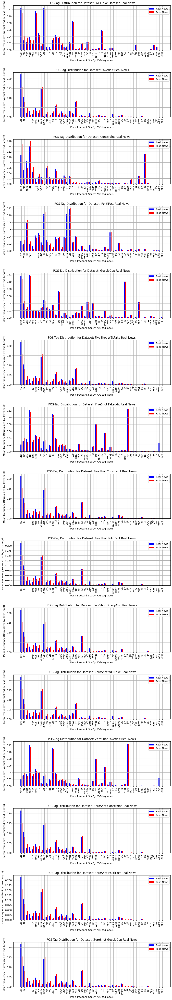

In [79]:
# Plot POS-distribution for each dataset real (blue) vs fake (red) news
pos_tag_feat_analyzer.plotPosTagDistroRealVsFakeNewsSideBySide(all_pivoted_pos_tag_dfs_concat)

#### Analysis of Different POS-Count Distributions between Real and Fake News

##### WELFake Dataset

- The POS-tags which differ the most between real and fake news are NNP (Proper Nouns), RB (adverbs), PRP (personal pronouns), VBD (past tense verbs), VBZ (verbs in third-person singular present tense), IN (prepositions), NNS (plural nouns), VBP (non-third person singular present verbs), `-punctuation symbol, "-punctuation symbol, NN (nouns) and VB (verbs).
- Overall, real news contains considerably more prepositions, deterrminers, and nouns of all types than fake news. In constrast, fake news contains significantly more verbs of all types.
- This suggests that real news may contain more factual information about locations, events and people (i.e. nouns and prepositions), while fake news might seem more engaging due to the overwhelming use of verbs ("action words") to appear more engaging and thrilling to readers.
- As a result, constructing a noun-to-verb ratio feature could be useful for improving classifier performance for this dataset; let's see if this tendency generalizes across the other datasets below.
- Fake news contains substantially more adverbs and personal pronouns than real news, signalling an increased amount of modified, emotional language (adverbs) and subjective content (personal pronouns).
- Before running this analysis, I assumed that there would be a difference in modal verb counts between fake and real news, as modal verbs express hypothetical situations and what could happen *if* something were the case, thus designating speculation. However, for this dataset the counts seem to be equal.


#### Fakeddit Dataset
- As in WELFake, there are more singular, plural and mass nouns (NN and NNS) in real news versus fake news in this dataset. However, there are more proper nouns (names of entities, NNP) in fake news than real news for this particular dataset. Also similarly, fake news contains a greater average number of verbs (VB) than real news here.
- Fake news also contains more adverbs than real news, as with WELFake. For this dataset, fake news also contains a larger number of adjectives on average. Increased usage of noun and verb modifiers may be associated with more emotional and expressive language used in fake news.
- The pattern of fake news containing more personal pronouns is consistent across both Fakeddit and WELFake datasets.

#### Constraint Dataset
- POS-tag distribution patterns for this dataset contrast significantly with the two above datasets, showing opposite tendencies, signalling a problem for generalizability.
- For instance, news in the  COVID-19 dataset contains *more* nouns than real news on average. This could be because legitimate scientific texts rely more on specific, numerical evidence, rather than citing general entities such as people or organizations.
- Additionally, adverb and adjectival usage is increased for real news as opposed to fake news.
- The most significant difference in POS-tag distribution for this dataset, cardinal numbers (CD) are used more often in real than in fake news, perhaps due to the usage of more quantitative evidence to support statements and claims in this domain of scientific news (COVID-19). A lack of number-based evidence can therefore be a key indicator of fake news for this domain.
- Fake news contained a lot more proper nouns than real news on average.


#### PolitiFact Dataset
- Similarly to the Constraint dataset, real news contained more cardinal numbers (CD) than fake news.
- Fake news contained a more past tense verbs (VBD) and past participles (VBN) than real news.
- Nouns associated more with real news, but proper nouns with fake news, perhaps due to the tendency of fake news to target famous politicians and organizations, or to reference them to give an illusion of authority.

#### GossipCop Dataset
- Nouns associated more with real news.
- Verbs and adverbs associated more with fake news as in first 2 datasets listed here.
- Cardinal numbers (CD) also used slightly more in real news.

#### Combined Five-Shot and Zero-Shot Leave-One-Out Datasets
- Adverbs used more in fake news overall.
- Personal pronouns (PRP) also more strongly associated with fake news, perhaps due to more subjective/opinion-based tone associated with them.
- Nouns associated more with real news and verbs with fake news, despite slight variations across datasets.
- Prepositions and subordinating conjunctions (IN) also more common in real news than fake news; subordinating conjunctions point to more complex sentence structure, thus potentially being a crucial indicator of a news text's legitimacy. In constrast, no clear distinctions between fake and real news emerged for coordinating conjunction (CC) usage in these datasets.

#### Summary of Main Insights for Feature Engineering and Selection

1. Due to greater consistent usage of more nouns than verbs in real vs fake news (with the exception of Constraint), creating a noun-to-verb ratio feature might improve classifier performance and generalizability.
2. Parts-of-speech associated more with emotion and subjectivity (personal pronouns, noun and verb modifiers [adverbs and adjectives]) seem to appear more in fake than real news overall. Therefore, including a subjectivity-objectivity ratio feature (these are included in libraries such as *textblob*) could also be helpful.
3. Ratio of past-tense to present-tense verbs can also be helpful for certain datasets where there was a marked difference in these tendencies between fake and real news, namely PolitiFact.
4. Greater number of subordinating conjunctions (IN) seems to be a consistent feature in real news datasets.

In [104]:
# Create a class to extract grammatical features such as noun-verb ratio for the datasets.

class GrammaticalFeatureExtractor:
    
    def __init__(self):
        print("Loading large English SpaCy language model...")
        # Load the model
        self.nlp = spacy.load("en_core_web_lg")
        print("Finished loading large SpaCy model!")
        
        # Get SpaCy (Penn Treebank) POS-tags and print them out
        self.pos_tags = self.nlp.get_pipe("tagger").labels
        print(f"\nLoaded {len(self.pos_tags)} POS-tags!")

        ## USEFUL NAMES FOR TITLES WHEN PLOTTING
        # Defines the five datasets and three evaluation scenarios for plotting the titles of the subplots
        self.dataset_names = ["WELFake", "Fakeddit", "Constraint", "PolitiFact", "GossipCop"]
        self.scenarios = ["Full-Scale", "Target Five-Shot", "Target Zero-Shot"]

    def plotNounToVerbRatio(self, df):
        """
        Creates a 3x5 grid of bar charts showing noun-to-verb ratios for real vs fake news 
        across 5 different datasets and 3 different evaluation scenarios.
        
        Input Parameters:
        df (pd.DataFrame): Input dataframe with average noun and verb POS-tag freqs for real and fake news across different datasets.
        """
        
        
        # List the Penn Treebank SpaCy POS-tags for all noun and verb types
        noun_pos_tags = ["NN", "NNS", "NNP", "NNPS"]
        verb_pos_tags = ["VB", "VBD", "VBG", "VBN", "VBP", "VBZ"]
        
        # Initialize the pyplot figure and axes
        
        fig, axes = plt.subplots(3, 5, figsize=(16, 10)) # 3 rows for each scenario, 5 cols for each dataset
        # Adjusts the space between rows
        plt.subplots_adjust(hspace=0.5, wspace=0.3)
        
        fig.suptitle("Noun-to-Verb Ratio for Real vs Fake News Across All Datasets", fontsize=16)
        
        # Iterate over the scenarios and datasets
        for idx in range(len(df))[::2]: # Iterate over every other row to get new dataset (has been split into real-fake rows)
            real_news_row = df.iloc[idx] # Real news
            fake_news_row = df.iloc[idx + 1]  # Get the next row: fake news

            # Get sums of all the noun and verb frequencies for real and fake news
            real_noun_count = sum(real_news_row[tag] for tag in noun_pos_tags)
            real_verb_count = sum(real_news_row[tag] for tag in verb_pos_tags)
            fake_noun_count = sum(fake_news_row[tag] for tag in noun_pos_tags)
            fake_verb_count = sum(fake_news_row[tag] for tag in verb_pos_tags)

            # Calculate noun-verb ratios
            real_nv_ratio = real_noun_count / (real_verb_count if real_verb_count != 0 else 0.0001) # Avoids divide-by-0 error
            fake_nv_ratio = fake_noun_count / (fake_verb_count if fake_verb_count != 0 else 0.0001)

            # Calculate the correct row and column index to select the axes/subplot for this dataset
            row_idx = (idx // 2) // 5  # Calculate the row (representing the scenario, going from index 0-2, inclusive)
            col_idx = (idx // 2) % 5   # Calculate the column (representing the datasets, going from index 0-4, inclusive)

            # Plot the real vs fake news bar chart on the correct axis using the indexes above
            axes[row_idx, col_idx].bar(["Real News", "Fake News"], [real_nv_ratio, fake_nv_ratio], color=["blue", "red"])
            axes[row_idx, col_idx].set_title(f"{self.dataset_names[col_idx]} {self.scenarios[row_idx]}")
            # Constrain the y-axis limits to the actual range of values for better comparability
            axes[row_idx, col_idx].set_ylim(0, 4)  
            
        # Show the final plot
        plt.subplots_adjust(hspace=0.5)
        plt.show()
        

    def plotVerbTenseDistribution(self, df):
        """
            Creates a 3x5 grid of bar charts showing verb tense distributions for real vs fake news 
            across 5 different datasets and 3 different evaluation scenarios.
            
            Input Parameters:
            df (pd.DataFrame): Input dataframe with verb tense distribution frequencies for real and fake news across different datasets.
        """
        # Verb tenses: present, past, and future (auxilliary verbs for future denoted with modal MD)
        present_tense_pos_tags = ["VBP", "VBZ", "VBG"]  # Present tense verbs
        past_tense_pos_tags = ["VBD", "VBN"]  # Past tense verbs
        future_tense_pos_tags = ["MD"]  # Modal verbs (will, shall, etc.)

        # Initialize the pyplot figure and axes
        fig, axes = plt.subplots(3, 5, figsize=(16, 10)) # 3 rows for each scenario, 5 cols for each dataset
        # Adjust the space between rows and columns
        plt.subplots_adjust(hspace=0.5, wspace=0.3)

        fig.suptitle("Verb Tense Distribution for Real vs Fake News Across All Datasets (Blue = Real News, Red = Fake News)", fontsize=16)
        bar_width = 0.35  # Adjust the width of the bars

        
        # Iterate over the scenarios and datasets
        for idx in range(len(df))[::2]: # Iterate over every other row to get new dataset (has been split into real-fake rows)
            real_news_row = df.iloc[idx] # Real news
            fake_news_row = df.iloc[idx + 1]  # Get the next row: fake news

            # Get verb tense frequencies for real and fake news
            real_present_verb_count = sum(real_news_row[tag] for tag in present_tense_pos_tags)
            real_past_verb_count = sum(real_news_row[tag] for tag in past_tense_pos_tags)
            real_future_verb_count = sum(real_news_row[tag] for tag in future_tense_pos_tags)
            
            fake_present_verb_count = sum(fake_news_row[tag] for tag in present_tense_pos_tags)
            fake_past_verb_count = sum(fake_news_row[tag] for tag in past_tense_pos_tags)
            fake_future_verb_count = sum(fake_news_row[tag] for tag in future_tense_pos_tags)

            # Create verb tense distribution data
            real_tense_distribution = [real_present_verb_count, real_past_verb_count, real_future_verb_count]
            fake_tense_distribution = [fake_present_verb_count, fake_past_verb_count, fake_future_verb_count]

            index = range(len(real_tense_distribution))

            # Calculate the correct row and column index to select the axes/subplot for this dataset
            row_idx = (idx // 2) // 5  # Calculate the row (representing the scenario, going from index 0-2, inclusive)
            col_idx = (idx // 2) % 5   # Calculate the column (representing the datasets, going from index 0-4, inclusive)

            # Plot the verb tense distribution bar chart on the correct axis
            axes[row_idx, col_idx].bar(
                [i - bar_width / 2 for i in index],  # Shift real bars to the left
                real_tense_distribution,
                color="blue",
                width=bar_width,
                label="Real News"
            )  # REAL news bars
            
            axes[row_idx, col_idx].bar(
                [i + bar_width / 2 for i in index],  # Shift fake bars to the right
                fake_tense_distribution,
                color="red",
                width=bar_width,
                label="Fake News"
            )  # FAKE news bars
            
            axes[row_idx, col_idx].set_title(f"{self.dataset_names[col_idx]} {self.scenarios[row_idx]}")
            axes[row_idx, col_idx].set_ylabel("Mean Verb Frequency")
            axes[row_idx, col_idx].set_xticks(index)
            axes[row_idx, col_idx].set_xticklabels(["Present", "Past", "Future"])

        # Show the final plot
        plt.show()

        

    def plotPrepositionFrequenciesFakeVsReal(self, df):
        """
            Creates a 3x5 grid of bar charts showing preposition/subordinating conjunction (IN POS-tag) for real vs fake news 
            across 5 different datasets and 3 different evaluation scenarios.
            
            Input Parameters:
            df (pd.DataFrame): Input dataframe with IN-tag distribution frequencies for real and fake news across different datasets.
        """
        # Initialize the pyplot figure and axes
        fig, axes = plt.subplots(3, 5, figsize=(16, 10)) # 3 rows for each scenario, 5 cols for each dataset
        # Adjust the space between rows and columns
        plt.subplots_adjust(hspace=0.5, wspace=0.3)

        fig.suptitle('"IN" (Preposition) Frequency for Real vs Fake News Across All Datasets', fontsize=16)
        
        # Iterate over the scenarios and datasets
        for idx in range(len(df))[::2]: # Iterate over every other row to get new dataset (has been split into real-fake rows)
            real_news_row = df.iloc[idx] # Real news
            fake_news_row = df.iloc[idx + 1]  # Get the next row: fake news

            # Extract the "IN" tag frequency for real and fake news
            real_in_freq = real_news_row["IN"]
            fake_in_freq = fake_news_row["IN"]

            # Calculate the correct row and column index for the subplot
            row_idx = (idx // 2) // 5  # Scenario index (0, 1, 2)
            col_idx = (idx // 2) % 5   # Dataset index (0, 1, 2, 3, 4)

            # Plot the real vs fake news bar chart on the correct axis
            axes[row_idx, col_idx].bar(
                ["Real News", "Fake News"], 
                [real_in_freq, fake_in_freq], 
                color=["blue", "red"]
            )

            axes[row_idx, col_idx].set_title(f"{self.dataset_names[col_idx]} {self.scenarios[row_idx]}")
            axes[row_idx, col_idx].set_ylim(0, max(real_in_freq, fake_in_freq) * 1.2)  # Adjust y-limit for better visualization

        # Display the grid
        plt.show()
    
        

    def extractModalVerbFreqs(self, df, dataset_name, modal_save_path):
        """
        Extract and normalize mean modal verb frequencies in the "text" column for a DataFrame (fake or real news dataset).
        
        Input Parameters:
        df (pd.DataFrame): Input pandas DataFrame with a "text" column containing a fake or real news text
        dataset_name (str): Name of the dataset to be processed to extract modal verb frequencies
        modal_save_path (str):  Path for where to save the modal verb features
        
        Output:
        tuple: (modal_df, dataframe_modal_verb_dict, dataframe_modal_verb_df) where modal_df is the input df with added length column,
               dataframe_modal_verb_dict contains mean frequencies for each modal verb, dataframe_modal_verb_df is the dict
               with mean frequencies as a pandas DataFrame
        """
        
        # Create a new modifiable copy of the original DataFrame
        modal_df = df.copy(deep=True)
    
        # Define 9 most common English modal verbs
        modal_verbs = ["can", "could", "may", "might", "must", "shall", "should", "will", "would"]
    
        # Initialize a dictionary to store the mean modal verb frequencies across the dataset
        dataframe_modal_verb_dict = {verb: 0.0 for verb in modal_verbs}
        all_modal_freqs = []
    
        # Visualize progress with tqdm
        total_rows = len(modal_df)  # Number of rows for progress bar
        progress_bar = tqdm(total=total_rows, desc=f"Processing {dataset_name}...", unit="rows", ncols=100)
    
        # Iterate through all the dataframe rows to extract the "text" fields
        for idx, row in modal_df.iterrows():
            try:
                # Extract the text (news article) field for the row
                text = row["text"]
    
                # Convert text into SpaCy doc using the stored large English SpaCy model
                doc = self.nlp(text)
    
                # Count the number of word tokens in that particular text
                word_token_count = len([token for token in doc])
    
                # Add the word-token count to a new column
                modal_df.at[idx, "length_of_text"] = word_token_count
    
                # Create a dictionary to store modal verb frequencies for this row
                modal_freq_dict = {verb: 0 for verb in modal_verbs}
    
                for token in doc:
                    # Lemmatize each token and check if base form of the verb is in modal_verbs
                    if token.lemma_ in modal_verbs:
                        modal_freq_dict[token.lemma_] += 1
    
                # Normalize the modal verb frequencies by text length
                normalized_modal_freq_dict = {
                    verb: (freq / word_token_count if word_token_count > 0 else 0.0) 
                    for verb, freq in modal_freq_dict.items()
                }
    
                # Add this row's modal dict to the dataset-scope list of modal dicts
                all_modal_freqs.append(normalized_modal_freq_dict)
    
            except Exception as e:
                # Handle any row errors but avoid printing large amounts of error output
                continue
    
            # Update the progress bar without printing large amounts of data
            progress_bar.update(1)
    
        # Close the progress bar
        progress_bar.close()
    
        # Calculate the mean, normalized modal verb frequencies
        if len(all_modal_freqs) > 0:  # Handle empty datasets
            for modal_dict in all_modal_freqs:
                for verb, freq in modal_dict.items():
                    dataframe_modal_verb_dict[verb] += freq
    
            # Calculate means by dividing by number of news articles
            for verb_key in dataframe_modal_verb_dict:
                dataframe_modal_verb_dict[verb_key] /= len(all_modal_freqs)
    
        # Convert resulting modal mean freq dict to DataFrame
        dataframe_modal_verb_df = pd.DataFrame([dataframe_modal_verb_dict])
    
        # Add dataset name to df and set it as the index
        dataframe_modal_verb_df["dataset_name"] = dataset_name
        dataframe_modal_verb_df.set_index("dataset_name", inplace=True)
    
        # Save the DFs
        csv_path = os.path.join(modal_save_path, f"{dataset_name}_modal_verb_freqs.csv")
        dataframe_modal_verb_df.to_csv(csv_path, index=True)
    
        return modal_df, dataframe_modal_verb_dict, dataframe_modal_verb_df

    def plotModalVerbFrequencies(self, df):
        
        # Extract the list of all dataset names from the Index object (for real and fake pairs)
        datasets = df.index
        # Create a 3x5 grid for plotting (3 rows, 5 columns) and share y-axis
        fig, axes = plt.subplots(3, 5, figsize=(20, 12), sharey=True)
    
        # Adjust the space between rows and columns
        plt.subplots_adjust(hspace=0.5, wspace=0.3)
        
        # Iterate over the scenarios and datasets
        for idx in range(len(df))[::2]:  # Iterate over every other row to get new dataset (has been split into real-fake rows)
            real_news_row = df.iloc[idx]  # Real news
            fake_news_row = df.iloc[idx + 1]  # Get the next row: fake news
    
            # Extract dataset description from the index/name (split on the underscore, but get remove the last "Real"/"Fake" token)
            dataset_name = " ".join(real_news_row.name.split('_')[:-1])
    
            # Extract the modal verbs from columns
            categories = df.columns
    
            # Extract modal verb freq scores for real and fake news
            real_values = real_news_row.values
            fake_values = fake_news_row.values
    
            # Calculate the absolute difference between real and fake news frequencies
            diff_values = np.abs(real_values - fake_values)
            
            # Sort the categories based on the absolute difference; sort them in descending order = [::-1]
            sorted_indices = np.argsort(diff_values)[::-1]
            # Use sorted indices to sort the modal verb categories and corresponding values
            sorted_categories = categories[sorted_indices]
            sorted_real_values = real_values[sorted_indices]
            sorted_fake_values = fake_values[sorted_indices]
            
            # Calculate the correct row and column index for the subplot
            row_idx = (idx // 2) // 5  # Scenario index (0, 1, 2)
            col_idx = (idx // 2) % 5   # Dataset index (0, 1, 2, 3, 4)
  
            # Create side-by-side bar plots: select the correct axes object for subplot (3x5 grid)
            ax = axes[row_idx, col_idx]
            
            bar_width = 0.35  # Adjust the bar width for side-by-side bars
            
            # Set positions for real news bars (shifted left by half the bar width away from each index)
            real_x = np.arange(len(sorted_categories)) - bar_width / 2
            
            # Set positions for fake news bars (shifted right by half the bar width away from each index)
            fake_x = np.arange(len(sorted_categories)) + bar_width / 2  # Shift right
            
            # Plot real news as blue bars
            ax.bar(real_x, sorted_real_values, color="blue", width=bar_width, label="Real News")
            
            # Plot fake news as red bars (next to the real news bars)
            ax.bar(fake_x, sorted_fake_values, color="red", width=bar_width, label="Fake News")
            
            # Add the title and labels
            ax.set_title(dataset_name)
            ax.set_xlabel("Modal Verbs")
            
            # Set the tick positions using the range of modal verbs and rotate the labels by 90 degrees
            ax.set_xticks(np.arange(len(sorted_categories)))  # Set the tick positions based on the sorted categories
            ax.set_xticklabels(sorted_categories, rotation=90)  # Set the labels for those tick positions

            # Remove y-label for each plot, have one shared label instead on the left-hand side
            ax.set_ylabel("")
    
        # Add a suptitle for the entire figure
        fig.suptitle("Normalized Mean Modal Verb Frequencies for Real vs. Fake News for All Datasets (Blue = Real, Red = Fake)", fontsize=16)
    
        # Add a shared y-axis label
        fig.text(0.04, 0.5, 'Mean Frequency', ha='center', va='center', rotation='vertical', fontsize=12)
    
        # Show the plot
        plt.show()

        

    def extractPersonalPronounFreqs(self, df, dataset_name, pronoun_save_path):
        # Create a new modifiable copy of the original DataFrame
        pronoun_df = df.copy(deep=True)
    
        first_person_pronouns = [
            "I", "we", "I've", "I'd", "I'll", "we've",
            "we'd", "we'll", "my", "our", "mine",
            "ours", "me", "us", "I'm", "we're"
        ]
    
        second_person_pronouns = [
            "you", "you've", "you'd", "you'll", "your",
            "yours", "you're", "y'all"
        ]
    
        third_person_pronouns = [
            "he", "she", "it", "they", "he's", "she's", 
            "it's", "they're", "they've", "they'd",
            "they'll", "his", "her", "its", "their",
            "hers", "theirs", "him", "them", "one", "one's",
            "he'd", "she'd"
        ]
    
        # Create a dict to store the mean normalized pronoun frequencies for the whole dataset
        all_dataframe_pronoun_dict = {
            "1st_person_pronouns": 0.0,
            "2nd_person_pronouns": 0.0,
            "3rd_person_pronouns": 0.0
        }
    
        all_pronoun_freqs = []
    
        # Visualize progress with tqdm
        total_rows = len(pronoun_df)  # Number of rows for progress bar
        progress_bar = tqdm(total=total_rows, desc=f"Processing {dataset_name}...", leave=False)
    
        # Iterate through all the dataframe rows to extract the "text" fields
        for idx, row in pronoun_df.iterrows():
            try:
                # Extract the text (news article) field for the row
                text = row["text"]
    
                # Convert text into SpaCy doc using the stored large English SpaCy model
                doc = self.nlp(text)
    
                # Count the number of word tokens in that particular text
                word_token_count = len([token for token in doc])
    
                # Add the word-token count to a new column
                pronoun_df.at[idx, "length_of_text"] = word_token_count
    
                # Create a dictionary to store pronoun frequencies for this row
                pronoun_freq_dict = {
                    "1st_person_pronouns": 0,
                    "2nd_person_pronouns": 0,
                    "3rd_person_pronouns": 0
                }
    
                for token in doc:
                    # Check if token text (lowercased) is a personal pronoun (or a contraction containing a personal pronoun)
                    if token.text.lower() in first_person_pronouns:
                        pronoun_freq_dict["1st_person_pronouns"] += 1
                    elif token.text.lower() in second_person_pronouns:
                        pronoun_freq_dict["2nd_person_pronouns"] += 1
                    elif token.text.lower() in third_person_pronouns:
                        pronoun_freq_dict["3rd_person_pronouns"] += 1
    
                # Normalize the pronoun frequencies by text length using a dict comprehension
                normalized_pronoun_freq_dict = {
                    pronoun_category: (freq / word_token_count if word_token_count > 0 else 0.0) 
                    for pronoun_category, freq in pronoun_freq_dict.items()
                }
    
                # Add this row's pronoun dict to the dataset-scope list of pronoun dicts
                all_pronoun_freqs.append(normalized_pronoun_freq_dict)
            except Exception as e:
                # Handle any row errors but avoid printing large amounts of error output
                continue
    
            # Update the progress bar without printing large amounts of data
            progress_bar.update(1)
    
        # Close the progress bar
        progress_bar.close()
    
        # Calculate the mean, normalized pronoun frequencies
        for pronoun_dict in all_pronoun_freqs:
            for category, freq in pronoun_dict.items():
                all_dataframe_pronoun_dict[category] += freq
    
        # Calculate means by dividing by number of news articles
        for pronoun_key in all_dataframe_pronoun_dict:
            all_dataframe_pronoun_dict[pronoun_key] /= len(pronoun_df)
    
        # Convert resulting pronoun mean freq dict to DataFrame
        dataframe_pronoun_df = pd.DataFrame([all_dataframe_pronoun_dict])
    
        # Add dataset name to df and set it as the index
        dataframe_pronoun_df["dataset_name"] = dataset_name
        dataframe_pronoun_df.set_index("dataset_name", inplace=True)
    
        # Save the DFs
        csv_path = os.path.join(pronoun_save_path, f"{dataset_name}_pronoun_freqs.csv")
        dataframe_pronoun_df.to_csv(csv_path, index=True)
    
        return pronoun_df, all_dataframe_pronoun_dict, dataframe_pronoun_df

    def plotPersonalPronounFreqs(self, df):
        """
            Creates a 3x5 grid of bar charts showing pronoun distributions for real vs fake news 
            across 5 different datasets and 3 different evaluation scenarios.
            
            Input Parameters:
            df (pd.DataFrame): DataFrame with person pronoun (1st, 2nd, 3rd) frequencies for real and fake news across datasets
        """

        # Extract the list of all dataset names from the Index object (for real and fake pairs)
        datasets = df.index
        
        # Create a 3x5 grid for plotting (3 rows, 5 columns) and share y-axis
        fig, axes = plt.subplots(3, 5, figsize=(16, 10), sharey=True)
    
        # Adjust the space between rows and columns
        plt.subplots_adjust(hspace=0.6, wspace=0.3)

        # Iterate over the scenarios and datasets
        for idx in range(len(df))[::2]:  # Iterate over every other row to get new dataset (split into real-fake rows)
            real_news_row = df.iloc[idx]  # Real news
            fake_news_row = df.iloc[idx + 1]  # Get the next row: fake news

            # Extract dataset description from the index/name (split on the underscore, but remove the last "Real"/"Fake" token)
            dataset_name = " ".join(real_news_row.name.split('_')[:-1])
    
            # Extract the pronoun categories from columns (1st, 2nd, 3rd person)
            categories = ["1st_person_pronouns", "2nd_person_pronouns", "3rd_person_pronouns"]
            
            # Create more readable list of pronoun display names
            pronoun_display_names = ["1st Person", "2nd Person", "3rd Person"]

            # Extract pronoun frequency scores for real and fake news
            real_values = [real_news_row[cat] for cat in categories]
            fake_values = [fake_news_row[cat] for cat in categories]

            # Calculate the correct row and column index for the subplot
            row_idx = (idx // 2) // 5  # Scenario index (0, 1, 2)
            col_idx = (idx // 2) % 5   # Dataset index (0, 1, 2, 3, 4)

            # Extract the axes object (subplot) corresponding to this dataset
            ax = axes[row_idx, col_idx]

            # Set the width for side-by-side bars
            bar_width = 0.35  

            # Set positions for bars
            x = np.arange(len(categories))

            # Plot real news as blue bars
            ax.bar(x - bar_width/2, real_values, bar_width, color="blue", label="Real News")
             # Plot fake news as red bars
            ax.bar(x + bar_width/2, fake_values, bar_width, color="red", label="Fake News")

            # Add the title and labels
            ax.set_title(dataset_name)
            ax.set_xlabel("")

            # Set the tick positions and labels
            ax.set_xticks(x)
            ax.set_xticklabels(pronoun_display_names, rotation=45)

            # Remove y-label for each plot
            ax.set_ylabel("")
        
        # Add a suptitle for the entire figure
        fig.suptitle("Normalized Mean Pronoun Frequencies for Real vs. Fake News Across All Datasets", fontsize=16)

        # Add a shared y-axis label: enter x-y coords, title, horizontal and vertical alignment, rotation, size
        fig.text(0.04, 0.5, "Mean Frequency", ha="center", va="center", rotation="vertical", fontsize=12)

        # Show the plot
        plt.show()

In [105]:
gramm_feat_extractor = GrammaticalFeatureExtractor()

Loading large English SpaCy language model...
Finished loading large SpaCy model!

Loaded 50 POS-tags!


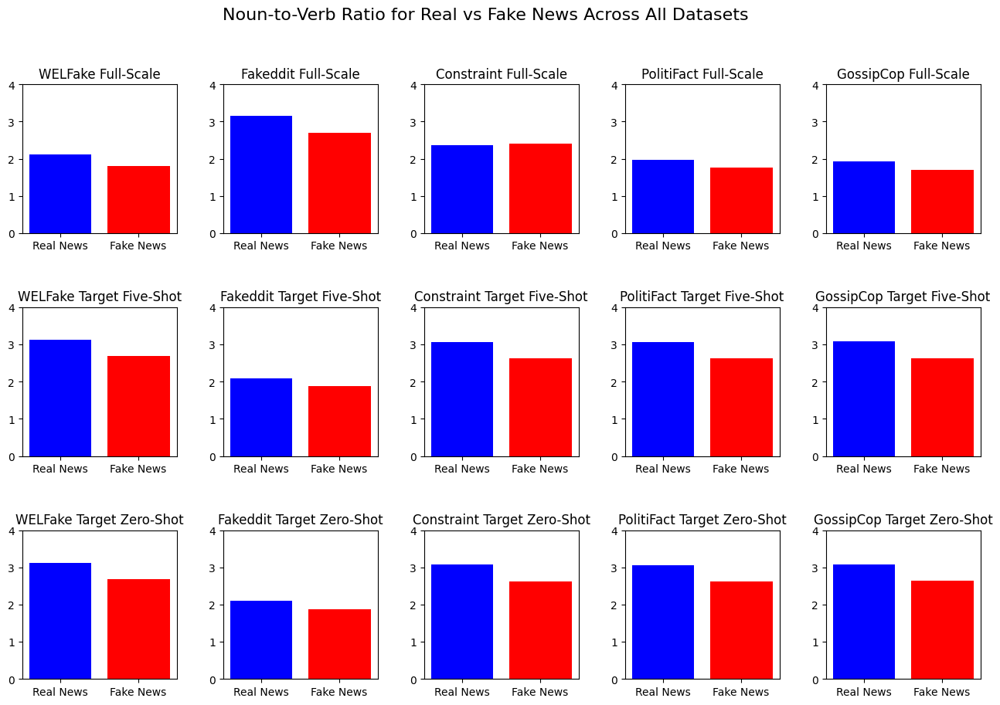

In [82]:
gramm_feat_extractor.plotNounToVerbRatio(all_pivoted_pos_tag_dfs_concat)

These noun-to-verb ratio plots now show that with the exception of Constraint, real news tends to contain more nouns than verbs than fake news. As such, this is a useful feature that can be included in the feature sets to improve classifier performance *across* datasets.

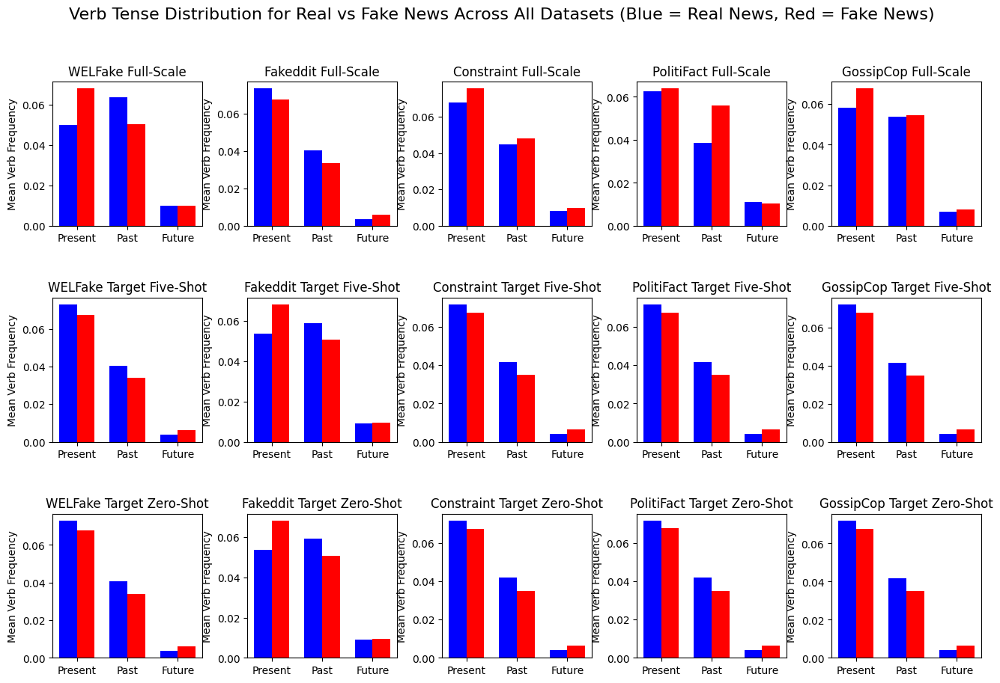

In [83]:
gramm_feat_extractor.plotVerbTenseDistribution(all_pivoted_pos_tag_dfs_concat)

- Four out of five (excluding Fakeddit) datasets contain more present-tense verbs in fake news rather than in real news.
- In the case of past tense verbs, WELFake and Fakeddit contain more of these verbs in the real news than in the fake news datasets, but the tendency is reversed for the other three datasets.
- For future-tense words (modal verbs), there is no generalizable pattern across the five core datasets.
- Verb tense distribution across real and fake news seems to differ considerably across the datasets.

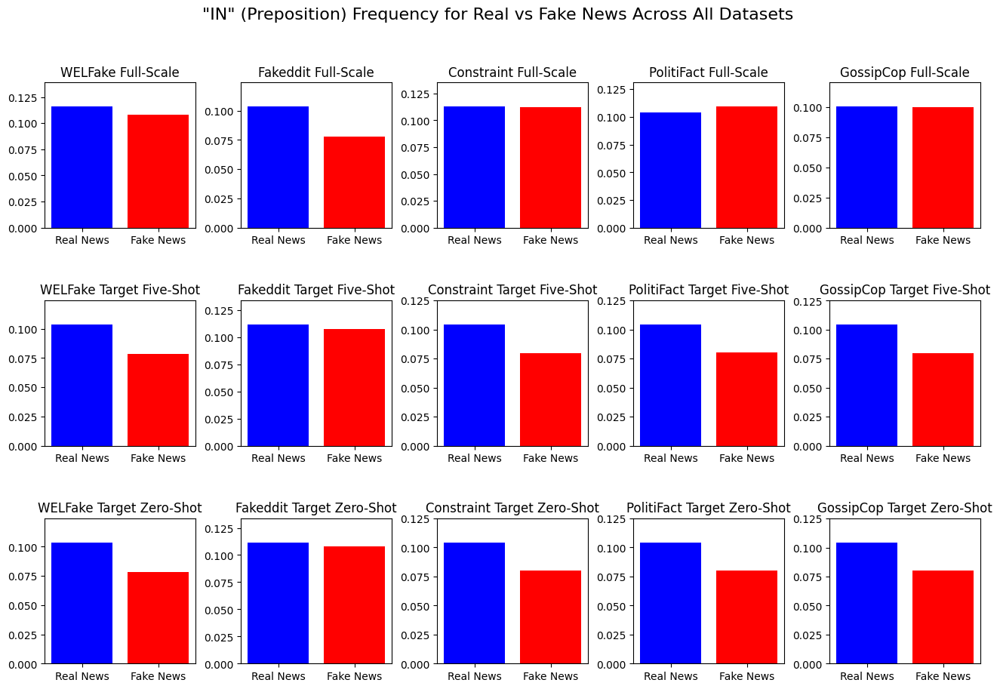

In [84]:
gramm_feat_extractor.plotPrepositionFrequenciesFakeVsReal(all_pivoted_pos_tag_dfs_concat)

For the majority of the datasets, there were more tokens tagged with the IN POS-tag for real news than for fake news, with the exception of the PolitiFact dataset. IN-tags are defined in the Penn Treeback tagset as either prepositions or subordinating conjunctions (i.e. "although", "because"). As such, a greater frequency of these tags can signal the construction of more complex sentences and expressions, indicating that real news contains more complex language, as shown also with the Flesch-Kincaid readability scores (with the exception of the PolitiFact dataset).

### Extracting Modal Verb Patterns for the Different Datasets

Comparing usage of modal verbs (e.g. "shall", "would", "might") can also expose some of the core patterns that differentiate fake news from real news.  Here, I will apply a function that calculates the normalized (by text lengths) frequencies of the nine main English-language modal verbs for the 15 datasets, and compare the mean frequencies per dataset between fake news and real news.

In [22]:
modal_save_path = "../FPData/ModalVerbFrequencies" # Save the avg modal verb freqs as it takes a long time to calculate them

In [22]:
# ## CHECK THE FUNCTION FOR EXTRACTING NORMALIZED MODAL VERB MEAN FREQUENCIES ACTUALLY WORKS
# print("Processing Modal Verb Features for WELFake Real News Dataset...")
# wf_df_with_modal_verb_features_real, wf_modal_verb_avgs_dict_real, wf_modal_verb_avgs_df_real = gramm_feat_extractor.extractModalVerbFreqs(
#                                                                                                     wf_df_real, "WELFake_Real",
#                                                                                                     modal_save_path
#                                                                                                 )

In [21]:
# ############# Extracting modal verb freqs for full-scale datasets
# print("Processing Modal Verb Features for WELFake Fake News Dataset...")
# wf_df_with_modal_verb_features_fake, wf_modal_verb_avgs_dict_fake, wf_modal_verb_avgs_df_fake = gramm_feat_extractor.extractModalVerbFreqs(
#                                                                                                     wf_df_fake, "WELFake_Fake",
#                                                                                                     modal_save_path
#                                                                                                 )

# print("Processing Modal Verb Features for Fakeddit Real News Dataset...")
# fe_df_with_modal_verb_features_real, fe_modal_verb_avgs_dict_real, fe_modal_verb_avgs_df_real = gramm_feat_extractor.extractModalVerbFreqs(
#                                                                                                     fe_df_real, "Fakeddit_Real",
#                                                                                                     modal_save_path
#                                                                                                 )

# print("Processing Modal Verb Features for Fakeddit Fake News Dataset...")
# fe_df_with_modal_verb_features_fake, fe_modal_verb_avgs_dict_fake, fe_modal_verb_avgs_df_fake = gramm_feat_extractor.extractModalVerbFreqs(
#                                                                                                     fe_df_fake, "Fakeddit_Fake",
#                                                                                                     modal_save_path
#                                                                                                 )

# print("Processing Modal Verb Features for Constraint Real News Dataset...")
# ct_df_with_modal_verb_features_real, ct_modal_verb_avgs_dict_real, ct_modal_verb_avgs_df_real = gramm_feat_extractor.extractModalVerbFreqs(
#                                                                                                     ct_df_real, "Constraint_Real",
#                                                                                                     modal_save_path
#                                                                                                 )

# print("Processing Modal Verb Features for Constraint Fake News Dataset...")
# ct_df_with_modal_verb_features_fake, ct_modal_verb_avgs_dict_fake, ct_modal_verb_avgs_df_fake = gramm_feat_extractor.extractModalVerbFreqs(
#                                                                                                     ct_df_fake, "Constraint_Fake",
#                                                                                                     modal_save_path
#                                                                                                 )

# print("Processing Modal Verb Features for PolitiFact Real News Dataset...")
# pf_df_with_modal_verb_features_real, pf_modal_verb_avgs_dict_real, pf_modal_verb_avgs_df_real = gramm_feat_extractor.extractModalVerbFreqs(
#                                                                                                     pf_df_real, "PolitiFact_Real",
#                                                                                                     modal_save_path
#                                                                                                 )

# print("Processing Modal Verb Features for PolitiFac Fake News Dataset...")
# pf_df_with_modal_verb_features_fake, pf_modal_verb_avgs_dict_fake, pf_modal_verb_avgs_df_fake = gramm_feat_extractor.extractModalVerbFreqs(
#                                                                                                     pf_df_fake, "PolitiFact_Fake",
#                                                                                                     modal_save_path
#                                                                                                 )

# print("Processing Modal Verb Features for GossipCop Real News Dataset...")
# gc_df_with_modal_verb_features_real, gc_modal_verb_avgs_dict_real, gc_modal_verb_avgs_df_real = gramm_feat_extractor.extractModalVerbFreqs(
#                                                                                                     gc_df_real, "GossipCop_Real",
#                                                                                                     modal_save_path
#                                                                                                 )

# print("Processing Modal Verb Features for GossipCop Fake News Dataset...")
# gc_df_with_modal_verb_features_fake, gc_modal_verb_avgs_dict_fake, gc_modal_verb_avgs_df_fake = gramm_feat_extractor.extractModalVerbFreqs(
#                                                                                                     gc_df_fake, "GossipCop_Fake",
#                                                                                                     modal_save_path
#                                                                                                 )



# ############# Extracting modal verb freqs for five-shot datasets
# print("Processing Modal Verb Features for Five-Shot Dataset: WELFake Target, Real News...")
# wf_df_5shot_modal_real, wf_df_5shot_modal_avgs_dict_real, wf_df_5shot_modal_avgs_df_real = gramm_feat_extractor.extractModalVerbFreqs(
#     wf_tgt_5shot_df_real, "FiveShot_WELFake_Real", modal_save_path
# )

# print("Processing Modal Verb Features for Five-Shot Dataset: WELFake Target, Fake News...")
# wf_df_5shot_modal_fake, wf_df_5shot_modal_avgs_dict_fake, wf_df_5shot_modal_avgs_df_fake = gramm_feat_extractor.extractModalVerbFreqs(
#     wf_tgt_5shot_df_fake, "FiveShot_WELFake_Fake", modal_save_path
# )

# print("Processing Modal Verb Features for Five-Shot Dataset: Fakeddit Target, Real News...")
# fe_df_5shot_modal_real, fe_df_5shot_modal_avgs_dict_real, fe_df_5shot_modal_avgs_df_real = gramm_feat_extractor.extractModalVerbFreqs(
#     fe_tgt_5shot_df_real, "FiveShot_Fakeddit_Real", modal_save_path
# )

# print("Processing Modal Verb Features for Five-Shot Dataset: Fakeddit Target, Fake News...")
# fe_df_5shot_modal_fake, fe_df_5shot_modal_avgs_dict_fake, fe_df_5shot_modal_avgs_df_fake = gramm_feat_extractor.extractModalVerbFreqs(
#     fe_tgt_5shot_df_fake, "FiveShot_Fakeddit_Fake", modal_save_path
# )

# print("Processing Modal Verb Features for Five-Shot Dataset: Constraint Target, Real News...")
# ct_df_5shot_modal_real, ct_df_5shot_modal_avgs_dict_real, ct_df_5shot_modal_avgs_df_real = gramm_feat_extractor.extractModalVerbFreqs(
#     ct_tgt_5shot_df_real, "FiveShot_Constraint_Real", modal_save_path
# )

# print("Processing Modal Verb Features for Five-Shot Dataset: Constraint Target, Fake News...")
# ct_df_5shot_modal_fake, ct_df_5shot_modal_avgs_dict_fake, ct_df_5shot_modal_avgs_df_fake = gramm_feat_extractor.extractModalVerbFreqs(
#     ct_tgt_5shot_df_fake, "FiveShot_Constraint_Fake", modal_save_path
# )

# print("Processing Modal Verb Features for Five-Shot Dataset: PolitiFact Target, Real News...")
# pf_df_5shot_modal_real, pf_df_5shot_modal_avgs_dict_real, pf_df_5shot_modal_avgs_df_real = gramm_feat_extractor.extractModalVerbFreqs(
#     pf_tgt_5shot_df_real, "FiveShot_PolitiFact_Real", modal_save_path
# )

# print("Processing Modal Verb Features for Five-Shot Dataset: PolitiFact Target, Fake News...")
# pf_df_5shot_modal_fake, pf_df_5shot_modal_avgs_dict_fake, pf_df_5shot_modal_avgs_df_fake = gramm_feat_extractor.extractModalVerbFreqs(
#     pf_tgt_5shot_df_fake, "FiveShot_PolitiFact_Fake", modal_save_path
# )
    
# print("Processing Modal Verb Features for Five-Shot Dataset: GossipCop Target, Real News...")
# gc_df_5shot_modal_real, gc_df_5shot_modal_avgs_dict_real, gc_df_5shot_modal_avgs_df_real = gramm_feat_extractor.extractModalVerbFreqs(
#     gc_tgt_5shot_df_real, "FiveShot_GossipCop_Real", modal_save_path
# )

# print("Processing Modal Verb Features for Five-Shot Dataset: GossipCop Target, Fake News...")
# gc_df_5shot_modal_fake, gc_df_5shot_modal_avgs_dict_fake, gc_df_5shot_modal_avgs_df_fake = gramm_feat_extractor.extractModalVerbFreqs(
#     gc_tgt_5shot_df_fake, "FiveShot_GossipCop_Fake", modal_save_path
# )

The process froze, restarting for the reamining datasets...

In [ ]:
 wf_df_5shot_modal_avgs_df_real

In [20]:
# ############# Extracting modal verb freqs for zero-shot datasets
# # print("Processing Modal Verb Features for Zero-Shot Dataset: WELFake Target, Real News...")
# # wf_df_0shot_modal_real, wf_df_0shot_modal_avgs_dict_real, wf_df_0shot_modal_avgs_df_real = gramm_feat_extractor.extractModalVerbFreqs(
# #     wf_tgt_0shot_df_real, "ZeroShot_WELFake_Real", modal_save_path
# # )

# # print("Processing Modal Verb Features for Zero-Shot Dataset: WELFake Target, Fake News...")
# # wf_df_0shot_modal_fake, wf_df_0shot_modal_avgs_dict_fake, wf_df_0shot_modal_avgs_df_fake = gramm_feat_extractor.extractModalVerbFreqs(
# #     wf_tgt_0shot_df_fake, "ZeroShot_WELFake_Fake", modal_save_path
# # )

# print("Processing Modal Verb Features for Zero-Shot Dataset: Fakeddit Target, Real News...")
# fe_df_0shot_modal_real, fe_df_0shot_modal_avgs_dict_real, fe_df_0shot_modal_avgs_df_real = gramm_feat_extractor.extractModalVerbFreqs(
#     fe_tgt_0shot_df_real, "ZeroShot_Fakeddit_Real", modal_save_path
# )

# print("Processing Modal Verb Features for Zero-Shot Dataset: Fakeddit Target, Fake News...")
# fe_df_0shot_modal_fake, fe_df_0shot_modal_avgs_dict_fake, fe_df_0shot_modal_avgs_df_fake = gramm_feat_extractor.extractModalVerbFreqs(
#     fe_tgt_0shot_df_fake, "ZeroShot_Fakeddit_Fake", modal_save_path
# )

# print("Processing Modal Verb Features for Zero-Shot Dataset: Constraint Target, Real News...")
# ct_df_0shot_modal_real, ct_df_0shot_modal_avgs_dict_real, ct_df_0shot_modal_avgs_df_real = gramm_feat_extractor.extractModalVerbFreqs(
#     ct_tgt_0shot_df_real, "ZeroShot_Constraint_Real", modal_save_path
# )

# print("Processing Modal Verb Features for Zero-Shot Dataset: Constraint Target, Fake News...")
# ct_df_0shot_modal_fake, ct_df_0shot_modal_avgs_dict_fake, ct_df_0shot_modal_avgs_df_fake = gramm_feat_extractor.extractModalVerbFreqs(
#     ct_tgt_0shot_df_fake, "ZeroShot_Constraint_Fake", modal_save_path
# )

# print("Processing Modal Verb Features for Zero-Shot Dataset: PolitiFact Target, Real News...")
# pf_df_0shot_modal_real, pf_df_0shot_modal_avgs_dict_real, pf_df_0shot_modal_avgs_df_real = gramm_feat_extractor.extractModalVerbFreqs(
#     pf_tgt_0shot_df_real, "ZeroShot_PolitiFact_Real", modal_save_path
# )

# print("Processing Modal Verb Features for Zero-Shot Dataset: PolitiFact Target, Fake News...")
# pf_df_0shot_modal_fake, pf_df_0shot_modal_avgs_dict_fake, pf_df_0shot_modal_avgs_df_fake = gramm_feat_extractor.extractModalVerbFreqs(
#     pf_tgt_0shot_df_fake, "ZeroShot_PolitiFact_Fake", modal_save_path
# )

# print("Processing Modal Verb Features for Zero-Shot Dataset: GossipCop Target, Real News...")
# gc_df_0shot_modal_real, gc_df_0shot_modal_avgs_dict_real, gc_df_0shot_modal_avgs_df_real = gramm_feat_extractor.extractModalVerbFreqs(
#     gc_tgt_0shot_df_real, "ZeroShot_GossipCop_Real", modal_save_path
# )

# print("Processing Modal Verb Features for Zero-Shot Dataset: GossipCop Target, Fake News...")
# gc_df_0shot_modal_fake, gc_df_0shot_modal_avgs_dict_fake, gc_df_0shot_modal_avgs_df_fake = gramm_feat_extractor.extractModalVerbFreqs(
#     gc_tgt_0shot_df_fake, "ZeroShot_GossipCop_Fake", modal_save_path
# )

In [28]:
# Load in the files again, it kept crashing while processing, so I had to save and reload...
wf_modal_verb_avgs_df_real = pd.read_csv("../FPData/ModalVerbFrequencies/WELFake_Real_modal_verb_freqs.csv",
                                        index_col="dataset_name")
wf_modal_verb_avgs_df_fake = pd.read_csv("../FPData/ModalVerbFrequencies/WELFake_Fake_modal_verb_freqs.csv",
                                        index_col="dataset_name")
fe_modal_verb_avgs_df_real = pd.read_csv("../FPData/ModalVerbFrequencies/Fakeddit_Real_modal_verb_freqs.csv",
                                        index_col="dataset_name")
fe_modal_verb_avgs_df_fake = pd.read_csv("../FPData/ModalVerbFrequencies/Fakeddit_Fake_modal_verb_freqs.csv",
                                        index_col="dataset_name")
ct_modal_verb_avgs_df_real = pd.read_csv("../FPData/ModalVerbFrequencies/Constraint_Real_modal_verb_freqs.csv",
                                        index_col="dataset_name")
ct_modal_verb_avgs_df_fake = pd.read_csv("../FPData/ModalVerbFrequencies/Constraint_Fake_modal_verb_freqs.csv",
                                        index_col="dataset_name")
pf_modal_verb_avgs_df_real = pd.read_csv("../FPData/ModalVerbFrequencies/PolitiFact_Real_modal_verb_freqs.csv",
                                        index_col="dataset_name")
pf_modal_verb_avgs_df_fake = pd.read_csv("../FPData/ModalVerbFrequencies/PolitiFact_Fake_modal_verb_freqs.csv",
                                        index_col="dataset_name")
gc_modal_verb_avgs_df_real = pd.read_csv("../FPData/ModalVerbFrequencies/GossipCop_Real_modal_verb_freqs.csv",
                                        index_col="dataset_name")
gc_modal_verb_avgs_df_fake = pd.read_csv("../FPData/ModalVerbFrequencies/GossipCop_Fake_modal_verb_freqs.csv",
                                        index_col="dataset_name")
wf_df_5shot_modal_avgs_df_real = pd.read_csv("../FPData/ModalVerbFrequencies/FiveShot_WELFake_Real_modal_verb_freqs.csv",
                                        index_col="dataset_name")
wf_df_5shot_modal_avgs_df_fake = pd.read_csv("../FPData/ModalVerbFrequencies/FiveShot_WELFake_Fake_modal_verb_freqs.csv",
                                        index_col="dataset_name")
fe_df_5shot_modal_avgs_df_real = pd.read_csv("../FPData/ModalVerbFrequencies/FiveShot_Fakeddit_Real_modal_verb_freqs.csv",
                                        index_col="dataset_name")
fe_df_5shot_modal_avgs_df_fake = pd.read_csv("../FPData/ModalVerbFrequencies/FiveShot_Fakeddit_Fake_modal_verb_freqs.csv",
                                        index_col="dataset_name")
ct_df_5shot_modal_avgs_df_real = pd.read_csv("../FPData/ModalVerbFrequencies/FiveShot_Constraint_Real_modal_verb_freqs.csv",
                                        index_col="dataset_name")
ct_df_5shot_modal_avgs_df_fake = pd.read_csv("../FPData/ModalVerbFrequencies/FiveShot_Constraint_Fake_modal_verb_freqs.csv",
                                        index_col="dataset_name")
pf_df_5shot_modal_avgs_df_real = pd.read_csv("../FPData/ModalVerbFrequencies/FiveShot_PolitiFact_Real_modal_verb_freqs.csv",
                                        index_col="dataset_name")
pf_df_5shot_modal_avgs_df_fake = pd.read_csv("../FPData/ModalVerbFrequencies/FiveShot_PolitiFact_Fake_modal_verb_freqs.csv",
                                        index_col="dataset_name")
gc_df_5shot_modal_avgs_df_real = pd.read_csv("../FPData/ModalVerbFrequencies/FiveShot_GossipCop_Real_modal_verb_freqs.csv",
                                        index_col="dataset_name")
gc_df_5shot_modal_avgs_df_fake = pd.read_csv("../FPData/ModalVerbFrequencies/FiveShot_GossipCop_Fake_modal_verb_freqs.csv",
                                        index_col="dataset_name")
wf_df_0shot_modal_avgs_df_real = pd.read_csv("../FPData/ModalVerbFrequencies/ZeroShot_WELFake_Real_modal_verb_freqs.csv",
                                        index_col="dataset_name")
wf_df_0shot_modal_avgs_df_fake = pd.read_csv("../FPData/ModalVerbFrequencies/ZeroShot_WELFake_Fake_modal_verb_freqs.csv",
                                        index_col="dataset_name")

In [30]:
# Create a list to concatenate the modal verb freq DFs
modal_freq_dfs_list = [
    wf_modal_verb_avgs_df_real, wf_modal_verb_avgs_df_fake,
    fe_modal_verb_avgs_df_real, fe_modal_verb_avgs_df_fake,
    ct_modal_verb_avgs_df_real, ct_modal_verb_avgs_df_fake,
    pf_modal_verb_avgs_df_real, pf_modal_verb_avgs_df_fake,
    gc_modal_verb_avgs_df_real, gc_modal_verb_avgs_df_fake,
    wf_df_5shot_modal_avgs_df_real, wf_df_5shot_modal_avgs_df_fake,
    fe_df_5shot_modal_avgs_df_real, fe_df_5shot_modal_avgs_df_fake,
    ct_df_5shot_modal_avgs_df_real, ct_df_5shot_modal_avgs_df_fake,
    pf_df_5shot_modal_avgs_df_real, pf_df_5shot_modal_avgs_df_fake,
    gc_df_5shot_modal_avgs_df_real, gc_df_5shot_modal_avgs_df_fake,
    wf_df_0shot_modal_avgs_df_real, wf_df_0shot_modal_avgs_df_fake,
    fe_df_0shot_modal_avgs_df_real, fe_df_0shot_modal_avgs_df_fake,
    ct_df_0shot_modal_avgs_df_real, ct_df_0shot_modal_avgs_df_fake,
    pf_df_0shot_modal_avgs_df_real, pf_df_0shot_modal_avgs_df_fake,
    gc_df_0shot_modal_avgs_df_real, gc_df_0shot_modal_avgs_df_fake
]

In [32]:
concat_modal_freqs_df = pd.concat(modal_freq_dfs_list)
concat_modal_freqs_df.head(15)

,can,could,may,might,must,shall,should,will,would
dataset_name,,,,,,,,,
WELFake_Real,0.001135,0.001189,0.000450,0.000262,0.000303,0.000009,0.000689,0.002747,0.002861
WELFake_Fake,0.002032,0.000917,0.000533,0.000338,0.000295,0.000041,0.000913,0.002469,0.001935
Fakeddit_Real,0.001391,0.000488,0.000297,0.000096,0.000099,0.000004,0.000231,0.000858,0.000356
Fakeddit_Fake,0.001911,0.000591,0.000201,0.000204,0.000273,0.000121,0.000506,0.001489,0.000761
Constraint_Real,0.002330,0.000735,0.001054,0.000095,0.000318,0.000027,0.000744,0.002196,0.000382
Constraint_Fake,0.003440,0.000628,0.000448,0.000114,0.000228,0.000034,0.000754,0.003159,0.000813
PolitiFact_Real,0.002333,0.000845,0.000612,0.000192,0.000505,0.000151,0.001037,0.003061,0.002086
PolitiFact_Fake,0.001648,0.001000,0.000825,0.000301,0.000218,0.000087,0.000763,0.003425,0.001737
GossipCop_Real,0.001610,0.000731,0.000475,0.000257,0.000113,0.000006,0.000308,0.002127,0.001167


Now let's plot them!

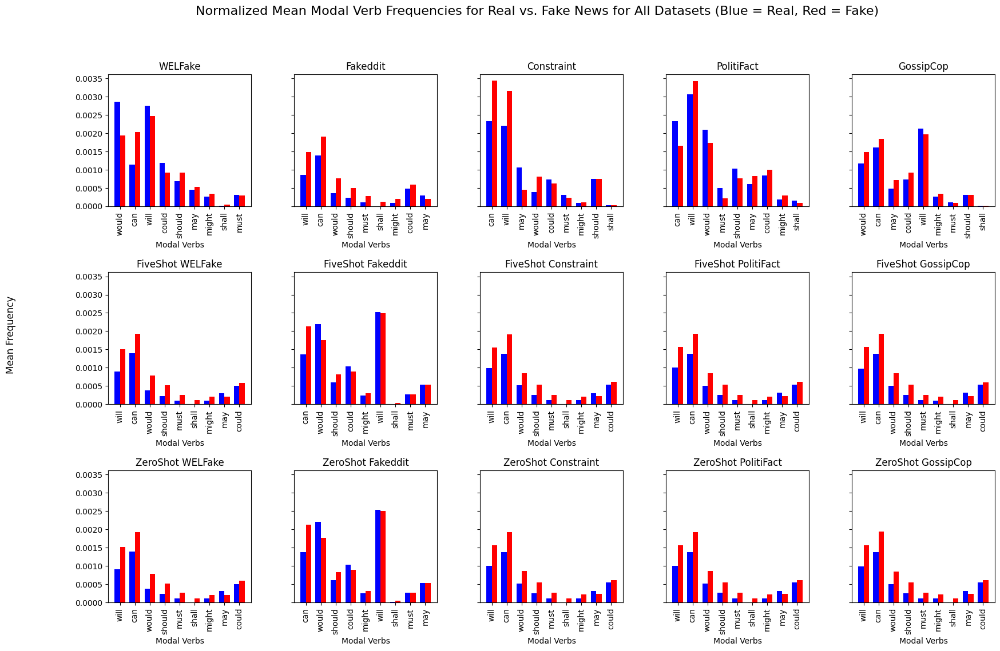

In [61]:
gramm_feat_extractor.plotModalVerbFrequencies(concat_modal_freqs_df)

Unfortunately, the differences between real and fake news in terms of modal verbs used differ consideably between the datasets, without any consistent trends. This is disappointing as it was hoped for that a more generalizable pattern would emerge.

### Extracting Pronoun Frequencies for 1st Person, 2nd Person and 3rd Person Pronouns

Pronoun usage might also allow us to make generalizable distinctions between real and fake news, as fake news might use more pronouns of certain types (e.g. 2nd person to directly "address" the user may be an indicator of propaganda texts).

In [23]:
# Save progress in this directory, as it takes a long time
pronoun_save_path = "../FPData/PronounFrequencies"

In [24]:
# Check it works on the first dataset
print("Processing Pronoun Features for WELFake Real News Dataset...")
wf_df_with_pronoun_features_real, wf_pronoun_avgs_dict_real, wf_pronoun_avgs_df_real = gramm_feat_extractor.extractPersonalPronounFreqs(
                                                                                                    wf_df_real, "WELFake_Real",
                                                                                                    pronoun_save_path
                                                                                                )

Processing Pronoun Features for WELFake Real News Dataset...


In [25]:
# Apply to all other full-scale datasets

# WELFake Fake News
print("Processing Pronoun Features for WELFake Fake News Dataset...")
wf_df_with_pronoun_features_fake, wf_pronoun_avgs_dict_fake, wf_pronoun_avgs_df_fake = gramm_feat_extractor.extractPersonalPronounFreqs(
    wf_df_fake, "WELFake_Fake", pronoun_save_path
)

# Fakeddit Real News
print("Processing Pronoun Features for Fakeddit Real News Dataset...")
    fe_df_real, "Fakeddit_Real", pronoun_save_path
)

# Fakeddit Fake News
print("Processing Pronoun Features for Fakeddit Fake News Dataset...")
fe_df_with_pronoun_features_fake, fe_pronoun_avgs_dict_fake, fe_pronoun_avgs_df_fake = gramm_feat_extractor.extractPersonalPronounFreqs(
    fe_df_fake, "Fakeddit_Fake", pronoun_save_path
)

# Constraint Real News
print("Processing Pronoun Features for Constraint Real News Dataset...")
ct_df_with_pronoun_features_real, ct_pronoun_avgs_dict_real, ct_pronoun_avgs_df_real = gramm_feat_extractor.extractPersonalPronounFreqs(
    ct_df_real, "Constraint_Real", pronoun_save_path
)

# Constraint Fake News
print("Processing Pronoun Features for Constraint Fake News Dataset...")
ct_df_with_pronoun_features_fake, ct_pronoun_avgs_dict_fake, ct_pronoun_avgs_df_fake = gramm_feat_extractor.extractPersonalPronounFreqs(
    ct_df_fake, "Constraint_Fake", pronoun_save_path
)

# PolitiFact Real News
print("Processing Pronoun Features for PolitiFact Real News Dataset...")
pf_df_with_pronoun_features_real, pf_pronoun_avgs_dict_real, pf_pronoun_avgs_df_real = gramm_feat_extractor.extractPersonalPronounFreqs(
    pf_df_real, "PolitiFact_Real", pronoun_save_path
)

# PolitiFact Fake News
print("Processing Pronoun Features for PolitiFact Fake News Dataset...")
pf_df_with_pronoun_features_fake, pf_pronoun_avgs_dict_fake, pf_pronoun_avgs_df_fake = gramm_feat_extractor.extractPersonalPronounFreqs(
    pf_df_fake, "PolitiFact_Fake", pronoun_save_path
)

# GossipCop Real News
print("Processing Pronoun Features for GossipCop Real News Dataset...")
gc_df_with_pronoun_features_real, gc_pronoun_avgs_dict_real, gc_pronoun_avgs_df_real = gramm_feat_extractor.extractPersonalPronounFreqs(
    gc_df_real, "GossipCop_Real", pronoun_save_path
)

# GossipCop Fake News
print("Processing Pronoun Features for GossipCop Fake News Dataset...")
gc_df_with_pronoun_features_fake, gc_pronoun_avgs_dict_fake, gc_pronoun_avgs_df_fake = gramm_feat_extractor.extractPersonalPronounFreqs(
    gc_df_fake, "GossipCop_Fake", pronoun_save_path
)

Processing Pronoun Features for WELFake Fake News Dataset...


Processing Pronoun Features for Fakeddit Real News Dataset...


Processing Pronoun Features for Fakeddit Fake News Dataset...


Processing Pronoun Features for Constraint Real News Dataset...


Processing Pronoun Features for Constraint Fake News Dataset...


Processing Pronoun Features for PolitiFact Real News Dataset...


Processing Pronoun Features for PolitiFact Fake News Dataset...


Processing Pronoun Features for GossipCop Real News Dataset...


Processing Pronoun Features for GossipCop Fake News Dataset...


In [26]:
# Processing Pronoun Features for Five-Shot Datasets

# WELFake Target, Real News
print("Processing Pronoun Features for Five-Shot Dataset: WELFake Target, Real News...")
wf_df_5shot_pronoun_real, wf_df_5shot_pronoun_avgs_dict_real, wf_df_5shot_pronoun_avgs_df_real = gramm_feat_extractor.extractPersonalPronounFreqs(
    wf_tgt_5shot_df_real, "FiveShot_WELFake_Real", pronoun_save_path
)

# WELFake Target, Fake News
print("Processing Pronoun Features for Five-Shot Dataset: WELFake Target, Fake News...")
wf_df_5shot_pronoun_fake, wf_df_5shot_pronoun_avgs_dict_fake, wf_df_5shot_pronoun_avgs_df_fake = gramm_feat_extractor.extractPersonalPronounFreqs(
    wf_tgt_5shot_df_fake, "FiveShot_WELFake_Fake", pronoun_save_path
)

# Fakeddit Target, Real News
print("Processing Pronoun Features for Five-Shot Dataset: Fakeddit Target, Real News...")
fe_df_5shot_pronoun_real, fe_df_5shot_pronoun_avgs_dict_real, fe_df_5shot_pronoun_avgs_df_real = gramm_feat_extractor.extractPersonalPronounFreqs(
    fe_tgt_5shot_df_real, "FiveShot_Fakeddit_Real", pronoun_save_path
)

# Fakeddit Target, Fake News
print("Processing Pronoun Features for Five-Shot Dataset: Fakeddit Target, Fake News...")
fe_df_5shot_pronoun_fake, fe_df_5shot_modal_avgs_dict_fake, fe_df_5shot_pronoun_avgs_df_fake = gramm_feat_extractor.extractPersonalPronounFreqs(
    fe_tgt_5shot_df_fake, "FiveShot_Fakeddit_Fake", pronoun_save_path
)

# Constraint Target, Real News
print("Processing Pronoun Features for Five-Shot Dataset: Constraint Target, Real News...")
ct_df_5shot_pronoun_real, ct_df_5shot_pronoun_avgs_dict_real, ct_df_5shot_pronoun_avgs_df_real = gramm_feat_extractor.extractPersonalPronounFreqs(
    ct_tgt_5shot_df_real, "FiveShot_Constraint_Real", pronoun_save_path
)

# Constraint Target, Fake News
print("Processing Pronoun Features for Five-Shot Dataset: Constraint Target, Fake News...")
ct_df_5shot_pronoun_fake, ct_df_5shot_pronoun_avgs_dict_fake, ct_df_5shot_pronoun_avgs_df_fake = gramm_feat_extractor.extractPersonalPronounFreqs(
    ct_tgt_5shot_df_fake, "FiveShot_Constraint_Fake", pronoun_save_path
)

# PolitiFact Target, Real News
print("Processing Pronoun Features for Five-Shot Dataset: PolitiFact Target, Real News...")
pf_df_5shot_pronoun_real, pf_df_5shot_pronoun_avgs_dict_real, pf_df_5shot_pronoun_avgs_df_real = gramm_feat_extractor.extractPersonalPronounFreqs(
    pf_tgt_5shot_df_real, "FiveShot_PolitiFact_Real", pronoun_save_path
)

# PolitiFact Target, Fake News
print("Processing Pronoun Features for Five-Shot Dataset: PolitiFact Target, Fake News...")
pf_df_5shot_pronoun_fake, pf_df_5shot_pronoun_avgs_dict_fake, pf_df_5shot_pronoun_avgs_df_fake = gramm_feat_extractor.extractPersonalPronounFreqs(
    pf_tgt_5shot_df_fake, "FiveShot_PolitiFact_Fake", pronoun_save_path
)

# GossipCop Target, Real News
print("Processing Pronoun Features for Five-Shot Dataset: GossipCop Target, Real News...")
gc_df_5shot_pronoun_real, gc_df_5shot_pronoun_avgs_dict_real, gc_df_5shot_pronoun_avgs_df_real = gramm_feat_extractor.extractPersonalPronounFreqs(
    gc_tgt_5shot_df_real, "FiveShot_GossipCop_Real", pronoun_save_path
)

# GossipCop Target, Fake News
print("Processing Pronoun Features for Five-Shot Dataset: GossipCop Target, Fake News...")
gc_df_5shot_pronoun_fake, gc_df_5shot_pronoun_avgs_dict_fake, gc_df_5shot_pronoun_avgs_df_fake = gramm_feat_extractor.extractPersonalPronounFreqs(
    gc_tgt_5shot_df_fake, "FiveShot_GossipCop_Fake", pronoun_save_path
)


Processing Pronoun Features for Five-Shot Dataset: WELFake Target, Real News...


Processing Pronoun Features for Five-Shot Dataset: WELFake Target, Fake News...


Processing Pronoun Features for Five-Shot Dataset: Fakeddit Target, Real News...


Processing Pronoun Features for Five-Shot Dataset: Fakeddit Target, Fake News...


Processing Pronoun Features for Five-Shot Dataset: Constraint Target, Real News...


Processing Pronoun Features for Five-Shot Dataset: Constraint Target, Fake News...


Processing Pronoun Features for Five-Shot Dataset: PolitiFact Target, Real News...


Processing Pronoun Features for Five-Shot Dataset: PolitiFact Target, Fake News...


Processing Pronoun Features for Five-Shot Dataset: GossipCop Target, Real News...


Processing Pronoun Features for Five-Shot Dataset: GossipCop Target, Fake News...


In [28]:
# Processing Pronoun Features for Zero-Shot Datasets

# WELFake Target, Real News
# print("Processing Pronoun Features for Zero-Shot Dataset: WELFake Target, Real News...")
# wf_df_0shot_pronoun_real, wf_df_0shot_pronoun_avgs_dict_real, wf_df_0shot_pronoun_avgs_df_real = gramm_feat_extractor.extractPersonalPronounFreqs(
#     wf_tgt_0shot_df_real, "ZeroShot_WELFake_Real", pronoun_save_path
# )

# WELFake Target, Fake News
print("Processing Pronoun Features for Zero-Shot Dataset: WELFake Target, Fake News...")
wf_df_0shot_pronoun_fake, wf_df_0shot_pronoun_avgs_dict_fake, wf_df_0shot_pronoun_avgs_df_fake = gramm_feat_extractor.extractPersonalPronounFreqs(
    wf_tgt_0shot_df_fake, "ZeroShot_WELFake_Fake", pronoun_save_path
)

# Fakeddit Target, Real News
print("Processing Pronoun Features for Zero-Shot Dataset: Fakeddit Target, Real News...")
fe_df_0shot_pronoun_real, fe_df_0shot_pronoun_avgs_dict_real, fe_df_0shot_pronoun_avgs_df_real = gramm_feat_extractor.extractPersonalPronounFreqs(
    fe_tgt_0shot_df_real, "ZeroShot_Fakeddit_Real", pronoun_save_path
)

# Fakeddit Target, Fake News
print("Processing Pronoun Features for Zero-Shot Dataset: Fakeddit Target, Fake News...")
fe_df_0shot_pronoun_fake, fe_df_0shot_pronoun_avgs_dict_fake, fe_df_0shot_pronoun_avgs_df_fake = gramm_feat_extractor.extractPersonalPronounFreqs(
    fe_tgt_0shot_df_fake, "ZeroShot_Fakeddit_Fake", pronoun_save_path
)

# Constraint Target, Real News
print("Processing Pronoun Features for Zero-Shot Dataset: Constraint Target, Real News...")
ct_df_0shot_pronoun_real, ct_df_0shot_pronoun_avgs_dict_real, ct_df_0shot_pronoun_avgs_df_real = gramm_feat_extractor.extractPersonalPronounFreqs(
    ct_tgt_0shot_df_real, "ZeroShot_Constraint_Real", pronoun_save_path
)

# Constraint Target, Fake News
print("Processing Pronoun Features for Zero-Shot Dataset: Constraint Target, Fake News...")
ct_df_0shot_pronoun_fake, ct_df_0shot_pronoun_avgs_dict_fake, ct_df_0shot_pronoun_avgs_df_fake = gramm_feat_extractor.extractPersonalPronounFreqs(
    ct_tgt_0shot_df_fake, "ZeroShot_Constraint_Fake", pronoun_save_path
)

# PolitiFact Target, Real News
print("Processing Pronoun Features for Zero-Shot Dataset: PolitiFact Target, Real News...")
pf_df_0shot_pronoun_real, pf_df_0shot_pronoun_avgs_dict_real, pf_df_0shot_pronoun_avgs_df_real = gramm_feat_extractor.extractPersonalPronounFreqs(
    pf_tgt_0shot_df_real, "ZeroShot_PolitiFact_Real", pronoun_save_path
)

# PolitiFact Target, Fake News
print("Processing Pronoun Features for Zero-Shot Dataset: PolitiFact Target, Fake News...")
pf_df_0shot_pronoun_fake, pf_df_0shot_pronoun_avgs_dict_fake, pf_df_0shot_pronoun_avgs_df_fake = gramm_feat_extractor.extractPersonalPronounFreqs(
    pf_tgt_0shot_df_fake, "ZeroShot_PolitiFact_Fake", pronoun_save_path
)

# GossipCop Target, Real News
print("Processing Pronoun Features for Zero-Shot Dataset: GossipCop Target, Real News...")
gc_df_0shot_pronoun_real, gc_df_0shot_pronoun_avgs_dict_real, gc_df_0shot_pronoun_avgs_df_real = gramm_feat_extractor.extractPersonalPronounFreqs(
    gc_tgt_0shot_df_real, "ZeroShot_GossipCop_Real", pronoun_save_path
)

# GossipCop Target, Fake News
print("Processing Pronoun Features for Zero-Shot Dataset: GossipCop Target, Fake News...")
gc_df_0shot_pronoun_fake, gc_df_0shot_pronoun_avgs_dict_fake, gc_df_0shot_pronoun_avgs_df_fake = gramm_feat_extractor.extractPersonalPronounFreqs(
    gc_tgt_0shot_df_fake, "ZeroShot_GossipCop_Fake", pronoun_save_path
)

Processing Pronoun Features for Zero-Shot Dataset: WELFake Target, Fake News...


Processing Pronoun Features for Zero-Shot Dataset: Fakeddit Target, Real News...


Processing Pronoun Features for Zero-Shot Dataset: Fakeddit Target, Fake News...


Processing Pronoun Features for Zero-Shot Dataset: Constraint Target, Real News...


Processing Pronoun Features for Zero-Shot Dataset: Constraint Target, Fake News...


Processing Pronoun Features for Zero-Shot Dataset: PolitiFact Target, Real News...


Processing Pronoun Features for Zero-Shot Dataset: PolitiFact Target, Fake News...


Processing Pronoun Features for Zero-Shot Dataset: GossipCop Target, Real News...


Processing Pronoun Features for Zero-Shot Dataset: GossipCop Target, Fake News...


In [90]:
# Concatenate pronoun DFs...
concatenated_pronoun_avg_dfs = pd.concat([
    wf_pronoun_avgs_df_real, wf_pronoun_avgs_df_fake,
    fe_pronoun_avgs_df_real, fe_pronoun_avgs_df_fake,
    ct_pronoun_avgs_df_real, ct_pronoun_avgs_df_fake,
    pf_pronoun_avgs_df_real, pf_pronoun_avgs_df_fake,
    gc_pronoun_avgs_df_real, gc_pronoun_avgs_df_fake,
    wf_df_5shot_pronoun_avgs_df_real, wf_df_5shot_pronoun_avgs_df_fake,
    fe_df_5shot_pronoun_avgs_df_real, fe_df_5shot_pronoun_avgs_df_fake,
    ct_df_5shot_pronoun_avgs_df_real, ct_df_5shot_pronoun_avgs_df_fake,
    pf_df_5shot_pronoun_avgs_df_real, pf_df_5shot_pronoun_avgs_df_fake,
    gc_df_5shot_pronoun_avgs_df_real, gc_df_5shot_pronoun_avgs_df_fake,
    wf_df_0shot_pronoun_avgs_df_real, wf_df_0shot_pronoun_avgs_df_fake,
    fe_df_0shot_pronoun_avgs_df_real, fe_df_0shot_pronoun_avgs_df_fake,
    ct_df_0shot_pronoun_avgs_df_real, ct_df_0shot_pronoun_avgs_df_fake,
    pf_df_0shot_pronoun_avgs_df_real, pf_df_0shot_pronoun_avgs_df_fake,
    gc_df_0shot_pronoun_avgs_df_real, gc_df_0shot_pronoun_avgs_df_fake
])

concatenated_pronoun_avg_dfs.head()

,1st_person_pronouns,2nd_person_pronouns,3rd_person_pronouns
dataset_name,,,
WELFake_Real,0.004669,0.001527,0.027747
WELFake_Fake,0.008106,0.005150,0.034237
Fakeddit_Real,0.011862,0.002188,0.015618
Fakeddit_Fake,0.013611,0.008490,0.022134
Constraint_Real,0.012070,0.004066,0.008745


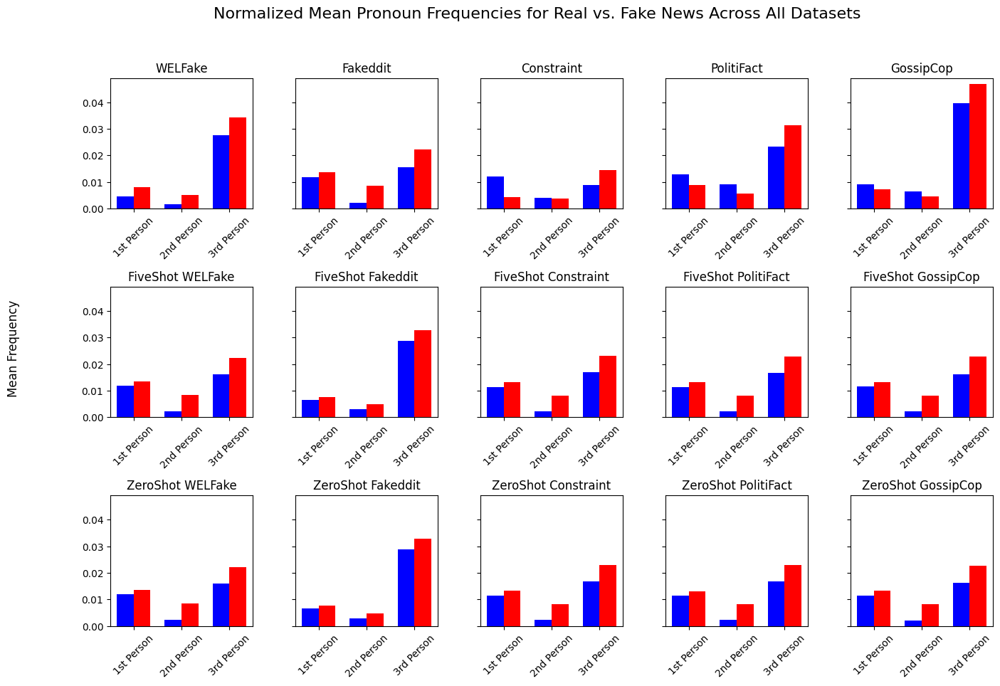

In [106]:
gramm_feat_extractor.plotPersonalPronounFreqs(concatenated_pronoun_avg_dfs)

1. 1st person pronouns were used more in fake news than in real news for the WELFake and Fakeddit datasets, but the tendency was reversed for the other three datasets; thus this features is inconsistent in its distribution across the five source datasets.

2. The same occurred for second-person personal pronouns.

3. However, for **all** datasets, third-person pronoun counts were consistently higher for fake news than for real news, hinting at consistencies between narrative style used in disinformation across domains. The higher frequency of third-person pronouns in fake news may be due to the authors' attempts to emulate a "more detached", factual, and objective tone, rather than signalling that the writer's opinion could be subjective. Furthermore, fake news texts might pretend to cite "experts" (e.g. "they said, they reported... etc.") to give an illusion of credibility and authority.